## Instalação e Imports

In [ ]:
!pip install anthropic pymupdf4llm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.4/176.4 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 88.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 MB 53.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.6/23.6 MB 85.7 MB/s eta 0:00:00


In [ ]:
import math
import json
import asyncio
import asyncio
import time
import plotly.graph_objects as go
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pymupdf4llm
import nltk
import re
import torch
import plotly.express as px

#Modelos
import google.genai as genai
from openai import AsyncOpenAI
from anthropic import AsyncAnthropic

from enum import Enum
from pathlib import Path
from pydantic import BaseModel, TypeAdapter
from google.colab import data_table
from typing import List, Any, TypeVar, Type
from google.colab import userdata
from abc import ABC, abstractmethod
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sentence_transformers import SentenceTransformer
from scipy.stats import spearmanr
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    balanced_accuracy_score,
    accuracy_score,
    matthews_corrcoef
)
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
)

In [ ]:
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

## Tipos e Variáveis

### Tipos

In [ ]:
class AnswerOption(str, Enum):
    CONCORDO_FORTEMENTE = ("concordo_fortemente", 1.0)
    CONCORDO = ("concordo", 0.5)
    NEUTRO_INCERTO = ("neutro_incerto", 0.0)
    DISCORDO = ("discordo", -0.5)
    DISCORDO_FORTEMENTE = ("discordo_fortemente", -1.0)

    def __new__(cls, value: str, score: float):
        obj = str.__new__(cls, value)
        obj._value_ = value
        obj.score = score
        return obj

class Answer(BaseModel):
    id: int
    answer: AnswerOption

class Answers(BaseModel):
    answers: list[Answer]

class Effect(BaseModel):
    econ: int
    dipl: int
    govt: int
    scty: int

    def to_list(self) -> list[int]:
        return list(self.model_dump().values())

class Question(BaseModel):
    id: int
    question: str
    effect: Effect

class Ideology(BaseModel):
    name: str
    stats: Effect

class Result(BaseModel):
    equality: float
    peace: float
    liberty: float
    progress: float

    def to_list(self) -> list[float]:
      return [
          self.equality,
          self.peace,
          self.liberty,
          self.progress
      ]

    def to_dict(self):
        return self.model_dump()

class Score(BaseModel):
    equality: float
    wealth: float
    peace: float
    might: float
    liberty: float
    authority: float
    progress: float
    tradition: float

    def to_list(self) -> list[float]:
        return list(self.model_dump().values())

class Label(BaseModel):
    economic: str
    diplomatic: str
    state: str
    society: str

    def to_list(self) -> list[str]:
        return list(self.model_dump().values())

class Values(BaseModel):
    scores: Score
    labels: Label
    closest_ideology: Ideology | None
    distance_score: float

class ResultadoAnalise(BaseModel):
    estimado: Result
    quiz_total: Result
    quiz_individual: Result
    modelo: str
    texto: str
    nome: str

In [ ]:
T = TypeVar("T")

class LLMClient(ABC):
    @abstractmethod
    async def generate(self, prompt: str, response_schema: Type[T]) -> T:
        pass

#### Modelos

In [ ]:
class GeminiClient(LLMClient):

    def __init__(self, api_key: str, model: str):
        self.client = genai.Client(api_key=api_key)
        self.model = model

    async def generate(self, prompt: str, response_schema):
        response = await self.client.aio.models.generate_content(
            model=self.model,
            contents=prompt,
            config={
                "response_mime_type": "application/json",
                "response_schema": response_schema,
            },
        )

        return response.parsed

In [ ]:
class OpenAIClient(LLMClient):

    def __init__(self, api_key: str, model: str):
        self.client = AsyncOpenAI(api_key=api_key)
        self.model = model

    async def generate(self, prompt: str, response_schema):
        response = await self.client.responses.parse(
            model=self.model,
            input=prompt,
            text_format=response_schema,
        )

        return response.output_parsed

In [ ]:
class ClaudeClient(LLMClient):

    def __init__(self, api_key: str, model: str):
        self.client = AsyncAnthropic(api_key=api_key)
        self.model = model

    async def generate(self, prompt: str, response_schema):
        response = await self.client.messages.parse(
            model=self.model,
            max_tokens=4096,
            messages=[
                {
                    "role": "user",
                    "content": prompt,
                }
            ],
            output_format=response_schema,
        )

        return response.parsed_output

In [ ]:
class MaritacaClient(LLMClient):

    def __init__(self, api_key: str, model: str):
        self.client = AsyncOpenAI(
            api_key=api_key,
            base_url="https://chat.maritaca.ai/api",
        )
        self.model = model

    async def generate(
        self,
        prompt: str,
        response_schema,
    ):
        response = await self.client.responses.parse(
            model=self.model,
            input=prompt,
            text_format=response_schema,
            extra_body={"service_tier": "flex"},
        )

        return response.output_parsed

In [ ]:
class OpenRouterClient(LLMClient):

    def __init__(self, api_key: str, model: str):
        self.client = AsyncOpenAI(
            api_key=api_key,
            base_url="https://openrouter.ai/api/v1",
        )
        self.model = model

    async def generate(self, prompt: str, response_schema):
        response = await self.client.responses.parse(
            model=self.model,
            input=prompt,
            text_format=response_schema,
        )

        return response.output_parsed

### Variáveis

In [ ]:
def ler_json(caminho):
  with open(caminho, 'r', encoding='utf-8') as arquivo:
    dados = json.load(arquivo)

  return dados

def ler_json_tiptado(caminho: str | Path, tipo: type[T]) -> T:
    adapter = TypeAdapter(tipo)
    caminho = Path(caminho)

    with open(caminho, 'r', encoding='utf-8') as arquivo:
        return adapter.validate_json(arquivo.read())

In [ ]:
DRIVE_PATH = '/content/drive/MyDrive/tcc/'
PDF_PATH = DRIVE_PATH + 'pdf/'
TEXTS_PATH = DRIVE_PATH + 'textos/'
PLANO_GOVERNO_PATH = DRIVE_PATH + 'proposta_governo_2026_BR/BR'

IDEOLOGIES_PATH = DRIVE_PATH + 'ideologies.json'
QUESTIONS_PATH = DRIVE_PATH + 'questions.json'
TOTAL_LIST_PATH = DRIVE_PATH + 'lista_total.json'
INDIVIDUAL_LIST_PATH = DRIVE_PATH + 'lista_individual.json'

TEXTO_6X1 = DRIVE_PATH + 'Escala 6x1.txt'

ECON_ARRAY = ["Comunista", "Socialista", "Social", "Centrista", "Mercado", "Capitalista", "Laissez-Faire"]
DIPL_ARRAY = ["Cosmopolita", "Internacionalista", "Pacífico", "Equilibrado", "Patriota", "Nacionalista", "Chauvinista"]
GOVT_ARRAY = ["Anarquista", "Libertário", "Liberal", "Moderado", "Estatal", "Autoritário", "Totalitário"]
SCTY_ARRAY = ["Revolucionário", "Muito Progressista", "Progressista", "Neutro", "Tradicional", "Muito Tradicional", "Reacionário"]

DIPL_SCTY_EXPONENT = 1.73856063

IDEOLOGIES = ler_json_tiptado(IDEOLOGIES_PATH, list[Ideology])
QUESTIONS = ler_json_tiptado(QUESTIONS_PATH, list[Question])

In [ ]:
gemini_flash_lite = GeminiClient(
    api_key=userdata.get("GOOGLE_API_KEY_2"),
    model="gemini-3.1-flash-lite",
)

gemini_flash = GeminiClient(
    api_key=userdata.get("GOOGLE_API_KEY_2"),
    model="gemini-3.7-flash",
)

openai_mini = OpenAIClient(
    api_key=userdata.get("OPENAI_API_KEY"),
    model="gpt-5.4-mini",
)

openai_luna = OpenAIClient(
    api_key=userdata.get("OPENAI_API_KEY"),
    model="gpt-5.6-luna",
)

claude_haiku = ClaudeClient(
    api_key=userdata.get("CLAUDE_API_KEY"),
    model="claude-haiku-4-5",
)

claude_sonnet = ClaudeClient(
    api_key=userdata.get("CLAUDE_API_KEY"),
    model="claude-sonnet-4-6",
)

sabia =  MaritacaClient(
        api_key=userdata.get("MARITACA_API_KEY"),
        model="sabia-4",
)

sabiazinho = MaritacaClient(
        api_key=userdata.get("MARITACA_API_KEY"),
        model="sabiazinho-4",
)

open_router_free = OpenRouterClient(
        userdata.get("OPENROUTER_API_KEY"),
        "google/gemma-4-31b-it:free",
)

In [ ]:
MODELS = {
    "gemini_flash_lite": gemini_flash_lite,
    "gemini_flash": gemini_flash,
    "openai_mini": openai_mini,
    "openai_luna": openai_luna,
    "claude_haiku": claude_haiku,
    "claude_sonnet": claude_sonnet,
    "sabia": sabia,
    "sabiazinho":sabiazinho,
    "open_router_free": open_router_free
}

In [ ]:
TEXTOS_EIXOS = {
  "economic": {
      "equality": "Aqueles com pontuações mais altas de Igualdade acreditam que grandes diferenças econômicas e sociais devem ser reduzidas e que a organização da economia deve favorecer uma distribuição mais equilibrada de riqueza, recursos e oportunidades entre os membros da sociedade. Eles tendem a considerar legítima a utilização de políticas públicas para corrigir desigualdades existentes, apoiando medidas redistributivas, tributação progressiva e maior proteção aos grupos economicamente menos favorecidos. Para essas pessoas, tratar todos de maneira exatamente idêntica nem sempre produz maior igualdade, pois diferenças econômicas anteriores podem exigir tratamentos distintos para que as disparidades sejam efetivamente reduzidas. Em pontuações mais altas, podem defender formas mais amplas de nivelamento econômico, maior propriedade pública ou socialização dos meios de produção, entendendo que determinadas formas de propriedade privada podem produzir ou perpetuar relações de desigualdade. De maneira geral, valorizam uma sociedade em que diferenças de riqueza e poder econômico sejam limitadas e não determinem excessivamente as condições de vida dos indivíduos.",
      "wealth": "Aqueles com pontuações mais altas de Mercados acreditam que indivíduos e empresas devem possuir ampla autonomia para realizar atividades econômicas, celebrar contratos, possuir propriedades e competir entre si. Eles tendem a considerar a iniciativa privada e a concorrência mecanismos importantes para organizar a economia e preferem que grande parte das decisões sobre produção, investimento e consumo seja tomada de maneira descentralizada, em vez de determinada diretamente pelo Estado. Essas pessoas geralmente valorizam a propriedade privada, a liberdade econômica e a possibilidade de cada indivíduo buscar seus próprios interesses dentro de regras jurídicas comuns. Tendem também a desconfiar de formas excessivas de planejamento e controle estatal da economia. Em pontuações mais altas, aproximam-se das concepções de laissez-faire, defendendo intervenção governamental bastante limitada e maior liberdade para o funcionamento do mercado. Isso não significa necessariamente rejeitar toda ação estatal: mesmo dentro da tradição liberal, podem ser aceitas intervenções destinadas a garantir contratos, impedir monopólios, arbitrar conflitos e proteger direitos."
  },
  "diplomatic": {
      "might": "Aqueles com pontuações mais altas de Nação acreditam que a comunidade nacional constitui uma referência política fundamental e que a soberania, a independência e a capacidade de autodeterminação de um povo devem ser preservadas. Eles tendem a possuir forte identificação com o próprio país e a valorizar elementos compartilhados de pertencimento, como história, cultura, língua, costumes, símbolos e instituições nacionais. Essas pessoas costumam considerar importante que as decisões fundamentais de um Estado sejam tomadas por sua própria população, com pouca interferência de outros Estados ou instituições externas. Também tendem a dar maior peso aos interesses nacionais quando estes entram em conflito com objetivos internacionais mais amplos. Em pontuações elevadas, a lealdade à nação pode adquirir prioridade sobre vínculos políticos, ideológicos ou supranacionais, e a unidade e a independência nacionais podem ser vistas como objetivos políticos especialmente importantes. Essa orientação pode favorecer políticas mais centradas na soberania nacional, mas não implica necessariamente militarismo, expansionismo ou hostilidade a outros povos.",
      "peace": "Aqueles com pontuações mais altas de Globo acreditam que os indivíduos fazem parte de uma comunidade humana mais ampla e que as fronteiras nacionais não devem ser o limite principal da cooperação política. Eles tendem a enfatizar os valores, interesses e problemas compartilhados entre diferentes povos e a considerar que diversas questões econômicas, sociais e políticas exigem soluções que ultrapassem a atuação isolada dos Estados. Essas pessoas normalmente apoiam cooperação internacional, integração entre países, instituições multilaterais e formas de direito supranacional. Também tendem a aceitar que determinados aspectos da soberania nacional sejam compartilhados quando isso permite solucionar problemas comuns ou estabelecer instituições políticas mais amplas. Em pontuações mais altas, podem favorecer estruturas federativas ou supranacionais capazes de exercer autoridade acima dos Estados em determinadas áreas. De maneira geral, dão maior importância à solidariedade internacional, à interdependência entre sociedades e à ideia de que a pertença à humanidade pode ter importância política comparável ou superior à pertença exclusiva a uma nação."
  },
  "state": {
      "liberty": "Aqueles com pontuações mais altas de Liberdade acreditam que os indivíduos e grupos devem possuir ampla autonomia para escolher seus próprios valores, opiniões e formas de vida, sem interferência desnecessária do poder político. Eles tendem a apoiar fortes garantias às liberdades civis, incluindo liberdade de expressão, imprensa, reunião, associação e participação política, além da existência de pluralismo social e político. Essas pessoas consideram importante que diferentes ideias, organizações e projetos de vida possam coexistir e competir dentro da sociedade, e normalmente defendem limites jurídicos claros ao poder do Estado. Também tendem a valorizar instituições representativas, opinião pública livre e mecanismos que permitam aos cidadãos questionar e controlar os governantes. Em pontuações mais altas, mostram maior resistência à censura, à vigilância excessiva e às tentativas do Estado de impor aos indivíduos determinada visão moral, política ou social. Para elas, o poder político deve principalmente garantir um espaço no qual cada pessoa possa exercer sua autonomia, desde que respeite os direitos dos demais.",
      "authority": "Aqueles com pontuações mais altas de Autoridade acreditam que a estabilidade da sociedade depende da existência de instituições fortes, hierarquia, disciplina e capacidade efetiva de comando por parte do poder político. Eles tendem a considerar a manutenção da ordem e da coesão social mais importante do que uma ampla autonomia individual em determinadas circunstâncias e aceitam com maior facilidade restrições impostas pelo Estado quando estas são apresentadas como necessárias à segurança ou à estabilidade. Essas pessoas podem favorecer governos com maior concentração de poder, instituições executivas fortes e menor influência de grupos ou organizações capazes de dificultar a execução das decisões governamentais. Em pontuações mais altas, podem considerar legítima uma redução da participação política, da autonomia das instituições representativas e da oposição em benefício de uma direção política mais centralizada. Também apresentam maior aceitação do uso de mecanismos coercitivos para assegurar o cumprimento das decisões. Nos extremos, essa orientação aproxima-se do autoritarismo, caracterizado pela primazia do comando, da hierarquia e da obediência sobre o consenso e a participação."
  },
  "society": {
      "progress": "Aqueles com pontuações mais altas de Progresso acreditam que a sociedade não precisa permanecer limitada pelas instituições e costumes herdados do passado e que os seres humanos são capazes de transformar conscientemente suas condições de vida. Eles tendem a confiar na razão, no conhecimento, na investigação científica e na crítica como instrumentos para avaliar e aperfeiçoar instituições sociais e políticas. Essas pessoas geralmente possuem maior disposição para questionar tradições quando estas são consideradas incompatíveis com novos conhecimentos, valores ou necessidades sociais e costumam enxergar a mudança como uma oportunidade de aperfeiçoamento, e não apenas como uma ameaça à estabilidade. Também atribuem importância à autonomia dos indivíduos para participar do desenvolvimento histórico e influenciar o rumo da sociedade. Em pontuações mais altas, demonstram maior confiança na capacidade humana de reformar profundamente instituições e superar estruturas consideradas injustas, irracionais ou ultrapassadas. Entretanto, progresso não significa simplesmente qualquer mudança ou avanço tecnológico: uma transformação só pode ser considerada progresso quando é avaliada em relação a algum objetivo ou condição considerada melhor do que a anterior.",
      "tradition": "Aqueles com pontuações mais altas de Tradição acreditam que instituições, costumes e valores desenvolvidos historicamente possuem importância própria e não devem ser abandonados simplesmente em favor de novas ideias ou projetos de transformação social. Eles tendem a valorizar continuidade, estabilidade, experiência acumulada e mudanças graduais, demonstrando maior cautela diante de reformas profundas que pretendam reorganizar rapidamente a sociedade a partir de princípios abstratos. Essas pessoas costumam considerar que a ordem social contém práticas e instituições que foram construídas ao longo do tempo e cuja função nem sempre pode ser substituída por planejamento racional. Podem também atribuir maior importância à religião, à moral tradicional, à família, à autoridade e às formas históricas de organização social, embora nenhuma dessas características seja obrigatória isoladamente. Em pontuações mais altas, mostram maior preferência pela preservação das estruturas existentes e maior resistência a transformações sociais radicais. Isso não significa necessariamente rejeitar toda mudança, mas favorecê-la quando ocorre de maneira gradual e preserva elementos considerados fundamentais da ordem social."
  }
}

### Quiz

In [ ]:
class Quiz8Values:
    def __init__(self, questions: list[Question], ideologies: list[Ideology]):
        self.questions = questions
        self.ideologies = ideologies
        self.qn = 0
        self.num_questions = len(questions)
        self.answers: list[AnswerOption] = []

        # Arrays de pontuação por pergunta (mesma estrutura do JS)
        self.econ_array = [0.0] * self.num_questions
        self.dipl_array = [0.0] * self.num_questions
        self.govt_array = [0.0] * self.num_questions
        self.scty_array = [0.0] * self.num_questions

        # Cálculo das pontuações máximas possíveis (loop inicial do JS)
        self.max_econ = 0.0
        self.max_dipl = 0.0
        self.max_govt = 0.0
        self.max_scty = 0.0
        self._calculate_max_scores()

    def _calculate_max_scores(self):
        for q in self.questions:
            effect = q.effect
            self.max_econ += abs(effect.econ)
            self.max_dipl += abs(effect.dipl)
            self.max_govt += abs(effect.govt)
            self.max_scty += abs(effect.scty)

    def next_question(self, choice: AnswerOption):
      if self.is_finished():
          raise RuntimeError("Todas as perguntas já foram respondidas.")

      if not isinstance(choice, AnswerOption):
          try:
              choice = AnswerOption(choice)
          except ValueError:
              raise ValueError(f"Opção ({choice}) inválida.")

      self.answers.append(choice)

      mult = choice.score
      effect = self.questions[self.qn].effect

      self.econ_array[self.qn] = mult * effect.econ
      self.dipl_array[self.qn] = mult * effect.dipl
      self.govt_array[self.qn] = mult * effect.govt
      self.scty_array[self.qn] = mult * effect.scty

      self.qn += 1

    def is_finished(self) -> bool:
        return self.qn >= self.num_questions

    @staticmethod
    def calc_score(score: float, max_val: float) -> float:
        if max_val == 0:
            return 50.0

        return (100.0 * (max_val + score)) / (2.0 * max_val)

    def get_results(self) -> Result:
        if not self.is_finished():
            raise RuntimeError("O quiz ainda não foi concluído.")

        # Soma total dos pontos de cada array (equivalente ao reduce no JS)
        final_econ = sum(self.econ_array)
        final_dipl = sum(self.dipl_array)
        final_govt = sum(self.govt_array)
        final_scty = sum(self.scty_array)

        # Retorna o dicionário com as porcentagens idênticas à URL do JS
        return Result(
          equality=self.calc_score(final_econ, self.max_econ),
          peace=self.calc_score(final_dipl, self.max_dipl),
          liberty=self.calc_score(final_govt, self.max_govt),
          progress=self.calc_score(final_scty, self.max_scty)
        )

    @staticmethod
    def set_label(val: float, labels: list[str]) -> str:
        if val > 100 or val < 0:
            return ""
        if val > 90:
            return labels[0]
        if val > 75:
            return labels[1]
        if val > 60:
            return labels[2]
        if val >= 40:
            return labels[3]
        if val >= 25:
            return labels[4]
        if val >= 10:
            return labels[5]
        return labels[6]

    @staticmethod
    def calculate_8values(results: Result, ideologies: list[Ideology]) -> Values:
        equality = results.equality
        peace = results.peace
        liberty = results.liberty
        progress = results.progress

        # Validação simples de entrada
        for name, val in [("equality", equality), ("peace", peace), ("liberty", liberty), ("progress", progress)]:
            if not (0 <= val <= 100):
                raise ValueError(f"O valor de {name} deve estar entre 0 e 100. Recebido: {val}")

        # Cálculo dos lados opostos dos eixos
        wealth = round(100.0 - equality, 1)
        might = round(100.0 - peace, 1)
        authority = round(100.0 - liberty, 1)
        tradition = round(100.0 - progress, 1)

        # Identificação dos rótulos dos eixos
        labels = Label(economic=Quiz8Values.set_label(equality, ECON_ARRAY), diplomatic=Quiz8Values.set_label(peace, DIPL_ARRAY), state=Quiz8Values.set_label(liberty, GOVT_ARRAY), society=Quiz8Values.set_label(progress, SCTY_ARRAY))
        closest_ideology = None
        min_dist = float("inf")

        for item in ideologies:
            dist = (
                math.pow(abs(item.stats.econ - equality), 2) +
                math.pow(abs(item.stats.govt - liberty), 2) +
                math.pow(abs(item.stats.dipl - peace), DIPL_SCTY_EXPONENT) +
                math.pow(abs(item.stats.scty - progress), DIPL_SCTY_EXPONENT)
            )

            if dist < min_dist:
                min_dist = dist
                closest_ideology = item

        scores = Score(equality=equality,wealth=wealth,peace=peace,might=might,liberty=liberty,authority=authority,progress=progress,tradition=tradition)

        return Values(scores=scores,labels=labels,closest_ideology=closest_ideology,distance_score=min_dist)

### Métodos

In [ ]:
def ler_respostas(path):
  quizzes = []
  respostas = ler_json(path)

  for resposta in respostas:
    quiz = Quiz8Values(QUESTIONS, IDEOLOGIES)

    for r in resposta:
      quiz.next_question(r)

    quizzes.append(quiz)

  return quizzes

In [ ]:
async def individual_questions(
    texto: str,
    llm: LLMClient,
    intervalo_segundos: int = 60,
    max_retries: int = 3,
    retry_delay: int = 10,
):
    quiz = Quiz8Values(QUESTIONS, IDEOLOGIES)

    responses = None

    for tentativa in range(1, max_retries + 1):
        try:
            responses = await AnswerQuestionsIndividuallyModel(
                texto,
                QUESTIONS,
                llm,
                intervalo_segundos=intervalo_segundos,
            )

            break

        except Exception as e:
            print(
                f"Erro ao responder perguntas "
                f"(tentativa {tentativa}/{max_retries}): {e}"
            )

            if tentativa == max_retries:
                raise

            await asyncio.sleep(retry_delay)

    for response in responses:
        if response is not None:
            try:
                quiz.next_question(response.answer)
            except Exception as e:
                print("Erro ao processar resposta:", e)

    return quiz

async def all_questions(texto: str, llm: LLMClient):
    quiz = Quiz8Values(QUESTIONS, IDEOLOGIES)

    response = await AnswerQuestionsModel(
        texto,
        QUESTIONS,
        llm,
    )

    for answer in response.answers:
        quiz.next_question(answer.answer)

    return quiz

#### Prompt

In [ ]:
async def AnswerQuestionModel(text:str, question:Question, llm: LLMClient):
  q = question.question
  options = [option.value for option in AnswerOption]

  prompt = f"Com base no conteúdo do texto: '{text}' responda a pergunta: '{q}' e retorne como resposta somente uma das opcoes: ({options}) e nada mais. Não utilize informações externas sobre o autor, partido, organização ou contexto que não estejam presentes no próprio texto"

  return await llm.generate(prompt, Answer)

async def AnswerQuestionsModel(text:str, questions:list[Question], llm: LLMClient):
  q = [question.question for question in questions]
  options = [option.value for option in AnswerOption]

  prompt = f"""Com base no conteúdo do texto: ("{text}") responda as 70 perguntas: ("{q}"). Cada resposta deve ser somente umas das opcoes: ({options}). Não utilize informações externas sobre o autor, partido, organização ou contexto que não estejam presentes no próprio texto"""

  return await llm.generate(prompt, Answers)


async def EstimateResultModel(text:str, llm: LLMClient):
  prompt = f"""
Analise o posicionamento ideológico expresso no texto abaixo segundo os quatro eixos do 8values:

- Igualdade (0 = Mercados, 100 = Igualdade)
- Paz (0 = Força/Nação, 100 = Paz/Globo)
- Liberdade (0 = Autoridade, 100 = Liberdade)
- Progresso (0 = Tradição, 100 = Progresso)

Atribua a cada eixo uma pontuação entre 0 e 100 com base exclusivamente nas ideias, propostas e valores expressos no texto.

Uma pontuação próxima de 50 indica neutralidade, equilíbrio entre os dois lados ou ausência de evidências suficientes para posicionar claramente o texto naquele eixo.

Não utilize informações externas sobre o autor, partido, organização ou contexto que não estejam presentes no próprio texto.

Texto:
{text}
"""

  return await llm.generate(prompt, Result)


In [ ]:
async def AnswerQuestionsIndividuallyModel(
    texto: str,
    questions: list[Question],
    llm: LLMClient,
    tamanho_lote: int = 10,
    intervalo_segundos: float = 60.0,
) -> list[Answer | None]:

    respostas = []

    total_lotes = (
        len(questions) + tamanho_lote - 1
    ) // tamanho_lote

    for idx, i in enumerate(
        range(0, len(questions), tamanho_lote),
        start=1,
    ):
        lote = questions[i:i + tamanho_lote]

        print(
            f"[{time.strftime('%H:%M:%S')}] "
            f"Processando lote {idx}/{total_lotes}..."
        )

        async def executar_questao(q: Question):
            try:
                return await AnswerQuestionModel(
                    texto,
                    q,
                    llm,
                )
            except Exception as e:
                print(f"Erro na questão '{q.question}': {e}")
                return None

        resultados_lote = await asyncio.gather(
            *[executar_questao(q) for q in lote]
        )

        respostas.extend(resultados_lote)

        if i + tamanho_lote < len(questions):
            print(
                f"Aguardando {intervalo_segundos}s "
                f"para o próximo lote..."
            )

            await asyncio.sleep(intervalo_segundos)

    return respostas

#### Gráficos

In [ ]:
def grafico_resultado(respostas: list[AnswerOption], title: str, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 4))

    categorias = list(AnswerOption)

    valores = [
        respostas.count(categoria)
        for categoria in categorias
    ]

    ax.bar(
        range(len(categorias)),
        valores
    )

    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_xlabel("Categorias")
    ax.set_ylabel("Quantidade")

    ax.set_xticks(range(len(categorias)))
    ax.set_xticklabels(
        [categoria.value for categoria in categorias],
        rotation=25,
        ha="right",
        fontsize=9
    )

# 2. Gráfico de pares de eixos (Matplotlib com suporte a ax)
def grafico_scores(scores, labels, titulo, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 5))

    pairs = [
        ("equality", "wealth"),
        ("peace", "might"),
        ("liberty", "authority"),
        ("progress", "tradition")
    ]

    values_1 = [scores[a] for a, _ in pairs]
    values_2 = [scores[b] for _, b in pairs]

    x = np.arange(len(pairs))
    width = 0.35

    bars1 = ax.bar(x - width/2, values_1, width, label="Esquerda/Prog")
    bars2 = ax.bar(x + width/2, values_2, width, label="Direita/Trad")

    # Valores numéricos em cima de cada barra
    ax.bar_label(bars1, fmt="%.1f", padding=3, fontsize=8)
    ax.bar_label(bars2, fmt="%.1f", padding=3, fontsize=8)

    # Rótulo da ideologia/classificação acima de cada par
    for i, label in enumerate(labels):
        ax.text(
            x[i],
            108,
            label,
            ha="center",
            va="bottom",
            fontsize=10,
            fontweight="bold"
        )

    ax.set_ylim(0, 125)  # Aumentado levemente para dar espaço aos rótulos superiores
    ax.set_xticks(x)
    ax.set_xticklabels([
        "Igualdade × Fortuna",
        "Paz × Poder",
        "Liberdade × Autoridade",
        "Progresso × Tradição"
    ], rotation=15, ha="right", fontsize=9)

    ax.set_ylabel("Score (%)")
    ax.set_title(titulo, fontsize=12, fontweight="bold")
    ax.grid(axis='y', linestyle=':', alpha=0.6)

# 3. Gráfico Radar (Plotly - já renderiza centralizado/unificado)
eixos = ['Eixo Econômico', 'Eixo Diplomático', 'Eixo Civil', 'Eixo Social']

def comparar_resultados(resultado_1, resultado_2, name_1, name_2, titulo_geral='Comparativo de Perfil Político'):
    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=resultado_1,
        theta=eixos,
        fill='toself',
        name=name_1,
        fillcolor='rgba(31, 119, 180, 0.35)',
        line=dict(color='rgb(31, 119, 180)', width=2)
    ))

    fig.add_trace(go.Scatterpolar(
        r=resultado_2,
        theta=eixos,
        fill='toself',
        name=name_2,
        fillcolor='rgba(255, 127, 14, 0.35)',
        line=dict(color='rgb(255, 127, 14)', width=2)
    ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 100]
            )
        ),
        title=f'{titulo_geral} - Radar Politico',
        showlegend=True
    )

    fig.show()

In [ ]:
def mostrar_respostas(quiz_total):
  dados = {
      "Perguntas": [q.question for q in QUESTIONS],
      "Respostas": quiz_total.answers
  }

  df = pd.DataFrame(dados)

  data_table.enable_dataframe_formatter()

  display(df)

In [ ]:
def processar_e_comparar(quiz_ind: Quiz8Values, quiz_tot:Quiz8Values, titulo:str, questions_list: list[Question]):
    print(f"\n=======================================================")
    print(f"            ANÁLISE: {titulo.upper()}")
    print(f"=======================================================\n")

    # 1. Tabela Comparativa de Respostas
    dados = {
        "Perguntas": [q.question for q in questions_list],
        "Resposta Individual": quiz_ind.answers,
        "Resposta Total": quiz_tot.answers
    }
    df = pd.DataFrame(dados)

    # Formatação se estiver no IPython/Jupyter
    try:
        data_table.enable_dataframe_formatter()
    except NameError:
        pass
    display(df)

    # 2. LINHA 1: Gráficos de Distribuição de Respostas Lado a Lado
    fig1, (ax1_tot, ax1_ind) = plt.subplots(1, 2, figsize=(14, 4), sharey=True)
    grafico_resultado(quiz_tot.answers, f"Distribuição de Respostas - Total ({titulo})", ax=ax1_tot)
    grafico_resultado(quiz_ind.answers, f"Distribuição de Respostas - Individual ({titulo})", ax=ax1_ind)
    plt.tight_layout()
    plt.show()

    # Cálculo dos valores
    t_result = quiz_tot.get_results()
    i_result = quiz_ind.get_results()
    t_values = quiz_tot.calculate_8values(t_result, IDEOLOGIES)
    i_values = quiz_ind.calculate_8values(i_result, IDEOLOGIES)

    # 3. LINHA 2: Gráficos de Scores Lado a Lado
    fig2, (ax2_tot, ax2_ind) = plt.subplots(1, 2, figsize=(16, 5), sharey=True)
    grafico_scores(t_values.scores.model_dump(), t_values.labels.to_list(), f"Scores Total ({titulo})", ax=ax2_tot)
    grafico_scores(i_values.scores.model_dump(), i_values.labels.to_list(), f"Scores Individual ({titulo})", ax=ax2_ind)
    plt.tight_layout()
    plt.show()

    # 4. LINHA 3: Gráfico Radar de Comparação Direta (Plotly)
    comparar_resultados(
        t_result.to_list(),
        i_result.to_list(),
        'Total',
        'Individual',
        titulo_geral=titulo
    )

In [ ]:
def nuvem_lexical(texto, title):
  stopwords_pt = set(stopwords.words('portuguese'))
  nuvem = WordCloud(width=800, height=400, background_color="white",stopwords=stopwords_pt).generate(texto)

  plt.figure(figsize=(10, 5))
  plt.imshow(nuvem, interpolation="bilinear")
  plt.title(title)
  plt.axis("off")
  plt.show()

## Testes

In [ ]:
with open(TEXTO_6X1, "r", encoding="utf-8") as f:
    texto = f.read()

In [ ]:
tp_textos = []

In [ ]:
for arquivo in Path(PDF_PATH).glob("*.pdf"):
  md = pymupdf4llm.to_markdown(arquivo, header=False, footer=False, use_ocr=False)
  txt = pymupdf4llm.to_text(arquivo, header=False, footer=False, use_ocr=False)
  filename = Path(arquivo).name

  tp_textos.append((filename, md, txt))

### Teste tipo de texto: MD x TXT

In [ ]:
resultados_tp_textos = []
modelo = 'gemini_flash_lite'

In [ ]:
for name, md, txt in tp_textos:
  estimado_md = await EstimateResultModel(md, llm=MODELS[modelo])
  estimado_txt = await EstimateResultModel(txt, llm=MODELS[modelo])

  resultado = {
    "name":name,
    "estimado_md": estimado_md,
    "estimado_txt": estimado_txt
  }

  resultados_tp_textos.append(resultado)

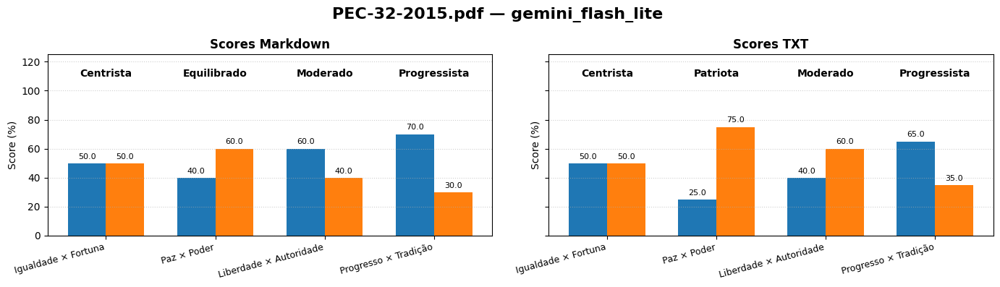

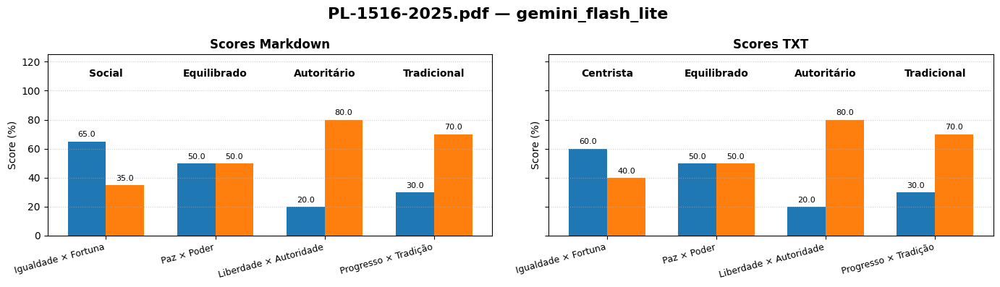

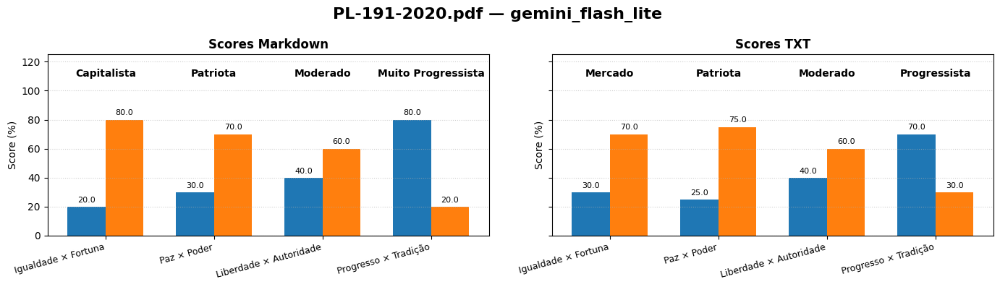

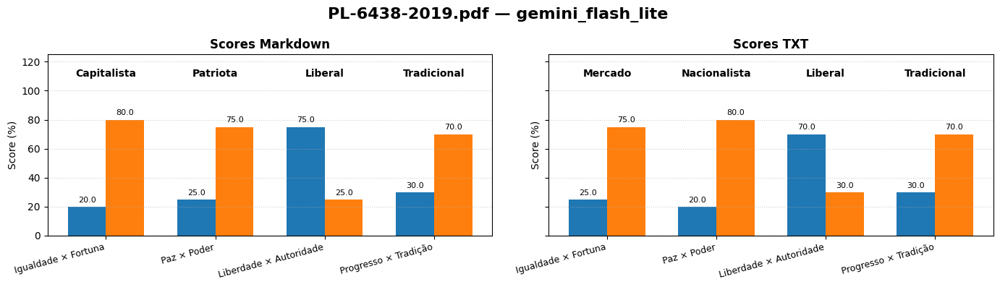

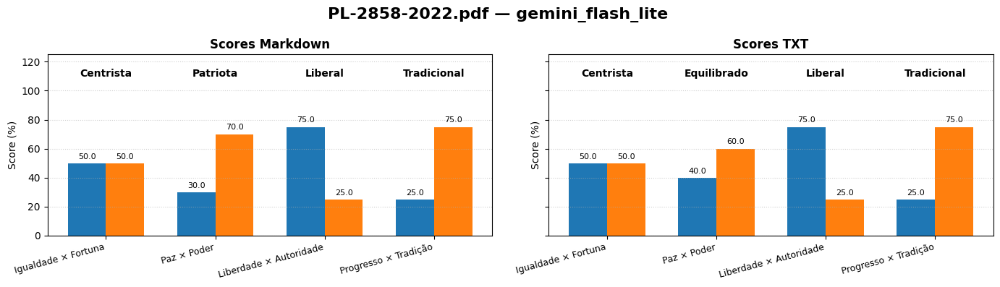

In [ ]:
for r in resultados_tp_textos:
  nome = r["name"]

  values_md = Quiz8Values.calculate_8values(r["estimado_md"], IDEOLOGIES)
  values_txt = Quiz8Values.calculate_8values(r["estimado_txt"], IDEOLOGIES)

  fig1, (ax1_md, ax1_txt) = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

  grafico_scores(values_md.scores.model_dump(), values_md.labels.to_list(), f"Scores Markdown", ax1_md)
  grafico_scores(values_txt.scores.model_dump(), values_txt.labels.to_list(), f"Scores TXT", ax1_txt)

  fig1.suptitle(
      f"{nome} — {modelo}",
      fontsize=16,
      fontweight="bold"
  )

  plt.tight_layout()
  plt.show()

### Teste estabilidade

In [ ]:
name, md, txt = tp_textos[0]
teste_LLM = []
modelos = ["gemini_flash_lite", "gemini_flash", "openai_mini", "openai_luna", "sabia", "sabiazinho"]

In [ ]:
for modelo in modelos:
  for i in range(0,10):

    inicio = time.perf_counter()
    estimado_md = await EstimateResultModel(md, llm=MODELS[modelo])
    tempo_md = time.perf_counter() - inicio

    inicio = time.perf_counter()
    estimado_txt = await EstimateResultModel(txt, llm=MODELS[modelo])
    tempo_txt = time.perf_counter() - inicio


    resultado = {
      "name":name,
      "execucao": i + 1,
      "modelo": modelo,
      "estimado_md": estimado_md,
      "tempo_md": tempo_md,
      "tempo_txt":tempo_txt,
      "estimado_txt": estimado_txt
    }

    teste_LLM.append(resultado)

In [ ]:
print(teste_LLM)

[{'name': 'PEC-32-2015.pdf', 'execucao': 1, 'modelo': 'gemini_flash_lite', 'estimado_md': Result(equality=50.0, peace=30.0, liberty=70.0, progress=60.0), 'tempo_md': 2.3676047530002506, 'tempo_txt': 0.655413506000059, 'estimado_txt': Result(equality=50.0, peace=25.0, liberty=40.0, progress=70.0)}, {'name': 'PEC-32-2015.pdf', 'execucao': 2, 'modelo': 'gemini_flash_lite', 'estimado_md': Result(equality=50.0, peace=30.0, liberty=40.0, progress=65.0), 'tempo_md': 0.587924848000057, 'tempo_txt': 0.874486399000034, 'estimado_txt': Result(equality=50.0, peace=30.0, liberty=70.0, progress=65.0)}, {'name': 'PEC-32-2015.pdf', 'execucao': 3, 'modelo': 'gemini_flash_lite', 'estimado_md': Result(equality=50.0, peace=40.0, liberty=45.0, progress=60.0), 'tempo_md': 0.6214696399997592, 'tempo_txt': 0.869894836000185, 'estimado_txt': Result(equality=50.0, peace=30.0, liberty=40.0, progress=70.0)}, {'name': 'PEC-32-2015.pdf', 'execucao': 4, 'modelo': 'gemini_flash_lite', 'estimado_md': Result(equality=5

In [ ]:
EIXOS = ["equality", "peace", "liberty", "progress"]

dados = []

for r in teste_LLM:
    md = r["estimado_md"]
    txt = r["estimado_txt"]

    dados.append({
        "name": r["name"],
        "execucao": r["execucao"],
        "modelo": r["modelo"],
        "equality_md": md.equality,
        "peace_md": md.peace,
        "liberty_md": md.liberty,
        "progress_md": md.progress,
        "tempo_md": r["tempo_md"],
        "equality_txt": txt.equality,
        "peace_txt": txt.peace,
        "liberty_txt": txt.liberty,
        "progress_txt": txt.progress,
        "tempo_txt": r["tempo_txt"],
    })

df = pd.DataFrame(dados)

display(df)

,name,execucao,modelo,equality_md,peace_md,liberty_md,progress_md,tempo_md,equality_txt,peace_txt,liberty_txt,progress_txt,tempo_txt
0,PEC-32-2015.pdf,1,gemini_flash_lite,50.0,30.0,70.0,60.0,2.367605,50.0,25.0,40.0,70.0,0.655414
1,PEC-32-2015.pdf,2,gemini_flash_lite,50.0,30.0,40.0,65.0,0.587925,50.0,30.0,70.0,65.0,0.874486
2,PEC-32-2015.pdf,3,gemini_flash_lite,50.0,40.0,45.0,60.0,0.621470,50.0,30.0,40.0,70.0,0.869895
3,PEC-32-2015.pdf,4,gemini_flash_lite,50.0,40.0,65.0,70.0,10.014801,50.0,40.0,40.0,65.0,0.934162
4,PEC-32-2015.pdf,5,gemini_flash_lite,50.0,40.0,70.0,65.0,15.658972,50.0,40.0,60.0,65.0,0.937104
5,PEC-32-2015.pdf,6,gemini_flash_lite,50.0,40.0,60.0,65.0,1.507227,50.0,30.0,40.0,70.0,0.871779
6,PEC-32-2015.pdf,7,gemini_flash_lite,50.0,30.0,70.0,65.0,15.352108,50.0,35.0,40.0,70.0,0.823558
7,PEC-32-2015.pdf,8,gemini_flash_lite,50.0,30.0,60.0,75.0,0.629777,50.0,40.0,40.0,60.0,0.627391
8,PEC-32-2015.pdf,9,gemini_flash_lite,50.0,30.0,40.0,65.0,0.692633,40.0,30.0,70.0,70.0,0.621877
9,PEC-32-2015.pdf,10,gemini_flash_lite,50.0,40.0,60.0,70.0,0.747845,50.0,30.0,40.0,70.0,0.819517


##### Média e desvio padrão das pontuações

In [ ]:
estatisticas = []

for modelo, grupo in df.groupby("modelo"):

    for formato in ["md", "txt"]:

        linha = {
            "modelo": modelo,
            "formato": formato
        }

        for eixo in EIXOS:
            valores = grupo[f"{eixo}_{formato}"]

            linha[f"{eixo}_media"] = valores.mean()
            linha[f"{eixo}_std"] = valores.std()

        estatisticas.append(linha)

df_estatisticas = pd.DataFrame(estatisticas)

df_estatisticas.round(2)

,modelo,formato,equality_media,equality_std,peace_media,peace_std,liberty_media,liberty_std,progress_media,progress_std
0,gemini_flash,md,50.0,0.00,47.0,3.50,47.2,4.54,65.5,8.32
1,gemini_flash,txt,50.0,0.00,48.3,3.33,45.2,4.61,60.6,5.72
2,gemini_flash_lite,md,50.0,0.00,35.0,5.27,58.0,12.06,66.0,4.59
3,gemini_flash_lite,txt,49.0,3.16,33.0,5.37,48.0,13.17,67.5,3.54
4,openai_luna,md,52.8,2.49,32.1,6.24,66.0,3.33,77.2,2.25
5,openai_luna,txt,54.7,2.91,36.7,6.04,67.0,2.67,80.1,3.87
6,openai_mini,md,31.8,5.49,33.1,6.61,39.5,11.60,70.2,5.18
7,openai_mini,txt,40.0,13.54,37.0,8.15,29.9,4.51,71.3,4.92
8,sabia,md,50.0,0.00,50.0,0.00,67.0,3.50,72.5,3.54
9,sabia,txt,48.0,4.22,51.0,3.16,68.5,3.37,75.5,4.97


##### Estabilidade dos modelos

In [ ]:
estabilidade = []

for modelo, grupo in df.groupby("modelo"):

    for formato in ["md", "txt"]:

        desvios = [
            grupo[f"{eixo}_{formato}"].std()
            for eixo in EIXOS
        ]

        estabilidade.append({
            "modelo": modelo,
            "formato": formato,
            "std_medio": np.mean(desvios)
        })

df_estabilidade = pd.DataFrame(estabilidade)

df_estabilidade = (
    df_estabilidade
    .sort_values("std_medio")
    .reset_index(drop=True)
)

df_estabilidade.round(2)

,modelo,formato,std_medio
0,sabia,md,1.76
1,gemini_flash,txt,3.42
2,openai_luna,md,3.58
3,openai_luna,txt,3.87
4,sabia,txt,3.93
5,gemini_flash,md,4.09
6,gemini_flash_lite,md,5.48
7,gemini_flash_lite,txt,6.31
8,sabiazinho,md,6.51
9,openai_mini,md,7.22


In [ ]:
estabilidade_geral = (
    df_estabilidade
    .groupby("modelo")["std_medio"]
    .mean()
    .sort_values()
    .reset_index()
)

estabilidade_geral.round(2)

,modelo,std_medio
0,sabia,2.84
1,openai_luna,3.72
2,gemini_flash,3.75
3,gemini_flash_lite,5.90
4,sabiazinho,6.94
5,openai_mini,7.50


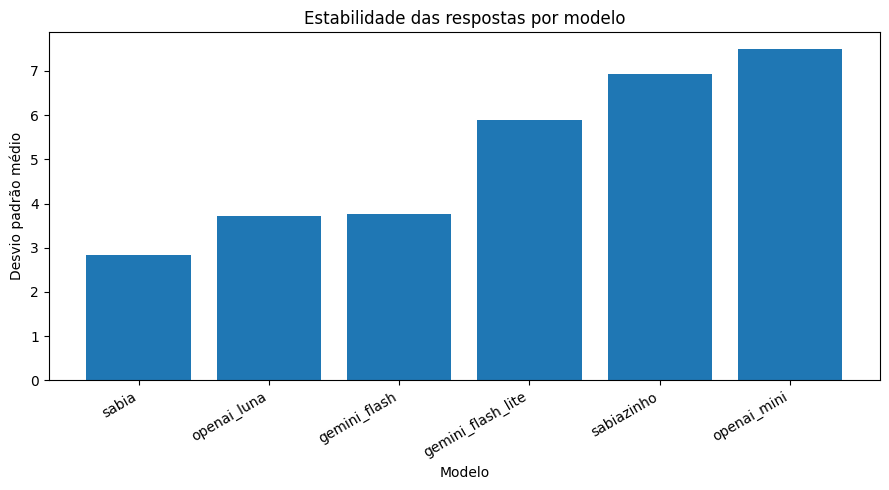

In [ ]:
grafico = estabilidade_geral.sort_values("std_medio")

plt.figure(figsize=(9, 5))

plt.bar(
    grafico["modelo"],
    grafico["std_medio"]
)

plt.ylabel("Desvio padrão médio")
plt.xlabel("Modelo")
plt.title("Estabilidade das respostas por modelo")

plt.xticks(rotation=30, ha="right")

plt.tight_layout()
plt.show()

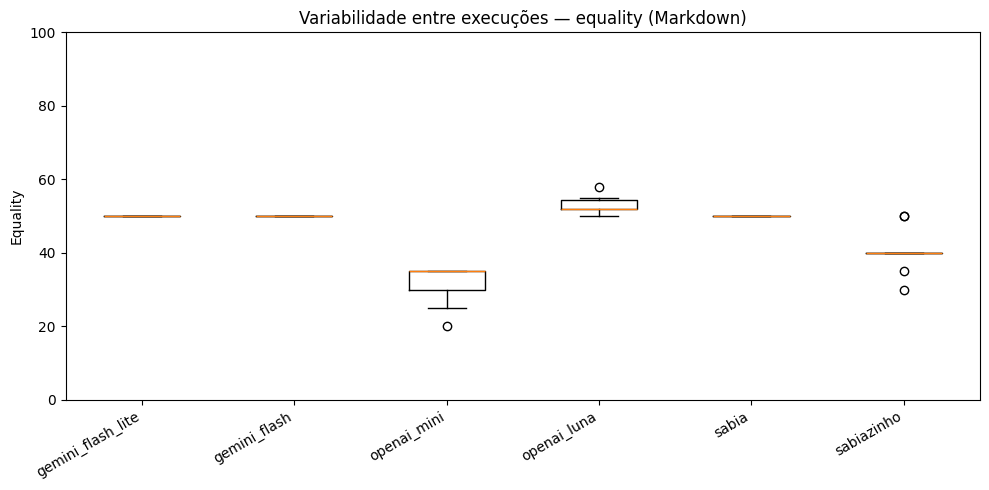

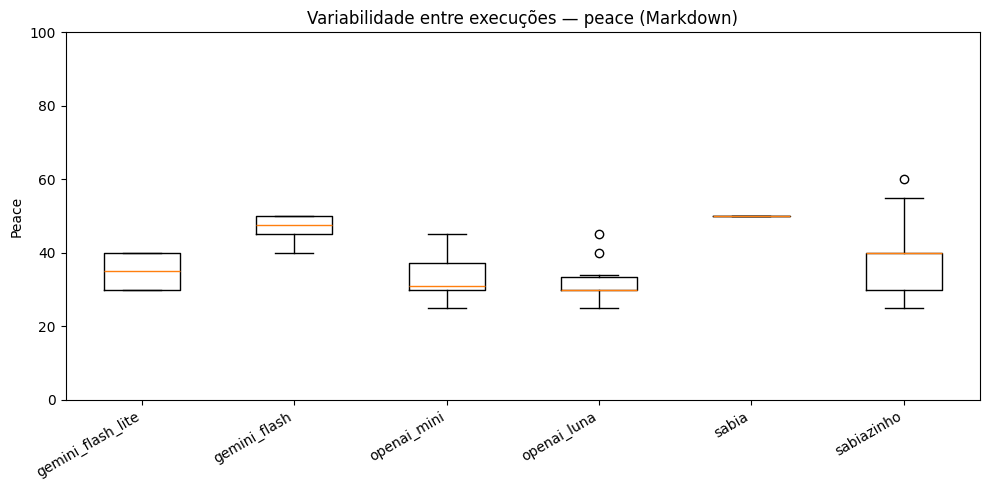

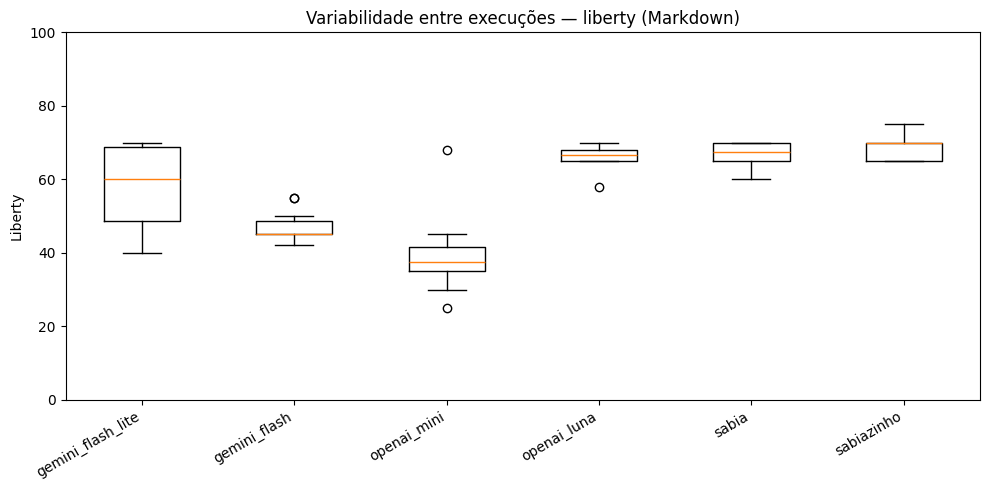

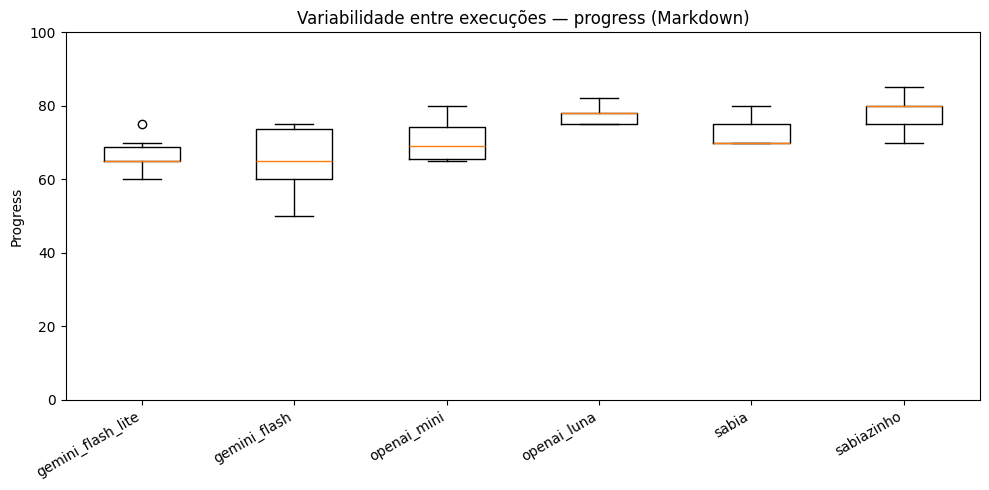

In [ ]:
for eixo in EIXOS:

    fig, ax = plt.subplots(figsize=(10, 5))

    dados = [
        df.loc[df["modelo"] == modelo, f"{eixo}_md"]
        for modelo in modelos
    ]

    ax.boxplot(
        dados,
        tick_labels=modelos
    )

    ax.set_ylim(0, 100)

    ax.set_ylabel(eixo.capitalize())
    ax.set_title(
        f"Variabilidade entre execuções — {eixo} (Markdown)"
    )

    plt.xticks(rotation=30, ha="right")
    plt.tight_layout()
    plt.show()

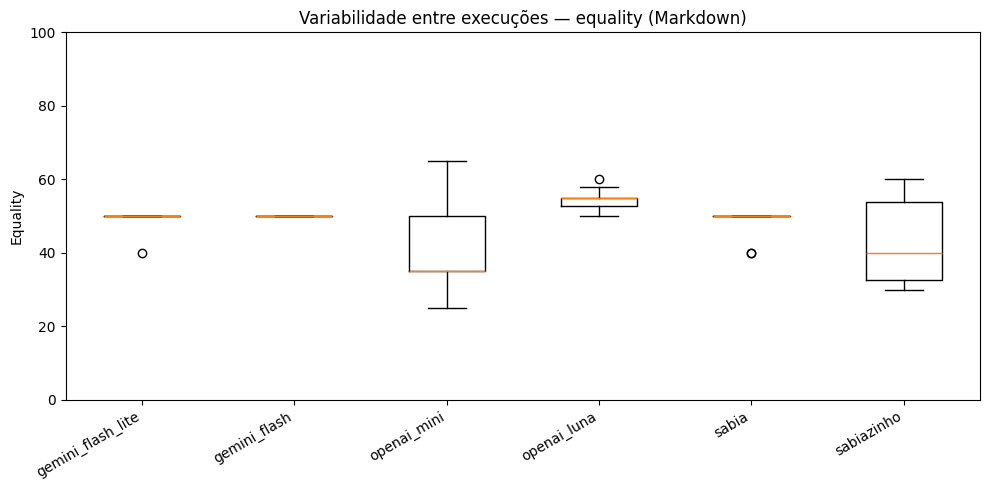

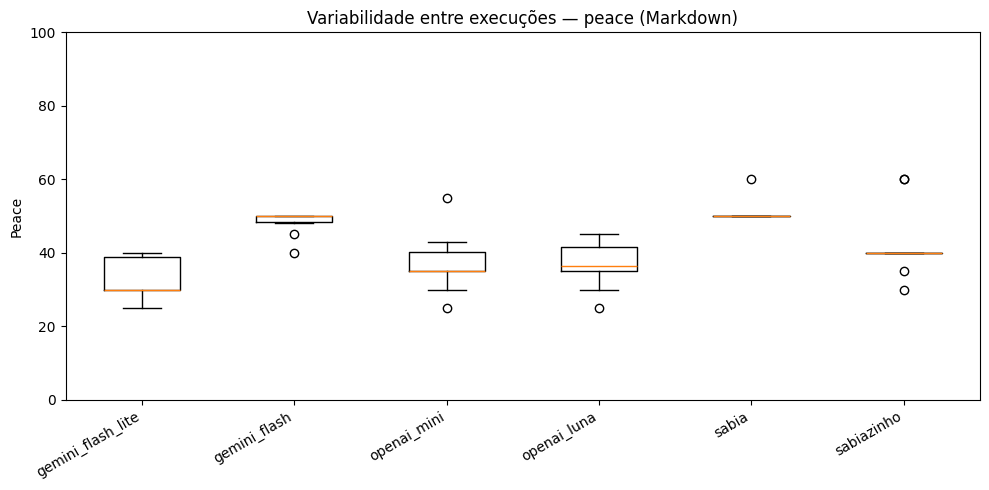

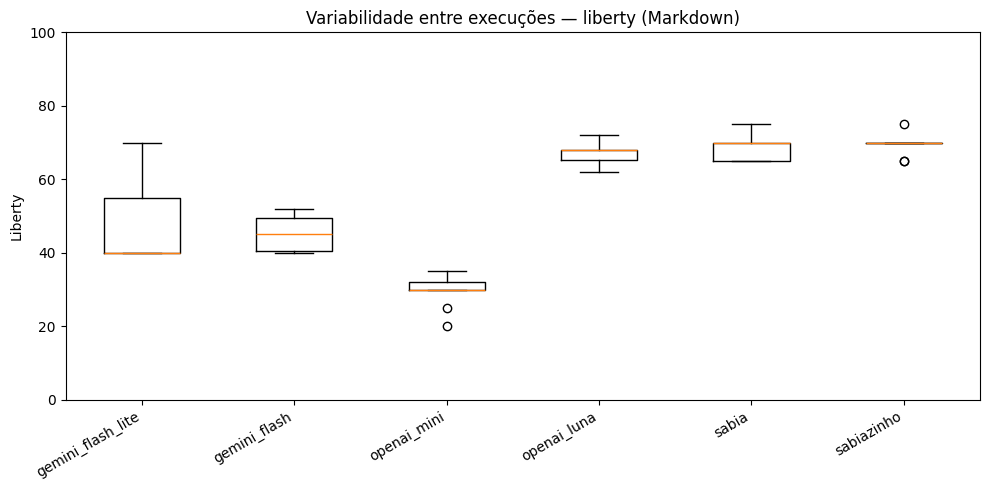

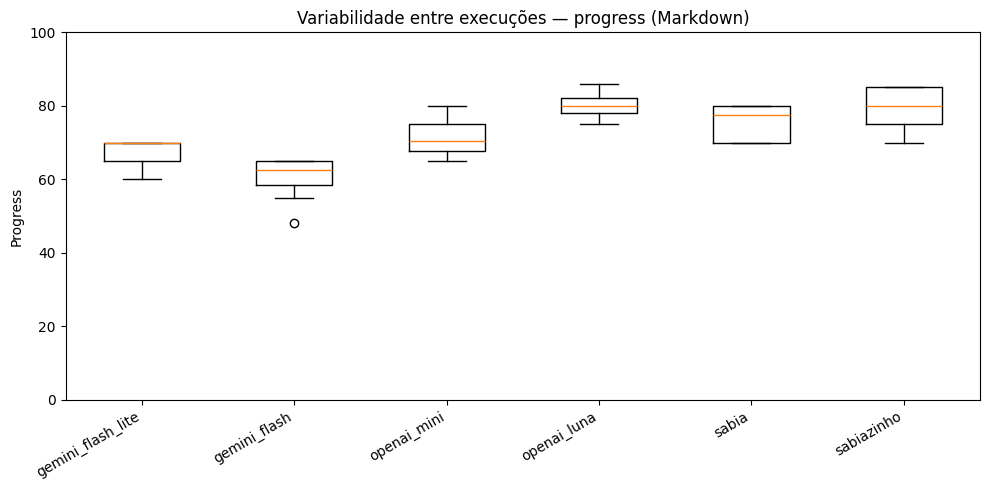

In [ ]:
for eixo in EIXOS:

    fig, ax = plt.subplots(figsize=(10, 5))

    dados = [
        df.loc[df["modelo"] == modelo, f"{eixo}_txt"]
        for modelo in modelos
    ]

    ax.boxplot(
        dados,
        tick_labels=modelos
    )

    ax.set_ylim(0, 100)

    ax.set_ylabel(eixo.capitalize())
    ax.set_title(
        f"Variabilidade entre execuções — {eixo} (Markdown)"
    )

    plt.xticks(rotation=30, ha="right")
    plt.tight_layout()
    plt.show()

##### Markdown × TXT

In [ ]:
for eixo in EIXOS:
    df[f"diff_{eixo}"] = abs(
        df[f"{eixo}_md"] - df[f"{eixo}_txt"]
    )

In [ ]:
diferenca_formato = (
    df
    .groupby("modelo")[
        [f"diff_{eixo}" for eixo in EIXOS]
    ]
    .mean()
)

diferenca_formato["diferenca_media"] = (
    diferenca_formato.mean(axis=1)
)

diferenca_formato = (
    diferenca_formato
    .sort_values("diferenca_media")
)

diferenca_formato.round(2)

,diff_equality,diff_peace,diff_liberty,diff_progress,diferenca_media
modelo,,,,,
sabia,2.0,1.0,2.5,5.0,2.62
gemini_flash,0.0,2.7,5.0,5.9,3.40
openai_luna,2.9,9.6,3.2,2.9,4.65
gemini_flash_lite,1.0,5.0,22.0,5.5,8.38
sabiazinho,11.5,12.5,3.5,7.0,8.62
openai_mini,12.2,10.1,11.6,5.7,9.90


In [ ]:
medias = []

for modelo, grupo in df.groupby("modelo"):
    for eixo in EIXOS:

        medias.append({
            "modelo": modelo,
            "eixo": eixo,
            "md": grupo[f"{eixo}_md"].mean(),
            "txt": grupo[f"{eixo}_txt"].mean()
        })

df_medias = pd.DataFrame(medias)

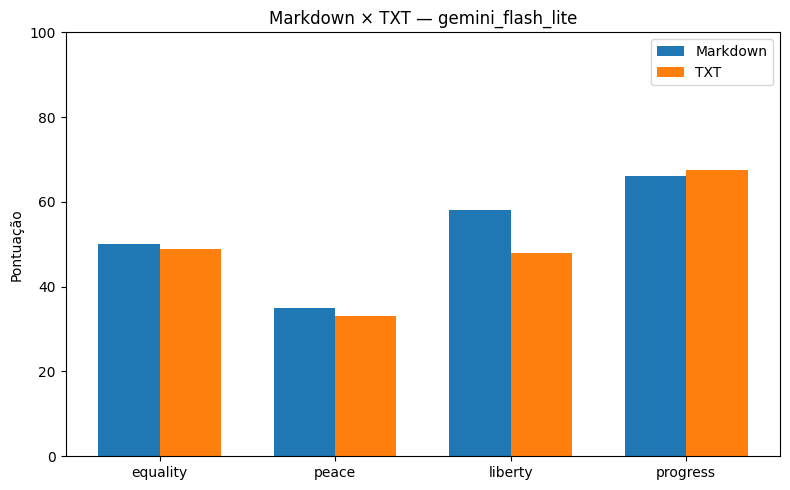

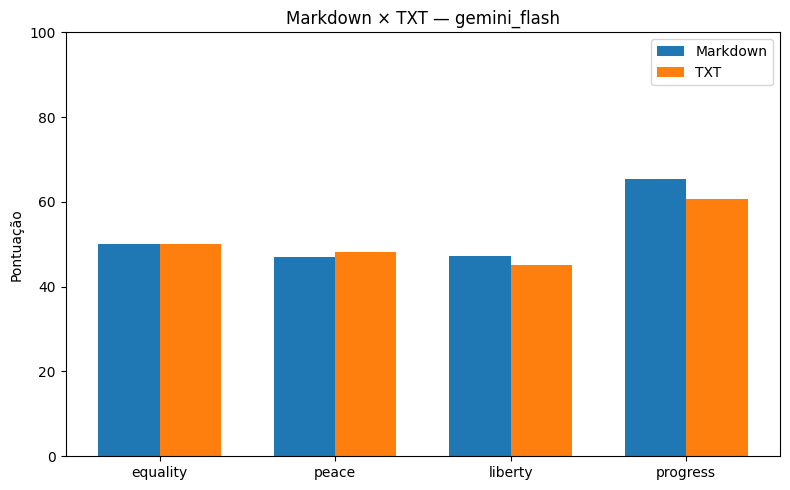

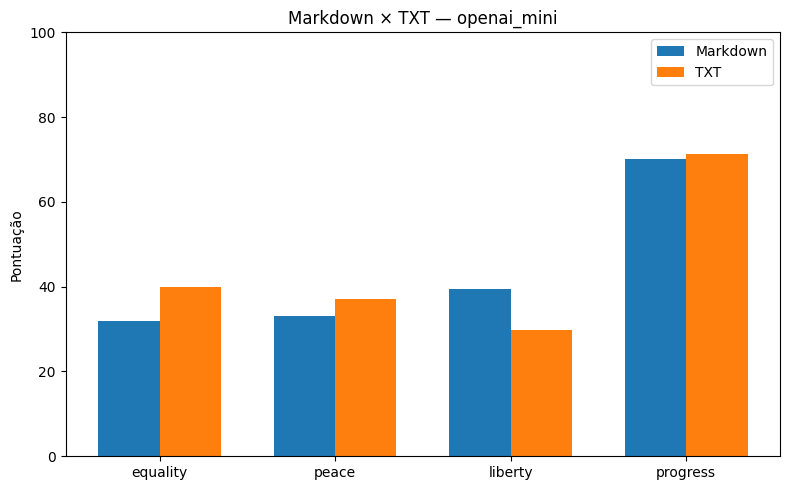

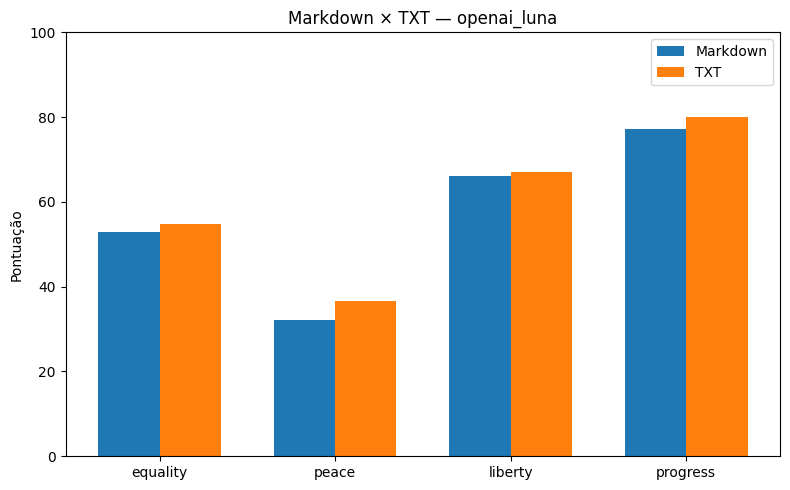

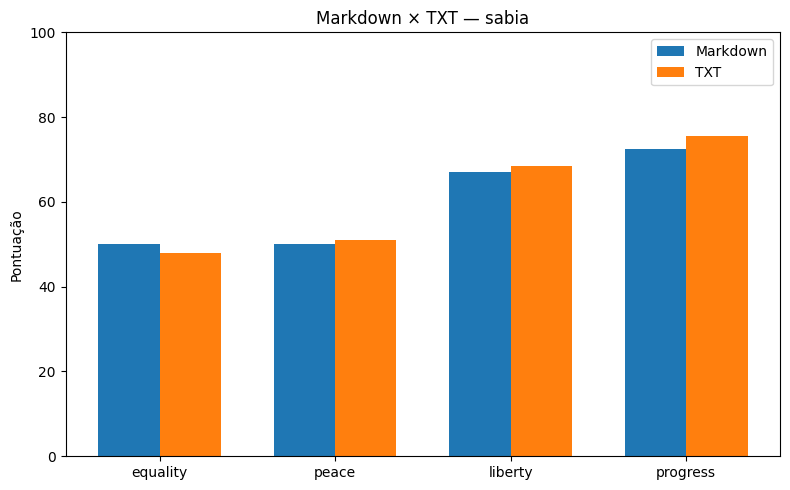

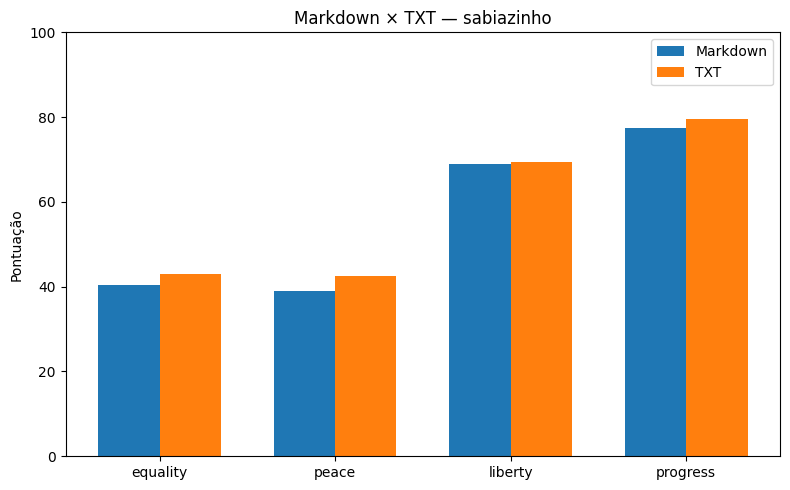

In [ ]:
modelos = df["modelo"].unique()

for modelo in modelos:

    dados_modelo = df_medias[
        df_medias["modelo"] == modelo
    ]

    x = np.arange(len(EIXOS))
    largura = 0.35

    fig, ax = plt.subplots(figsize=(8, 5))

    ax.bar(
        x - largura / 2,
        dados_modelo["md"],
        largura,
        label="Markdown"
    )

    ax.bar(
        x + largura / 2,
        dados_modelo["txt"],
        largura,
        label="TXT"
    )

    ax.set_xticks(x)
    ax.set_xticklabels(EIXOS)

    ax.set_ylim(0, 100)

    ax.set_ylabel("Pontuação")
    ax.set_title(f"Markdown × TXT — {modelo}")

    ax.legend()

    plt.tight_layout()
    plt.show()

##### Tempo de resposta

In [ ]:
tempos = []

for modelo, grupo in df.groupby("modelo"):

    for formato in ["md", "txt"]:

        valores = grupo[f"tempo_{formato}"]

        tempos.append({
            "modelo": modelo,
            "formato": formato,
            "media": valores.mean(),
            "mediana": valores.median(),
            "std": valores.std(),
            "min": valores.min(),
            "max": valores.max(),
        })

df_tempos = pd.DataFrame(tempos)

df_tempos.round(3)

,modelo,formato,media,mediana,std,min,max
0,gemini_flash,md,6.600,6.870,0.775,4.893,7.302
1,gemini_flash,txt,7.410,6.789,1.652,5.497,10.525
2,gemini_flash_lite,md,4.818,1.128,6.317,0.588,15.659
3,gemini_flash_lite,txt,0.804,0.847,0.123,0.622,0.937
4,openai_luna,md,4.162,3.822,0.782,3.544,5.866
5,openai_luna,txt,3.920,3.828,0.466,3.419,4.931
6,openai_mini,md,1.307,0.916,1.072,0.751,4.301
7,openai_mini,txt,1.074,0.941,0.343,0.773,1.839
8,sabia,md,1.194,1.028,0.362,0.955,2.047
9,sabia,txt,1.059,1.007,0.093,0.955,1.202


##### Geral

In [ ]:
# Estabilidade geral
estabilidade_modelo = (
    df_estabilidade
    .groupby("modelo")["std_medio"]
    .mean()
    .rename("instabilidade")
)

# Diferença MD x TXT
sensibilidade_formato = (
    diferenca_formato["diferenca_media"]
    .rename("diferenca_md_txt")
)

# Mediana geral de tempo MD + TXT
tempo_modelo = (
    df
    .groupby("modelo")
    .apply(
        lambda g: pd.concat([
            g["tempo_md"],
            g["tempo_txt"]
        ]).median()
    )
    .rename("tempo_mediano")
)

comparacao = pd.concat([
    estabilidade_modelo,
    sensibilidade_formato,
    tempo_modelo
], axis=1)

comparacao.round(2)

/tmp/ipykernel_1417/3284284704.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(


,instabilidade,diferenca_md_txt,tempo_mediano
modelo,,,
gemini_flash,3.75,3.40,6.85
gemini_flash_lite,5.90,8.38,0.85
openai_luna,3.72,4.65,3.82
openai_mini,7.50,9.90,0.92
sabia,2.84,2.62,1.01
sabiazinho,6.94,8.62,0.91


#### Modelo menos Raciocinio

In [ ]:
name, md, txt = tp_textos[0]
teste_LLM = []

In [ ]:
modelo = 'gemini_flash_lite'

In [ ]:
for i in range(0,10):
  estimado_md = await EstimateResultModel(md, llm=MODELS[modelo])
  estimado_txt = await EstimateResultModel(txt, llm=MODELS[modelo])

  resultado = {
    "name":name,
    "estimado_md": estimado_md,
    "estimado_txt": estimado_txt
  }

  teste_LLM.append(resultado)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

EIXOS = ["equality", "peace", "liberty", "progress"]

# resultados = sua lista com os dicionários

linhas = []

for i, r in enumerate(teste_LLM):
    md = r["estimado_md"].model_dump()
    txt = r["estimado_txt"].model_dump()

    for eixo in EIXOS:
        linhas.append({
            "execucao": i + 1,
            "eixo": eixo,
            "md": md[eixo],
            "txt": txt[eixo],
            "diferenca": md[eixo] - txt[eixo],
            "diferenca_absoluta": abs(md[eixo] - txt[eixo]),
        })

df = pd.DataFrame(linhas)
display(df)

,execucao,eixo,md,txt,diferenca,diferenca_absoluta
0,1,equality,50.0,45.0,5.0,5.0
1,1,peace,40.0,40.0,0.0,0.0
2,1,liberty,60.0,60.0,0.0,0.0
3,1,progress,65.0,70.0,-5.0,5.0
4,2,equality,50.0,50.0,0.0,0.0
5,2,peace,40.0,40.0,0.0,0.0
6,2,liberty,60.0,65.0,-5.0,5.0
7,2,progress,65.0,70.0,-5.0,5.0
8,3,equality,50.0,50.0,0.0,0.0
9,3,peace,40.0,40.0,0.0,0.0


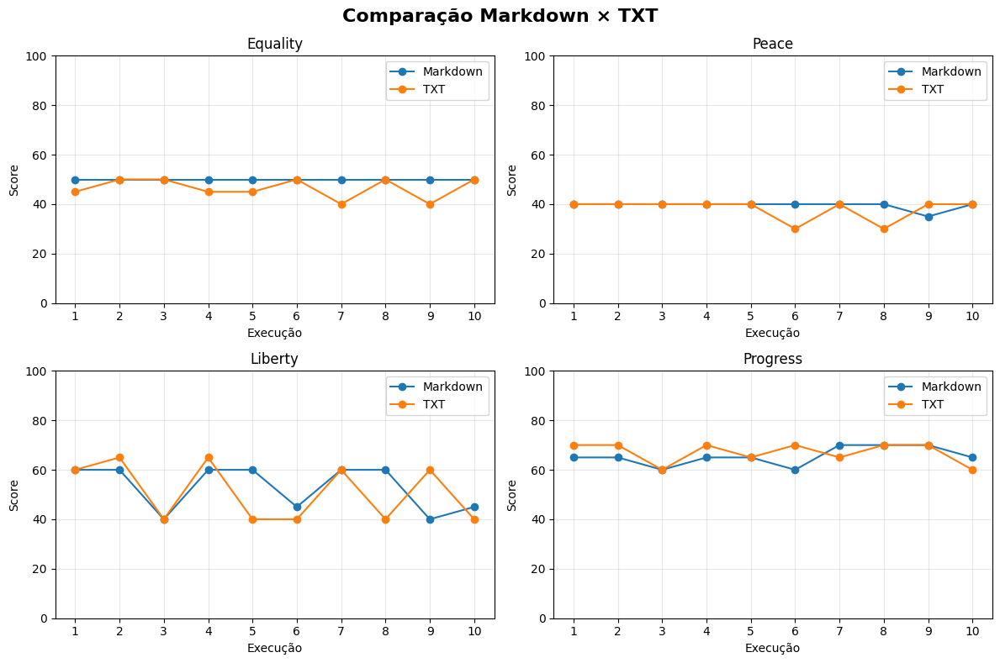

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes = axes.flatten()

for ax, eixo in zip(axes, EIXOS):
    dados = df[df["eixo"] == eixo]

    ax.plot(
        dados["execucao"],
        dados["md"],
        marker="o",
        label="Markdown"
    )

    ax.plot(
        dados["execucao"],
        dados["txt"],
        marker="o",
        label="TXT"
    )

    ax.set_title(eixo.capitalize())
    ax.set_xlabel("Execução")
    ax.set_ylabel("Score")
    ax.set_xticks(dados["execucao"])
    ax.set_ylim(0, 100)
    ax.grid(alpha=0.3)
    ax.legend()

plt.suptitle("Comparação Markdown × TXT", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

#### Modelo mais Raciocinio

In [ ]:
modelo = 'gemini_flash'

In [ ]:
for i in range(0,10):
  estimado_md = await EstimateResultModel(md, llm=MODELS[modelo])
  estimado_txt = await EstimateResultModel(txt, llm=MODELS[modelo])

  resultado = {
    "name":name,
    "estimado_md": estimado_md,
    "estimado_txt": estimado_txt
  }

  teste_LLM.append(resultado)

In [ ]:
EIXOS = ["equality", "peace", "liberty", "progress"]

# resultados = sua lista com os dicionários

linhas = []

for i, r in enumerate(teste_LLM):
    md = r["estimado_md"].model_dump()
    txt = r["estimado_txt"].model_dump()

    for eixo in EIXOS:
        linhas.append({
            "execucao": i + 1,
            "eixo": eixo,
            "md": md[eixo],
            "txt": txt[eixo],
            "diferenca": md[eixo] - txt[eixo],
            "diferenca_absoluta": abs(md[eixo] - txt[eixo]),
        })

df = pd.DataFrame(linhas)
display(df)

,execucao,eixo,md,txt,diferenca,diferenca_absoluta
0,1,equality,50.0,50.0,0.0,0.0
1,1,peace,50.0,50.0,0.0,0.0
2,1,liberty,40.0,45.0,-5.0,5.0
3,1,progress,55.0,75.0,-20.0,20.0
4,2,equality,50.0,50.0,0.0,0.0
5,2,peace,45.0,50.0,-5.0,5.0
6,2,liberty,40.0,45.0,-5.0,5.0
7,2,progress,55.0,55.0,0.0,0.0
8,3,equality,50.0,50.0,0.0,0.0
9,3,peace,40.0,50.0,-10.0,10.0


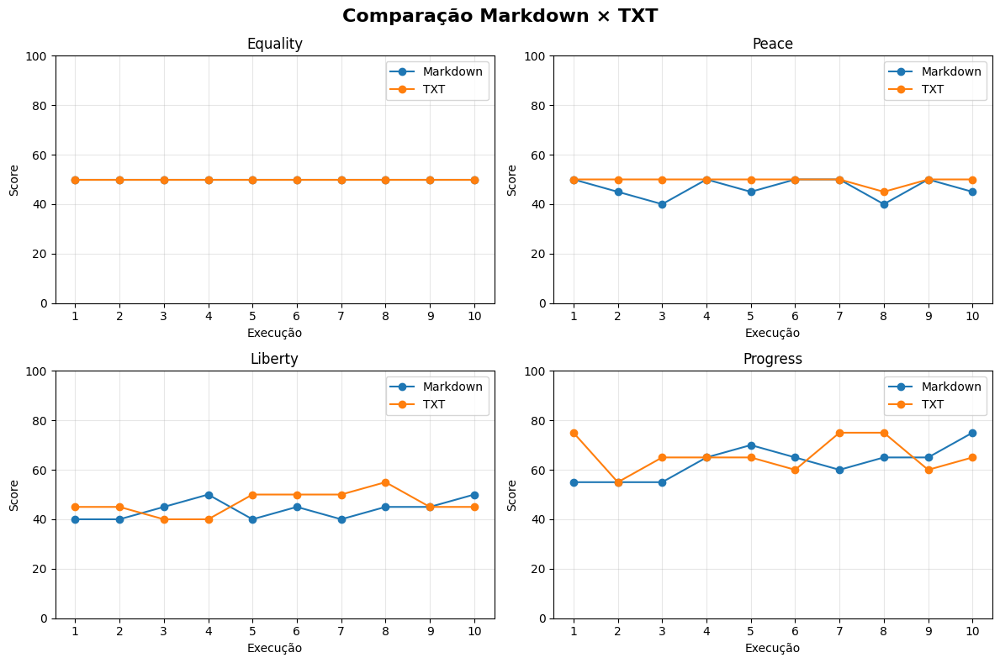

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes = axes.flatten()

for ax, eixo in zip(axes, EIXOS):
    dados = df[df["eixo"] == eixo]

    ax.plot(
        dados["execucao"],
        dados["md"],
        marker="o",
        label="Markdown"
    )

    ax.plot(
        dados["execucao"],
        dados["txt"],
        marker="o",
        label="TXT"
    )

    ax.set_title(eixo.capitalize())
    ax.set_xlabel("Execução")
    ax.set_ylabel("Score")
    ax.set_xticks(dados["execucao"])
    ax.set_ylim(0, 100)
    ax.grid(alpha=0.3)
    ax.legend()

plt.suptitle("Comparação Markdown × TXT", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

### Teste perguntas individuais

In [ ]:
quiz_individual = await individual_questions(texto)

In [ ]:
values = quiz_individual.calculate_8values()
resultados = quiz_individual.get_results()
ideologia_total = resultados.to_list()
ideologia_proxima = values.closest_ideology

comparar_resultados(ideologia_total, ideologia_proxima.stats.to_list(), 'Resultado', ideologia_proxima.name)

In [ ]:
mostrar_respostas(quiz_individual)

,Perguntas,Respostas
0,A opressão por corporações é uma preocupação m...,neutral
1,É necessário que o governo intervenha na econo...,agree
2,"Quanto mais livres os mercados, mais livres as...",neutral
3,É melhor manter um orçamento equilibrado do qu...,disagree
4,A pesquisa financiada publicamente é mais bené...,agree
...,...,...
65,"A modificação genética é uma força para o bem,...",neutral
66,Deberíamos abrir nossas fronteiras à imigração.,neutral
67,Os governos deveriam se preocupar tanto com es...,neutral
68,Todas as pessoas - independentemente de fatore...,strongly_agree


### Teste Perguntas Total

#### Teste Perguntas Total Gemini

In [ ]:
quiz_total = await all_questions(texto,llm=MODELS['gemini_flash_lite'])

answers=[Answer(id=1, answer=<AnswerOption.CONCORDO: 'concordo'>), Answer(id=2, answer=<AnswerOption.CONCORDO_FORTEMENTE: 'concordo_fortemente'>), Answer(id=3, answer=<AnswerOption.DISCORDO: 'discordo'>), Answer(id=4, answer=<AnswerOption.DISCORDO: 'discordo'>), Answer(id=5, answer=<AnswerOption.CONCORDO: 'concordo'>), Answer(id=6, answer=<AnswerOption.NEUTRO_INCERTO: 'neutro_incerto'>), Answer(id=7, answer=<AnswerOption.CONCORDO: 'concordo'>), Answer(id=8, answer=<AnswerOption.DISCORDO: 'discordo'>), Answer(id=9, answer=<AnswerOption.CONCORDO: 'concordo'>), Answer(id=10, answer=<AnswerOption.NEUTRO_INCERTO: 'neutro_incerto'>), Answer(id=11, answer=<AnswerOption.CONCORDO: 'concordo'>), Answer(id=12, answer=<AnswerOption.DISCORDO: 'discordo'>), Answer(id=13, answer=<AnswerOption.DISCORDO_FORTEMENTE: 'discordo_fortemente'>), Answer(id=14, answer=<AnswerOption.CONCORDO_FORTEMENTE: 'concordo_fortemente'>), Answer(id=15, answer=<AnswerOption.CONCORDO: 'concordo'>), Answer(id=16, answer=<Ans

In [ ]:
resultados = quiz_total.get_results()
values = quiz_total.calculate_8values(resultados, IDEOLOGIES)
ideologia_total = resultados.to_list()
ideologia_proxima = values.closest_ideology

comparar_resultados(ideologia_total, ideologia_proxima.stats.to_list(), 'Resultado', ideologia_proxima.name)

In [ ]:
mostrar_respostas(quiz_total)

,Perguntas,Respostas
0,A opressão por corporações é uma preocupação m...,AnswerOption.CONCORDO
1,É necessário que o governo intervenha na econo...,AnswerOption.CONCORDO_FORTEMENTE
2,"Quanto mais livres os mercados, mais livres as...",AnswerOption.DISCORDO
3,É melhor manter um orçamento equilibrado do qu...,AnswerOption.DISCORDO
4,A pesquisa financiada publicamente é mais bené...,AnswerOption.CONCORDO
...,...,...
65,"A modificação genética é uma força para o bem,...",AnswerOption.NEUTRO_INCERTO
66,Deberíamos abrir nossas fronteiras à imigração.,AnswerOption.NEUTRO_INCERTO
67,Os governos deveriam se preocupar tanto com es...,AnswerOption.NEUTRO_INCERTO
68,Todas as pessoas - independentemente de fatore...,AnswerOption.CONCORDO_FORTEMENTE


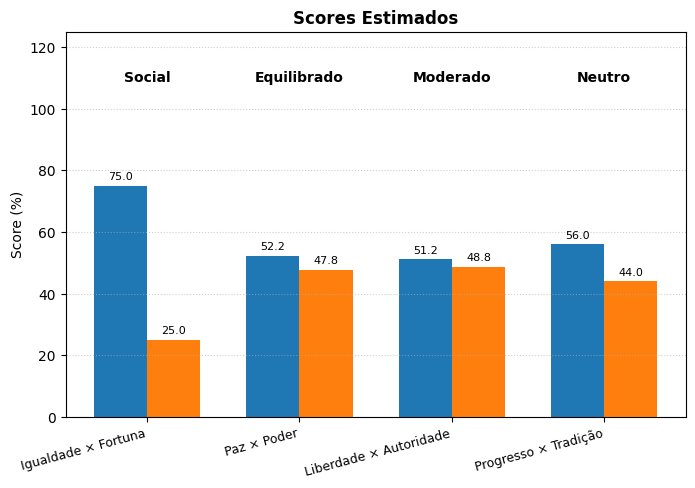

In [ ]:
grafico_scores(values.scores.model_dump(), values.labels.to_list(), "Scores Estimados")

#### Teste Perguntas Total GPT

In [ ]:
quiz_total = await all_questions(texto,llm=MODELS["openai_luna"])

In [ ]:
values = quiz_total.calculate_8values()
resultados = quiz_total.get_results()
ideologia_total = resultados.to_list()
ideologia_proxima = values.closest_ideology

comparar_resultados(ideologia_total, ideologia_proxima.stats.to_list(), 'Resultado', ideologia_proxima.name)

In [ ]:
mostrar_respostas(quiz_total)

,Perguntas,Respostas
0,A opressão por corporações é uma preocupação m...,concordo
1,É necessário que o governo intervenha na econo...,concordo_fortemente
2,"Quanto mais livres os mercados, mais livres as...",discordo
3,É melhor manter um orçamento equilibrado do qu...,discordo_fortemente
4,A pesquisa financiada publicamente é mais bené...,concordo
...,...,...
65,"A modificação genética é uma força para o bem,...",neutro_incerto
66,Deberíamos abrir nossas fronteiras à imigração.,concordo
67,Os governos deveriam se preocupar tanto com es...,concordo_fortemente
68,Todas as pessoas - independentemente de fatore...,concordo_fortemente


#### Teste Perguntas Total Claude

In [ ]:
quiz_total = await all_questions(texto, llm=MODELS['claude_haiku'])

responseeee micael answers=[Answer(id=1, answer='neutro_incerto'), Answer(id=2, answer='concordo'), Answer(id=3, answer='neutro_incerto'), Answer(id=4, answer='discordo'), Answer(id=5, answer='concordo'), Answer(id=6, answer='neutro_incerto'), Answer(id=7, answer='concordo'), Answer(id=8, answer='discordo'), Answer(id=9, answer='concordo'), Answer(id=10, answer='neutro_incerto'), Answer(id=11, answer='concordo'), Answer(id=12, answer='discordo'), Answer(id=13, answer='discordo'), Answer(id=14, answer='concordo_fortemente'), Answer(id=15, answer='concordo'), Answer(id=16, answer='discordo'), Answer(id=17, answer='neutro_incerto'), Answer(id=18, answer='concordo'), Answer(id=19, answer='concordo'), Answer(id=20, answer='neutro_incerto'), Answer(id=21, answer='concordo'), Answer(id=22, answer='discordo'), Answer(id=23, answer='concordo'), Answer(id=24, answer='concordo'), Answer(id=25, answer='neutro_incerto'), Answer(id=26, answer='concordo'), Answer(id=27, answer='concordo'), Answer(id=

In [ ]:
values = quiz_total.calculate_8values()
resultados = quiz_total.get_results()
ideologia_total = resultados.to_list()
ideologia_proxima = values.closest_ideology

comparar_resultados(ideologia_total, ideologia_proxima.stats.to_list(), 'Resultado', ideologia_proxima.name)

In [ ]:
mostrar_respostas(quiz_total)

,Perguntas,Respostas
0,A opressão por corporações é uma preocupação m...,concordo
1,É necessário que o governo intervenha na econo...,concordo_fortemente
2,"Quanto mais livres os mercados, mais livres as...",discordo
3,É melhor manter um orçamento equilibrado do qu...,discordo_fortemente
4,A pesquisa financiada publicamente é mais bené...,concordo
...,...,...
65,"A modificação genética é uma força para o bem,...",neutro_incerto
66,Deberíamos abrir nossas fronteiras à imigração.,concordo
67,Os governos deveriam se preocupar tanto com es...,concordo_fortemente
68,Todas as pessoas - independentemente de fatore...,concordo_fortemente


#### Teste Perguntas Total Maritaca

In [ ]:
quiz_total = await all_questions(texto, llm=MODELS['sabiazinho'])

responseeee micael answers=[Answer(id=1, answer='discordo'), Answer(id=2, answer='concordo'), Answer(id=3, answer='discordo'), Answer(id=4, answer='discordo'), Answer(id=5, answer='concordo'), Answer(id=6, answer='neutro_incerto'), Answer(id=7, answer='concordo'), Answer(id=8, answer='discordo_fortemente'), Answer(id=9, answer='concordo'), Answer(id=10, answer='concordo'), Answer(id=11, answer='concordo'), Answer(id=12, answer='discordo'), Answer(id=13, answer='discordo'), Answer(id=14, answer='concordo'), Answer(id=15, answer='concordo'), Answer(id=16, answer='discordo'), Answer(id=17, answer='neutro_incerto'), Answer(id=18, answer='concordo'), Answer(id=19, answer='concordo'), Answer(id=20, answer='neutro_incerto'), Answer(id=21, answer='concordo'), Answer(id=22, answer='concordo'), Answer(id=23, answer='neutro_incerto'), Answer(id=24, answer='neutro_incerto'), Answer(id=25, answer='concordo_fortemente'), Answer(id=26, answer='concordo'), Answer(id=27, answer='concordo'), Answer(id=2

In [ ]:
values = quiz_total.calculate_8values()
resultados = quiz_total.get_results()
ideologia_total = resultados.to_list()
ideologia_proxima = values.closest_ideology

comparar_resultados(ideologia_total, ideologia_proxima.stats.to_list(), 'Resultado', ideologia_proxima.name)

In [ ]:
mostrar_respostas(quiz_total)

,Perguntas,Respostas
0,A opressão por corporações é uma preocupação m...,concordo
1,É necessário que o governo intervenha na econo...,concordo_fortemente
2,"Quanto mais livres os mercados, mais livres as...",discordo
3,É melhor manter um orçamento equilibrado do qu...,discordo_fortemente
4,A pesquisa financiada publicamente é mais bené...,concordo
...,...,...
65,"A modificação genética é uma força para o bem,...",neutro_incerto
66,Deberíamos abrir nossas fronteiras à imigração.,concordo
67,Os governos deveriam se preocupar tanto com es...,concordo_fortemente
68,Todas as pessoas - independentemente de fatore...,concordo_fortemente


### Comparação Perguntas Individuais x Total

In [ ]:
textos = []

for arquivo in Path(TEXTS_PATH).glob("*.txt"):
  texto = arquivo.read_text(encoding="utf-8")
  textos.append(texto)

#### Gerar Dados

In [ ]:
lista_total = []

In [ ]:
try:
  quiz_total = await all_questions(textos[2])
  lista_total.append(quiz_total)
except Exception as e:
  print(e)

In [ ]:
with open(TOTAL_LIST_PATH, "w") as f:
  json.dump([q.answers for q in lista_total], f)

In [ ]:
lista_individual = []

In [ ]:
try:
  quiz_individual = await individual_questions(textos[2])
  lista_individual.append(quiz_individual)
except Exception as e:
  print("Erro: ", e)

[11:35:32] Processando lote 1/7...
Aguardando 60s para o próximo lote...
[11:36:33] Processando lote 2/7...
Aguardando 60s para o próximo lote...
[11:37:36] Processando lote 3/7...
Aguardando 60s para o próximo lote...
[11:38:37] Processando lote 4/7...
Aguardando 60s para o próximo lote...
[11:39:39] Processando lote 5/7...
Aguardando 60s para o próximo lote...
[11:40:42] Processando lote 6/7...
Aguardando 60s para o próximo lote...
[11:41:43] Processando lote 7/7...


In [ ]:
with open(INDIVIDUAL_LIST_PATH, "w") as f:
  json.dump([q.answers for q in lista_individual], f)

#### Análise

In [ ]:
lista_individual = ler_respostas(INDIVIDUAL_LIST_PATH)
lista_total = ler_respostas(TOTAL_LIST_PATH)


            ANÁLISE: PL 1516-2025



,Perguntas,Resposta Individual,Resposta Total
0,A opressão por corporações é uma preocupação m...,AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
1,É necessário que o governo intervenha na econo...,AnswerOption.CONCORDO_FORTEMENTE,AnswerOption.CONCORDO_FORTEMENTE
2,"Quanto mais livres os mercados, mais livres as...",AnswerOption.NEUTRO_INCERTO,AnswerOption.DISCORDO
3,É melhor manter um orçamento equilibrado do qu...,AnswerOption.NEUTRO_INCERTO,AnswerOption.DISCORDO_FORTEMENTE
4,A pesquisa financiada publicamente é mais bené...,AnswerOption.NEUTRO_INCERTO,AnswerOption.CONCORDO
...,...,...,...
65,"A modificação genética é uma força para o bem,...",AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
66,Deberíamos abrir nossas fronteiras à imigração.,AnswerOption.NEUTRO_INCERTO,AnswerOption.CONCORDO
67,Os governos deveriam se preocupar tanto com es...,AnswerOption.NEUTRO_INCERTO,AnswerOption.CONCORDO
68,Todas as pessoas - independentemente de fatore...,AnswerOption.CONCORDO_FORTEMENTE,AnswerOption.CONCORDO_FORTEMENTE


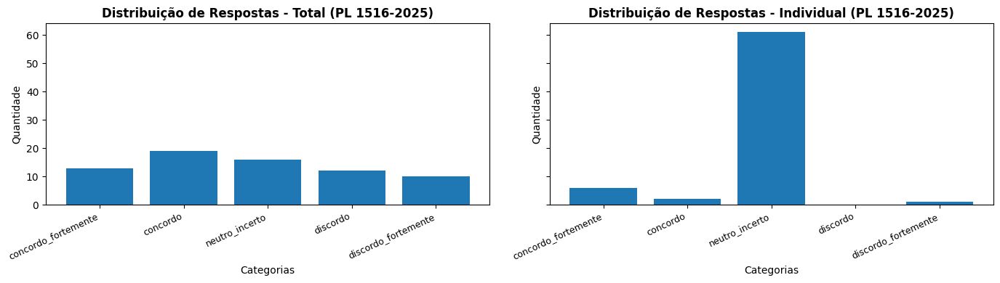

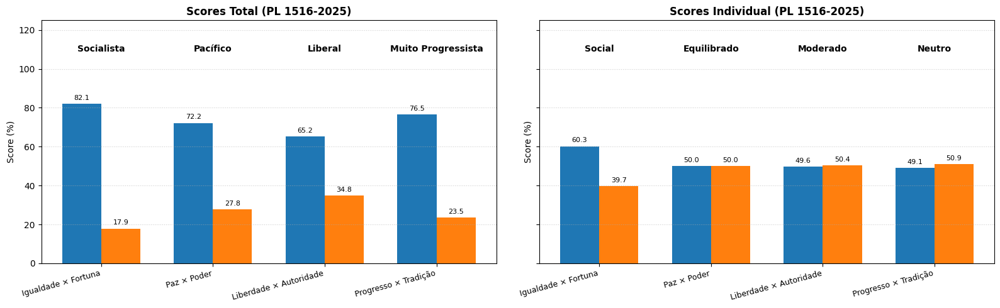


            ANÁLISE: PL 191-2020



,Perguntas,Resposta Individual,Resposta Total
0,A opressão por corporações é uma preocupação m...,AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
1,É necessário que o governo intervenha na econo...,AnswerOption.NEUTRO_INCERTO,AnswerOption.CONCORDO
2,"Quanto mais livres os mercados, mais livres as...",AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
3,É melhor manter um orçamento equilibrado do qu...,AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
4,A pesquisa financiada publicamente é mais bené...,AnswerOption.NEUTRO_INCERTO,AnswerOption.CONCORDO
...,...,...,...
65,"A modificação genética é uma força para o bem,...",AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
66,Deberíamos abrir nossas fronteiras à imigração.,AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
67,Os governos deveriam se preocupar tanto com es...,AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
68,Todas as pessoas - independentemente de fatore...,AnswerOption.CONCORDO_FORTEMENTE,AnswerOption.CONCORDO_FORTEMENTE


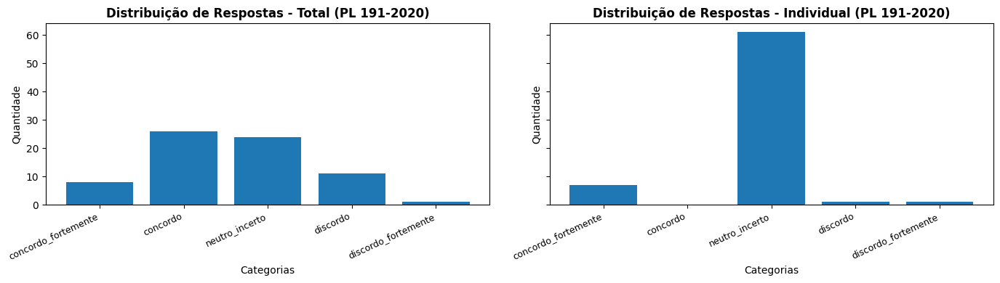

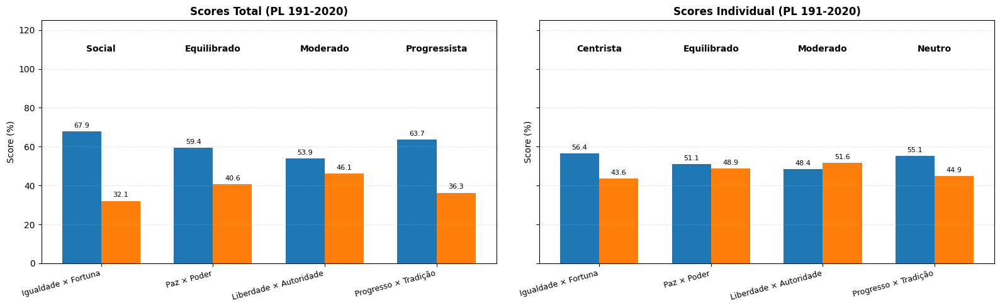


            ANÁLISE: PL 2858-2022



,Perguntas,Resposta Individual,Resposta Total
0,A opressão por corporações é uma preocupação m...,AnswerOption.NEUTRO_INCERTO,AnswerOption.DISCORDO
1,É necessário que o governo intervenha na econo...,AnswerOption.NEUTRO_INCERTO,AnswerOption.DISCORDO
2,"Quanto mais livres os mercados, mais livres as...",AnswerOption.NEUTRO_INCERTO,AnswerOption.CONCORDO_FORTEMENTE
3,É melhor manter um orçamento equilibrado do qu...,AnswerOption.NEUTRO_INCERTO,AnswerOption.CONCORDO
4,A pesquisa financiada publicamente é mais bené...,AnswerOption.NEUTRO_INCERTO,AnswerOption.DISCORDO
...,...,...,...
65,"A modificação genética é uma força para o bem,...",AnswerOption.NEUTRO_INCERTO,AnswerOption.NEUTRO_INCERTO
66,Deberíamos abrir nossas fronteiras à imigração.,AnswerOption.NEUTRO_INCERTO,AnswerOption.DISCORDO_FORTEMENTE
67,Os governos deveriam se preocupar tanto com es...,AnswerOption.NEUTRO_INCERTO,AnswerOption.DISCORDO
68,Todas as pessoas - independentemente de fatore...,AnswerOption.CONCORDO_FORTEMENTE,AnswerOption.CONCORDO


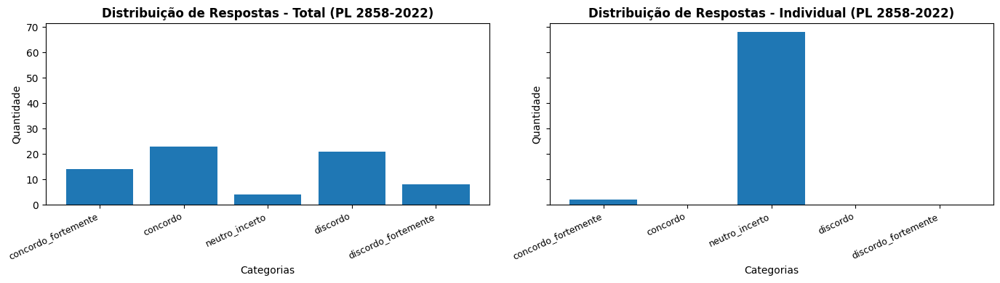

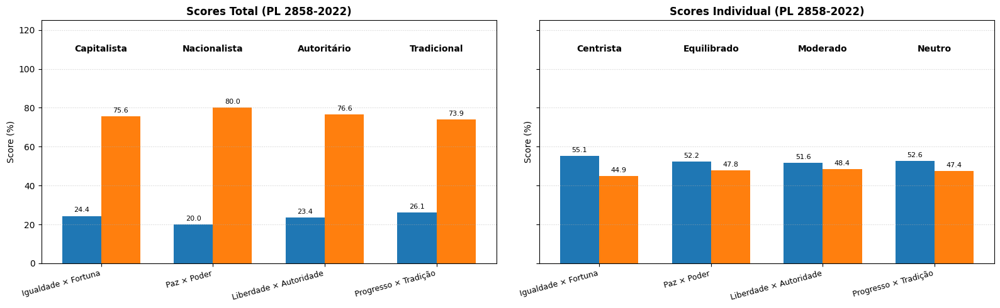

In [ ]:
titulos = ["PL 1516-2025", "PL 191-2020", "PL 2858-2022"]

for i, t, titulo in zip(lista_individual, lista_total, titulos):
    processar_e_comparar(
        quiz_ind=i,
        quiz_tot=t,
        titulo=titulo,
        questions_list=QUESTIONS
    )

### Teste Estimado

In [ ]:
result = await EstimateResultModel(texto, llm=MODELS["gemini_flash_lite"])

In [ ]:
values = Quiz8Values.calculate_8values(result, IDEOLOGIES)

NameError: name 'result' is not defined

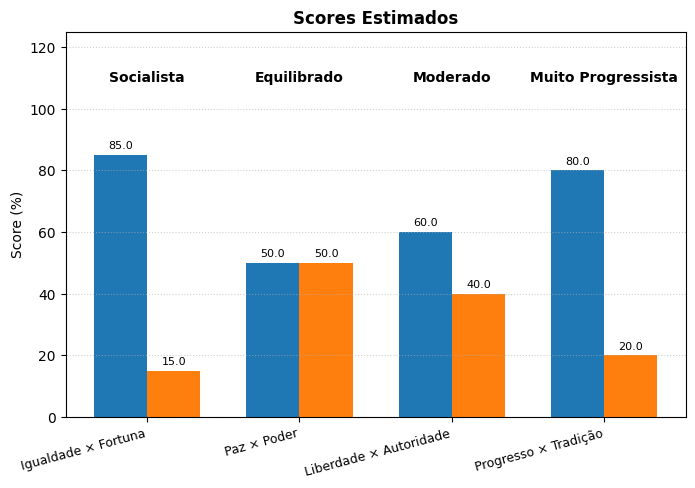

In [ ]:
grafico_scores(values.scores.model_dump(), values.labels.to_list(), "Scores Estimados")

### Perguntas Estimado x Total x Individual

In [ ]:
path = DRIVE_PATH + 'results.json'

#### Gerar dados

In [ ]:
textos = []

for arquivo in Path(PDF_PATH).glob("*.pdf"):
  md = pymupdf4llm.to_markdown(arquivo,header=False, footer=False,use_ocr=False)
  filename = Path(arquivo).name

  textos.append((filename, md))

In [ ]:
resultados = []
modelo = 'gemini_flash_lite'

for name, texto in textos:
  estimado = await EstimateResultModel(texto, llm=MODELS[modelo])
  quiz_total = await all_questions(texto, llm=MODELS[modelo])
  quiz_individual = await individual_questions(texto, llm=MODELS[modelo],intervalo_segundos=5)

  resultado = ResultadoAnalise(
      estimado=estimado,
      quiz_total=quiz_total.get_results(),
      quiz_individual=quiz_individual.get_results(),
      modelo=modelo,
      texto=texto,
      nome=name
  )

  resultados.append(resultado)

[17:14:16] Processando lote 1/7...
Aguardando 5s para o próximo lote...
[17:14:22] Processando lote 2/7...
Aguardando 5s para o próximo lote...
[17:14:28] Processando lote 3/7...
Aguardando 5s para o próximo lote...
[17:14:33] Processando lote 4/7...
Aguardando 5s para o próximo lote...
[17:14:39] Processando lote 5/7...
Aguardando 5s para o próximo lote...
[17:14:45] Processando lote 6/7...
Aguardando 5s para o próximo lote...
[17:14:51] Processando lote 7/7...


In [ ]:
with open(path, "w") as f:
      json.dump(
        [r.model_dump() for r in resultados],
        f,
        ensure_ascii=False,
        indent=4
    )

#### Comparar

In [ ]:
resultados = ler_json_tiptado(path, list[ResultadoAnalise])

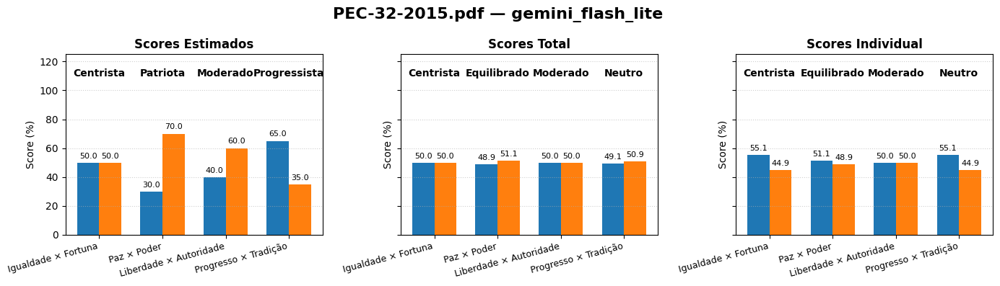

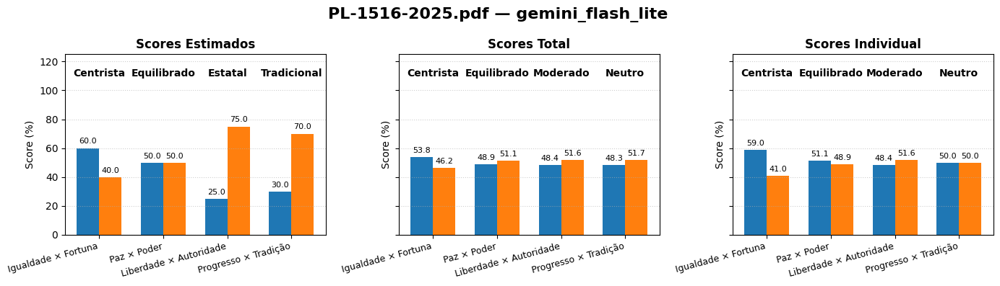

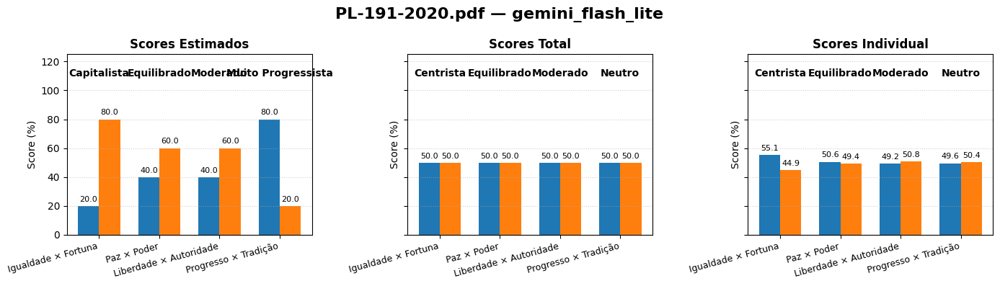

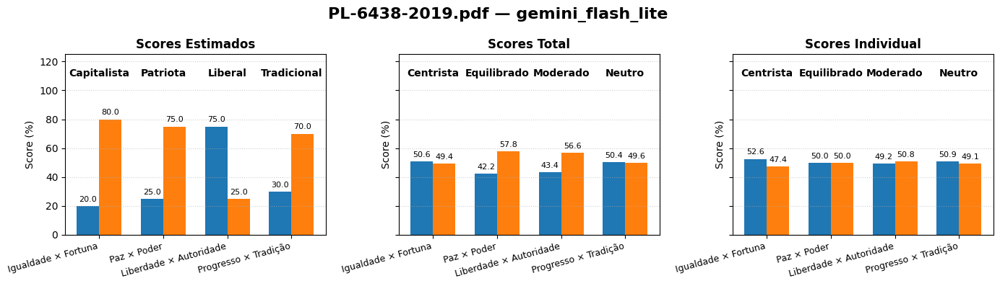

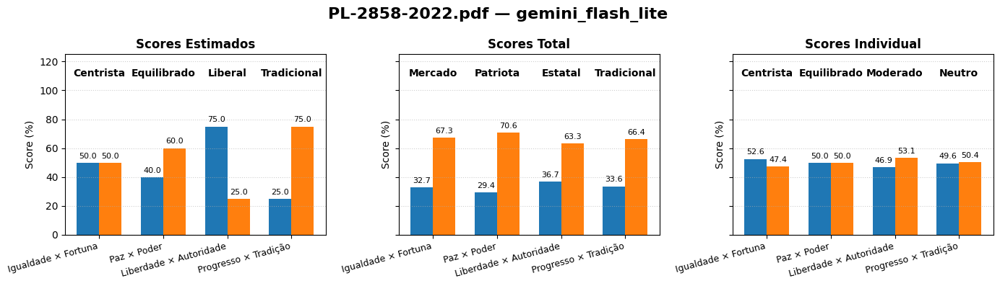

In [ ]:
for r in resultados:
  modelo = r.modelo
  texto = r.texto
  nome = r.nome

  values_estimado = Quiz8Values.calculate_8values(r.estimado, IDEOLOGIES)
  values_total = Quiz8Values.calculate_8values(r.quiz_total, IDEOLOGIES)
  values_individual = Quiz8Values.calculate_8values(r.quiz_individual, IDEOLOGIES)


  fig1, (ax1_est, ax1_tot, ax1_ind) = plt.subplots(1, 3, figsize=(14, 4), sharey=True)
  grafico_scores(values_estimado.scores.model_dump(), values_estimado.labels.to_list(), f"Scores Estimados", ax1_est)
  grafico_scores(values_total.scores.model_dump(), values_total.labels.to_list(), f"Scores Total", ax1_tot)
  grafico_scores(values_individual.scores.model_dump(), values_individual.labels.to_list(), f"Scores Individual",ax1_ind)

  fig1.suptitle(
      f"{nome} — {modelo}",
      fontsize=16,
      fontweight="bold"
  )

  plt.tight_layout()
  plt.show()

### Teste Planos Governo

In [ ]:
path = DRIVE_PATH + "textos_candidatos.json"

#### Gerar Dados

In [ ]:
candidatos = {
    "2026BR280002538811_01": "Samara Martins (UP)",
    "2026BR280002539826_01": "ROMEU ZEMA (NOVO)",
    "2026BR280002540694_01": "Renan Santos (Missão)",
    "2026BR280002541457_01": "Hertz Dias (PSTU)",
    "2026BR280002542548_01": "Lula (PT)",
    "2026BR280002548139_01": "Wilson Grassi (Democrata)",
    "2026BR280002551544_01": "Flávio Bolsonaro (PL)",
    "2026BR280002551547_01": "Augusto Cury (Avante)",
    "2026BR280002551932_01": "Ronaldo Caiado (PSD)",
    "2026BR280002551975_01": "Edmilson Costa (PCB)",
    "2026BR280002552484_01": "Clariana Barão (DC)",
    "2026BR280002552487_01":"Rui Costa Pimenta (PCO)"

}

In [ ]:
textos_governo = []

In [ ]:
for arquivo in Path(PLANO_GOVERNO_PATH).glob("*.pdf"):
  md = pymupdf4llm.to_markdown(arquivo, header=False, footer=False, use_ocr=False)
  txt = pymupdf4llm.to_text(arquivo, header=False, footer=False, use_ocr=False)
  filename = Path(arquivo).name
  key = filename[:-4]

  if key in candidatos:
    textos_governo.append({"filename":filename, "md":md, "txt":txt, "candidato": candidatos[key]})

In [ ]:
with open(path, "w") as f:
      json.dump(
        textos_governo,
        f,
        ensure_ascii=False,
        indent=4
    )

#### Testes

In [ ]:
planos_governo = ler_json(path)

##### Nuvem Lexical

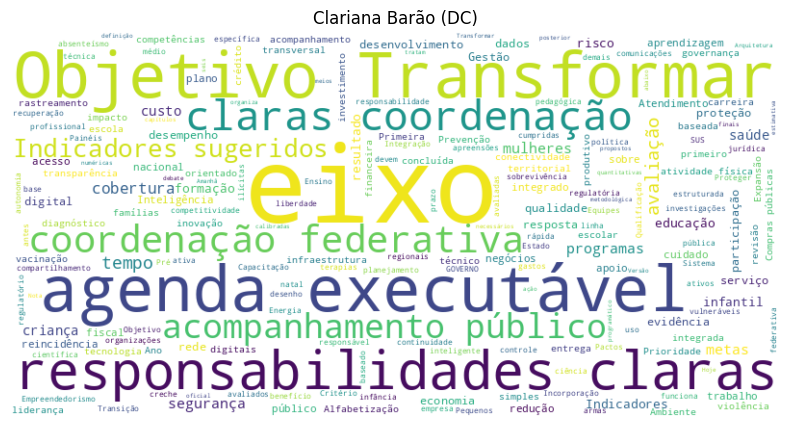

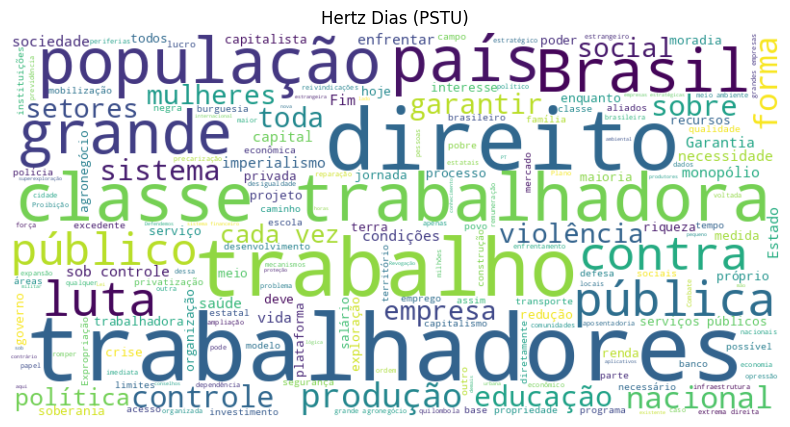

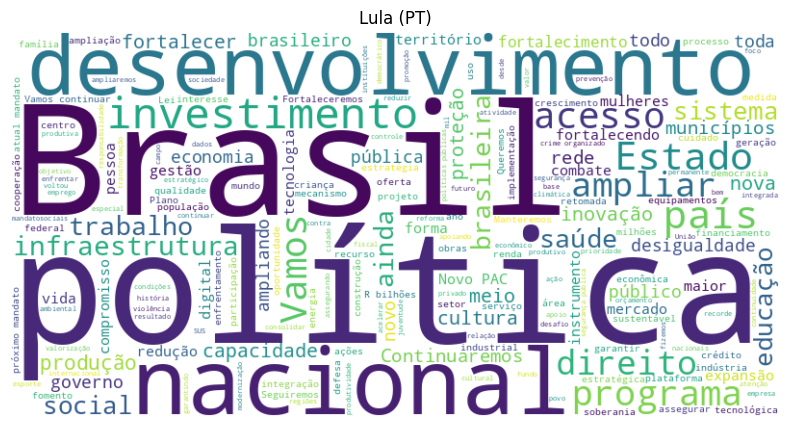

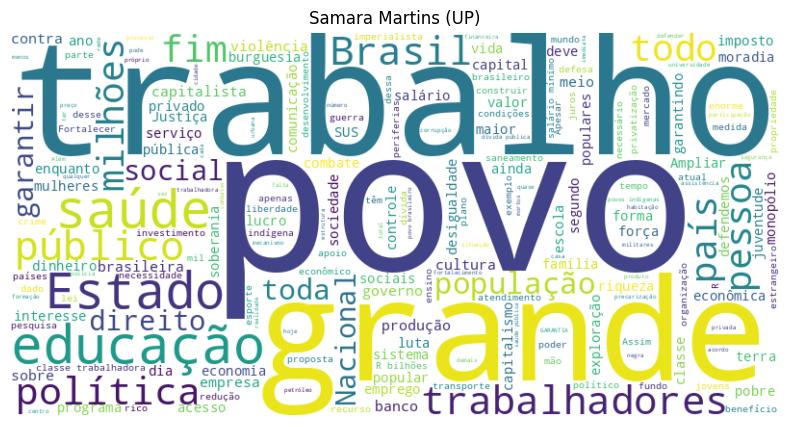

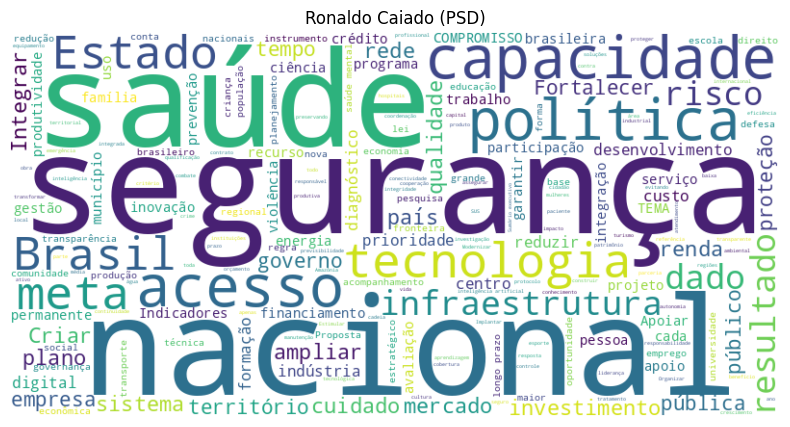

...

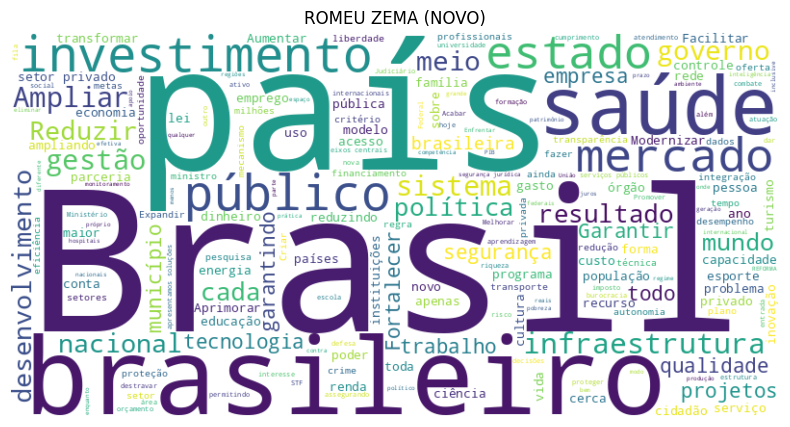

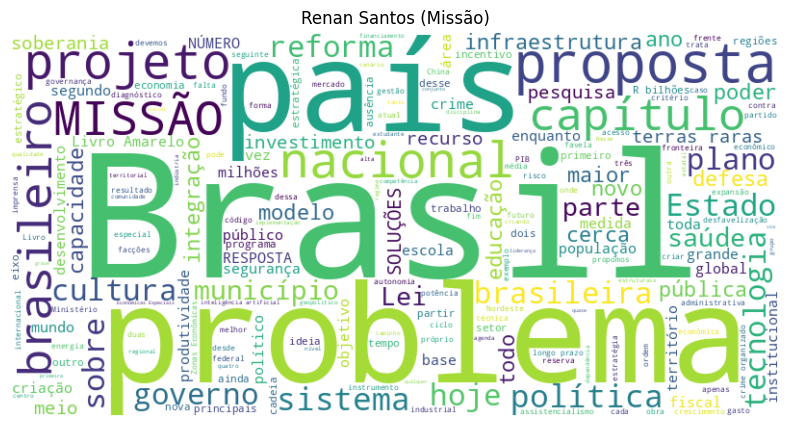

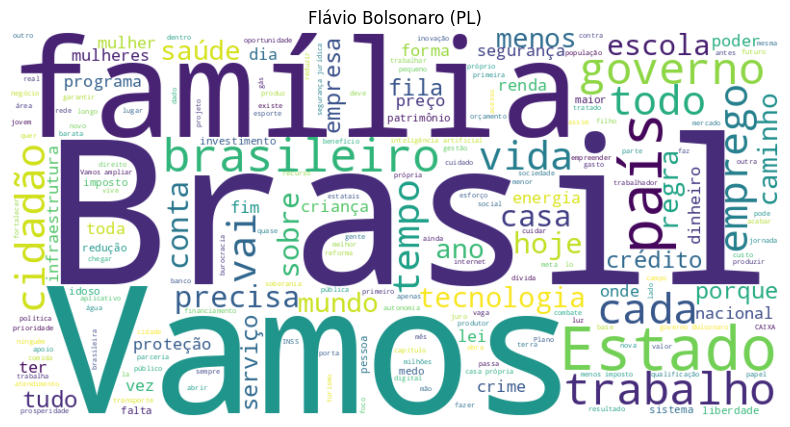

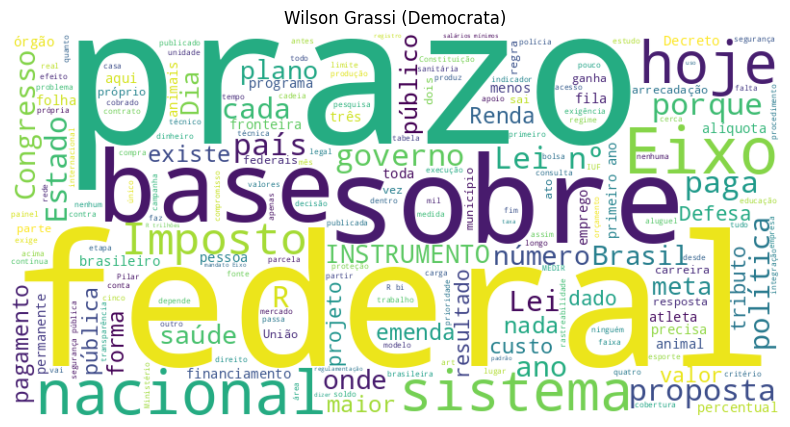

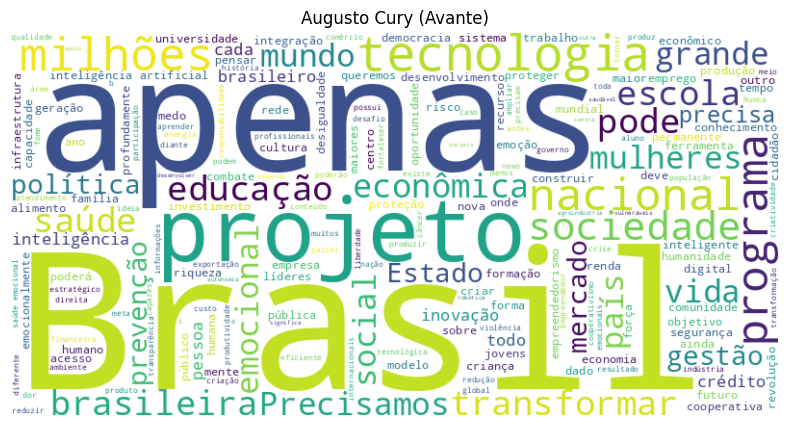

In [ ]:
 for plano in planos_governo:
  nuvem_lexical(plano['txt'],plano['candidato'])

##### Sabia

In [ ]:
modelo = "sabia"

###### Teste Estimado

In [ ]:
resultados_planos = []

In [ ]:
for plano in planos_governo:
  name = plano["candidato"]
  md = plano["md"]
  txt = plano["txt"]

  if name in [r["name"] for r in resultados_planos]:
    continue

  estimado_md = await EstimateResultModel(md, llm=MODELS[modelo])
  await asyncio.sleep(60)
  estimado_txt = await EstimateResultModel(txt, llm=MODELS[modelo])
  await asyncio.sleep(60)

  resultado = {
    "name":name,
    "estimado_md": estimado_md,
    "estimado_txt": estimado_txt
  }

  resultados_planos.append(resultado)

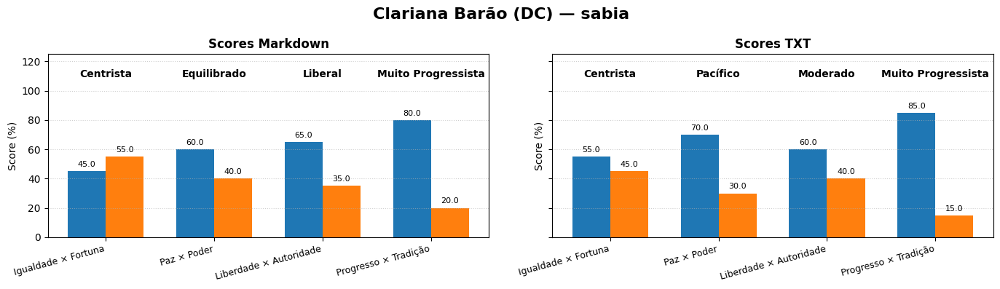

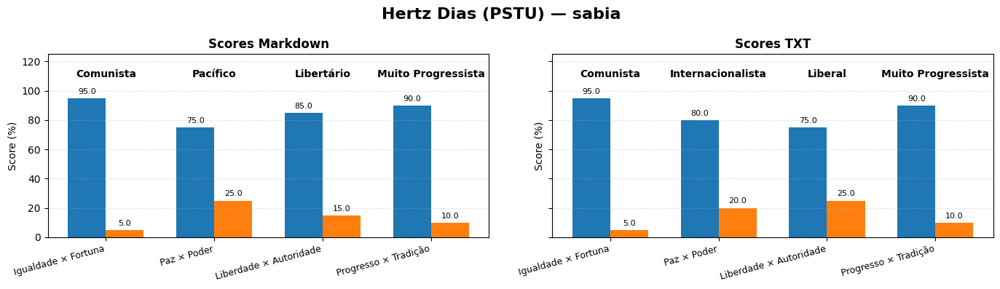

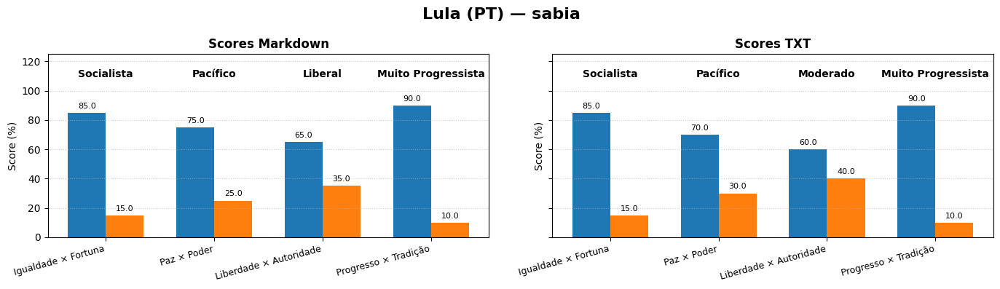

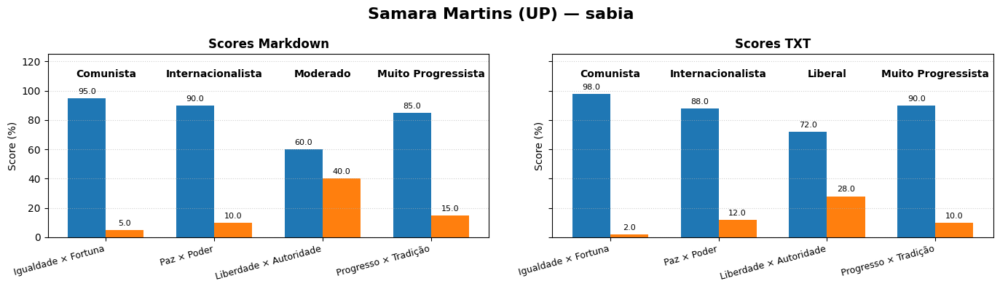

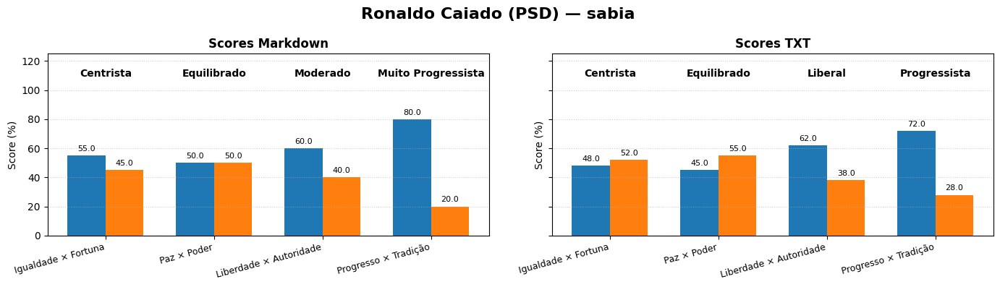

...

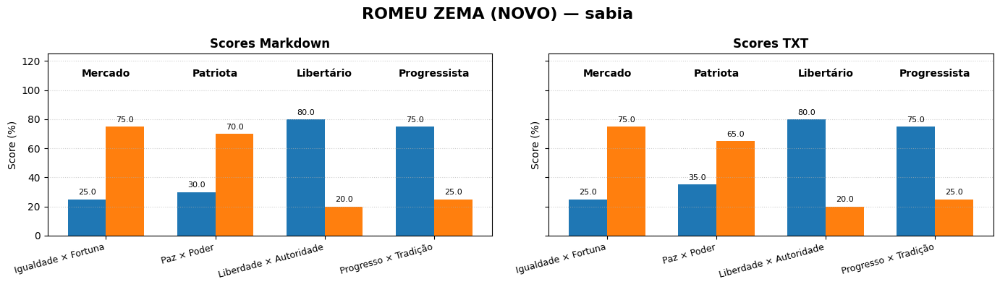

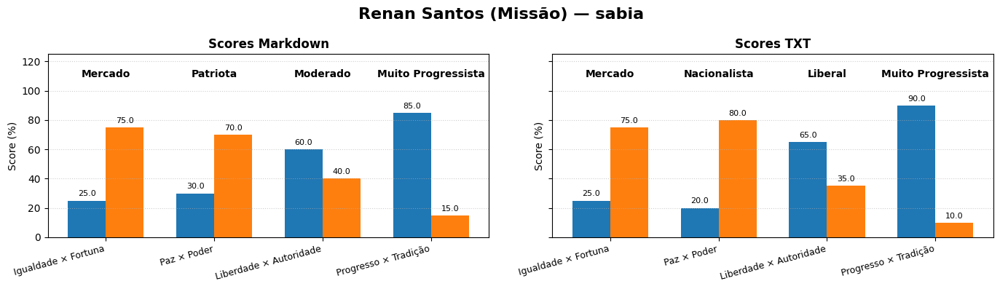

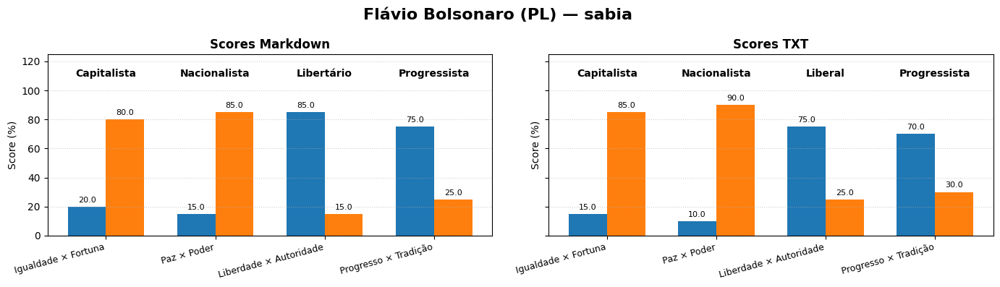

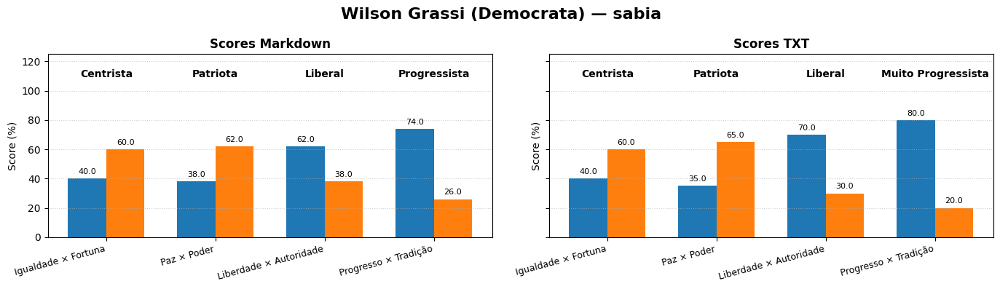

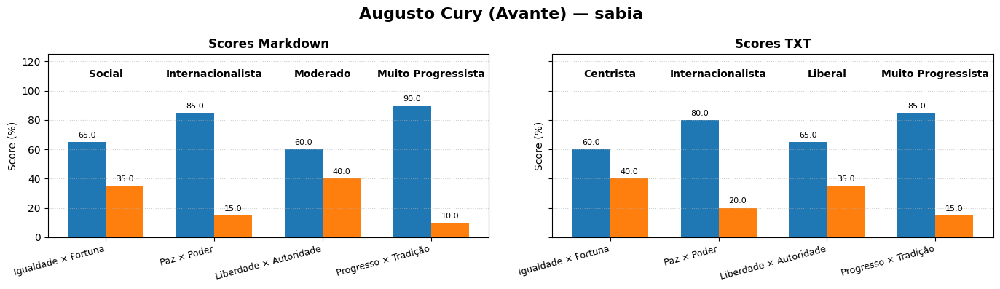

In [ ]:
for r in resultados_planos:
  nome = r["name"]

  values_md = Quiz8Values.calculate_8values(r["estimado_md"], IDEOLOGIES)
  values_txt = Quiz8Values.calculate_8values(r["estimado_txt"], IDEOLOGIES)

  fig1, (ax1_md, ax1_txt) = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

  grafico_scores(values_md.scores.model_dump(), values_md.labels.to_list(), f"Scores Markdown", ax1_md)
  grafico_scores(values_txt.scores.model_dump(), values_txt.labels.to_list(), f"Scores TXT", ax1_txt)

  fig1.suptitle(
      f"{nome} — {modelo}",
      fontsize=16,
      fontweight="bold"
  )

  plt.tight_layout()
  plt.show()

###### Teste Perguntas Total

In [ ]:
resultados_planos = []

In [ ]:
for plano in planos_governo:
  name = plano["candidato"]
  md = plano["md"]
  txt = plano["txt"]

  if name in [r["name"] for r in resultados_planos]:
    continue

  quiz_md = await all_questions(md,llm=MODELS[modelo])
  await asyncio.sleep(60)
  quiz_txt = await all_questions(txt,llm=MODELS[modelo])
  await asyncio.sleep(60)

  resultado = {
    "name":name,
    "estimado_md": quiz_md.get_results(),
    "estimado_txt": quiz_txt.get_results()
  }

  resultados_planos.append(resultado)

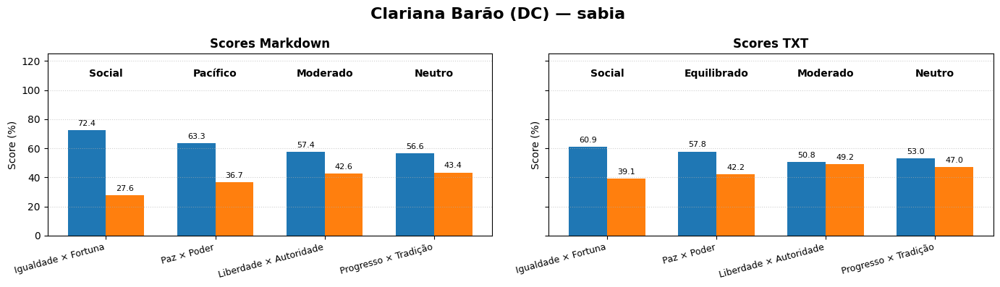

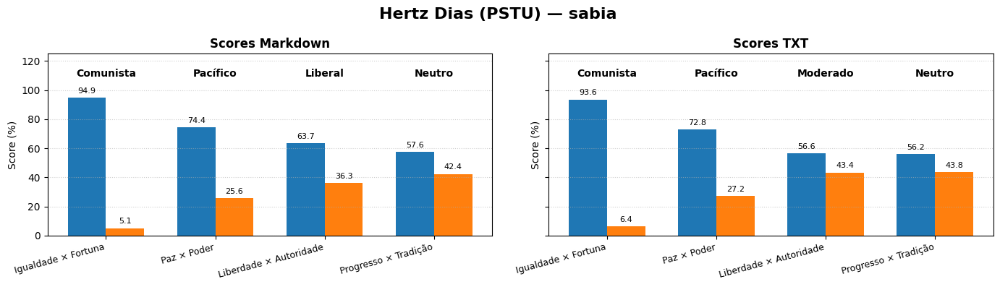

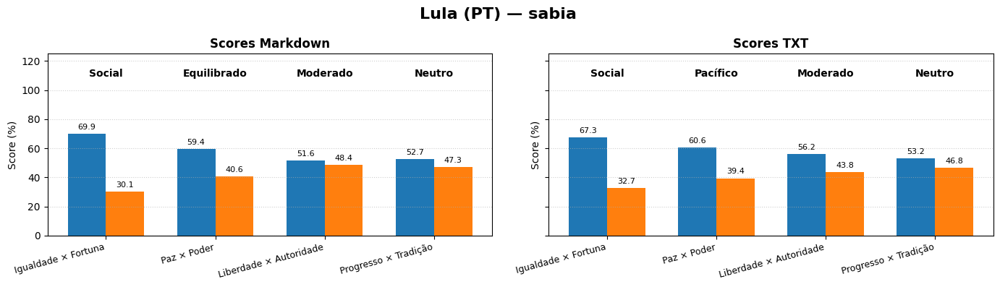

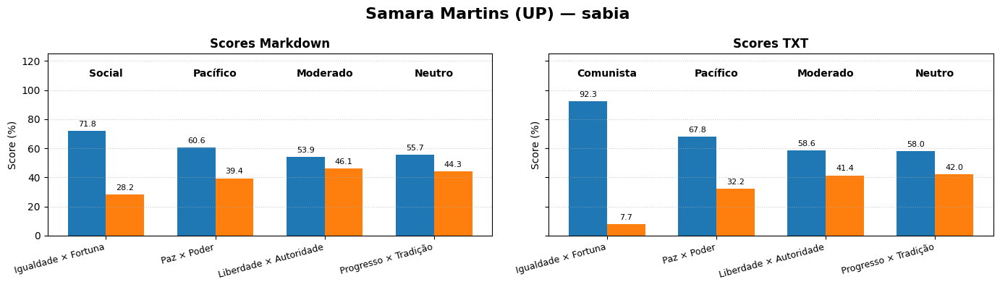

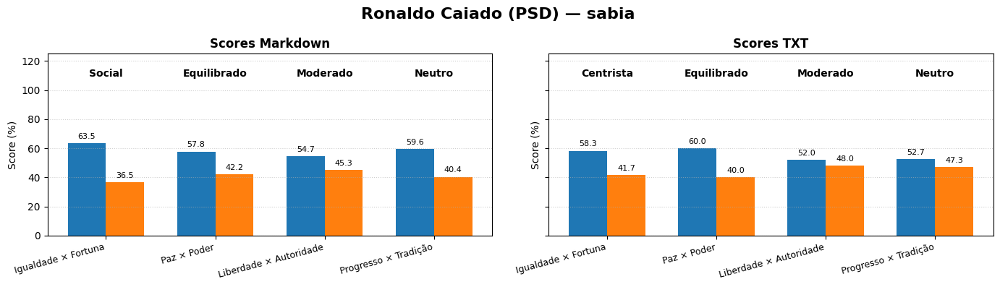

...

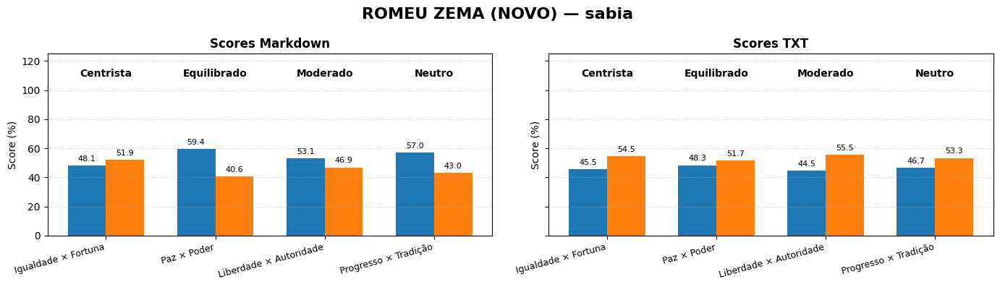

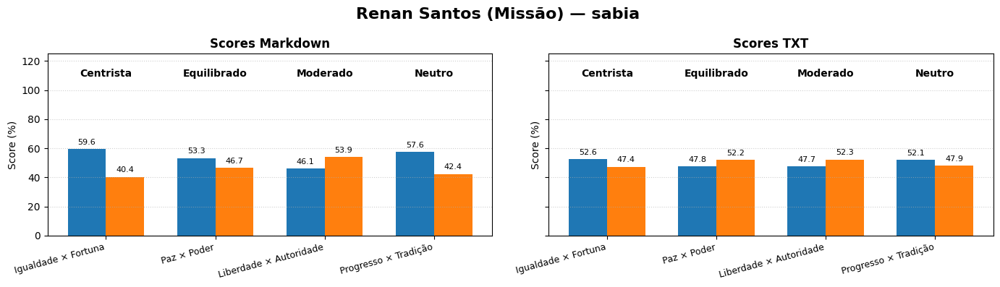

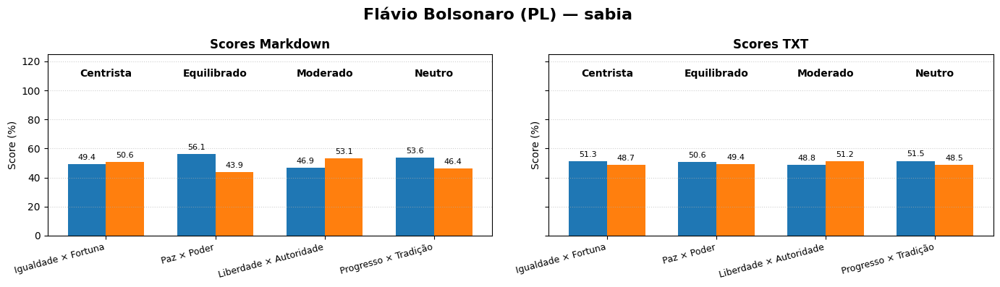

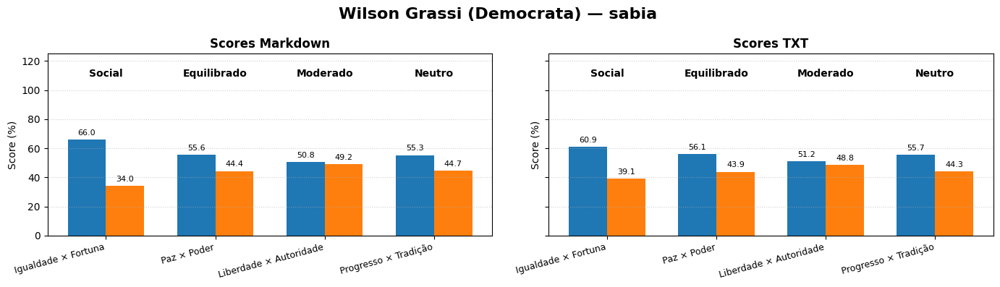

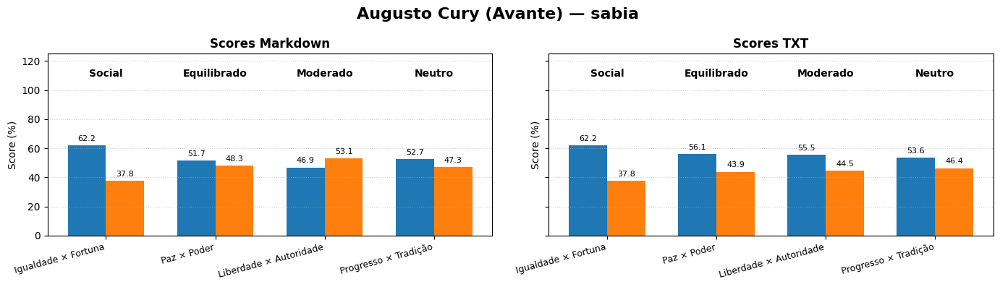

In [ ]:
for r in resultados_planos:
  nome = r["name"]

  values_md = Quiz8Values.calculate_8values(r["estimado_md"], IDEOLOGIES)
  values_txt = Quiz8Values.calculate_8values(r["estimado_txt"], IDEOLOGIES)

  fig1, (ax1_md, ax1_txt) = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

  grafico_scores(values_md.scores.model_dump(), values_md.labels.to_list(), f"Scores Markdown", ax1_md)
  grafico_scores(values_txt.scores.model_dump(), values_txt.labels.to_list(), f"Scores TXT", ax1_txt)

  fig1.suptitle(
      f"{nome} — {modelo}",
      fontsize=16,
      fontweight="bold"
  )

  plt.tight_layout()
  plt.show()

##### Gemini

In [ ]:
modelo = "gemini_flash"

###### Teste Estimado

In [ ]:
resultados_planos = []

In [ ]:
for plano in planos_governo:
  name = plano["candidato"]
  md = plano["md"]
  txt = plano["txt"]

  if name in [r["name"] for r in resultados_planos]:
    continue

  try:
    estimado_md = await EstimateResultModel(md, llm=MODELS[modelo])
    estimado_txt = await EstimateResultModel(txt, llm=MODELS[modelo])

    resultado = {
      "name":name,
      "estimado_md": estimado_md,
      "estimado_txt": estimado_txt
    }

    resultados_planos.append(resultado)
  except Exception as e:
    print(e)
    continue

503 UNAVAILABLE. {'error': {'code': 503, 'message': 'This model is currently experiencing high demand. Spikes in demand are usually temporary. Please try again later.', 'status': 'UNAVAILABLE'}}
503 UNAVAILABLE. {'error': {'code': 503, 'message': 'This model is currently experiencing high demand. Spikes in demand are usually temporary. Please try again later.', 'status': 'UNAVAILABLE'}}
503 UNAVAILABLE. {'error': {'code': 503, 'message': 'This model is currently experiencing high demand. Spikes in demand are usually temporary. Please try again later.', 'status': 'UNAVAILABLE'}}
503 UNAVAILABLE. {'error': {'code': 503, 'message': 'This model is currently experiencing high demand. Spikes in demand are usually temporary. Please try again later.', 'status': 'UNAVAILABLE'}}
503 UNAVAILABLE. {'error': {'code': 503, 'message': 'This model is currently experiencing high demand. Spikes in demand are usually temporary. Please try again later.', 'status': 'UNAVAILABLE'}}


In [ ]:
for r in resultados_planos:
  print(r)

{'name': 'Hertz Dias (PSTU)', 'estimado_md': Result(equality=98.0, peace=65.0, liberty=48.0, progress=92.0), 'estimado_txt': Result(equality=98.0, peace=65.0, liberty=60.0, progress=95.0)}
{'name': 'Lula (PT)', 'estimado_md': Result(equality=88.0, peace=65.0, liberty=55.0, progress=90.0), 'estimado_txt': Result(equality=88.0, peace=68.0, liberty=55.0, progress=88.0)}
{'name': 'Ronaldo Caiado (PSD)', 'estimado_md': Result(equality=38.0, peace=46.0, liberty=32.0, progress=58.0), 'estimado_txt': Result(equality=38.0, peace=38.0, liberty=32.0, progress=58.0)}
{'name': 'Renan Santos (Missão)', 'estimado_md': Result(equality=28.0, peace=22.0, liberty=20.0, progress=48.0), 'estimado_txt': Result(equality=30.0, peace=18.0, liberty=20.0, progress=48.0)}
{'name': 'ROMEU ZEMA (NOVO)', 'estimado_md': Result(equality=12.0, peace=42.0, liberty=52.0, progress=50.0), 'estimado_txt': Result(equality=15.0, peace=40.0, liberty=58.0, progress=58.0)}
{'name': 'Wilson Grassi (Democrata)', 'estimado_md': Res

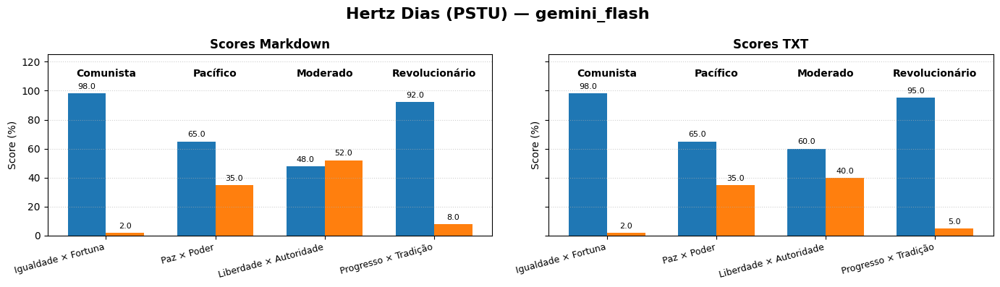

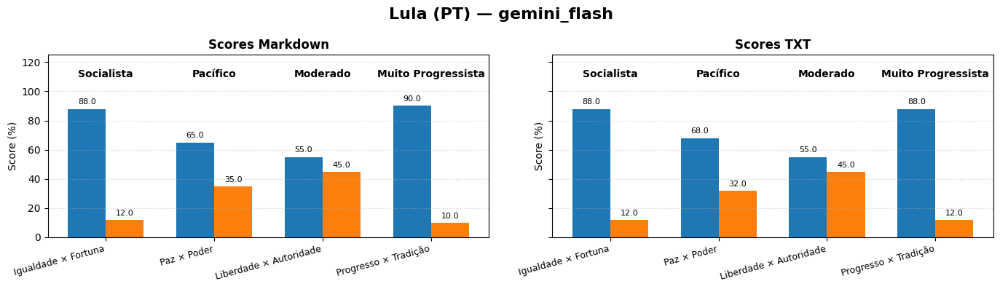

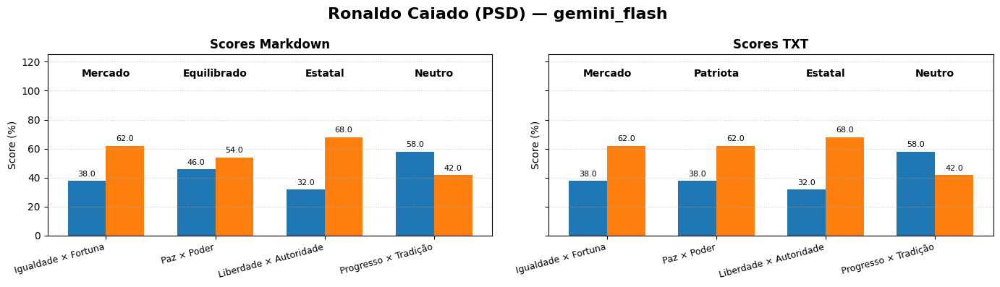

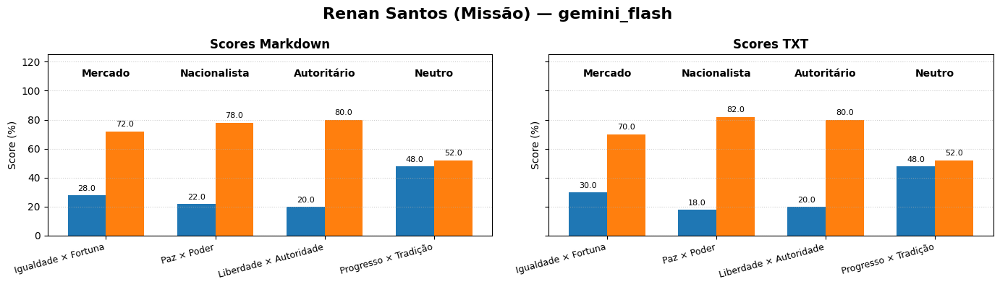

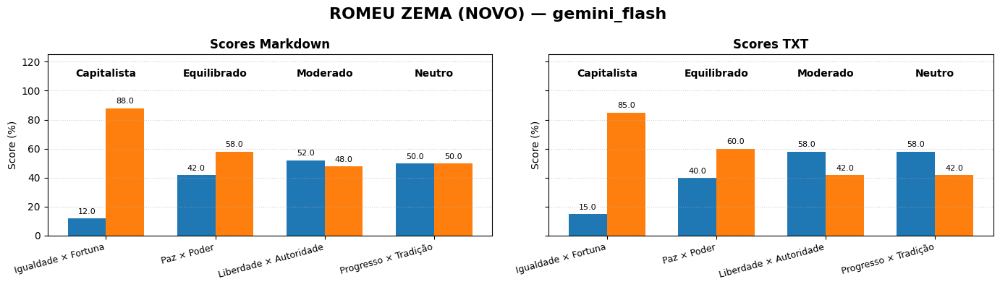

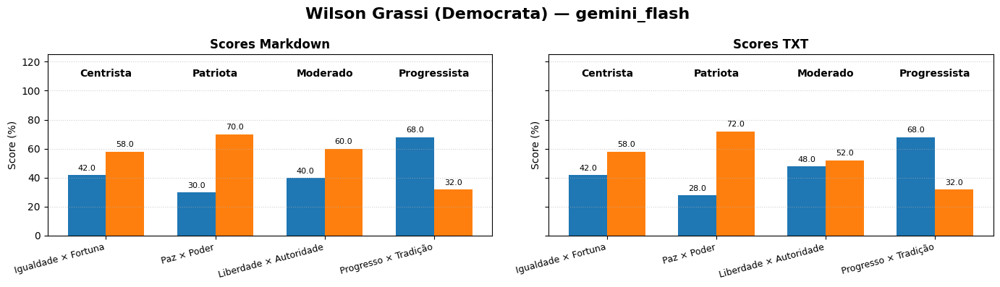

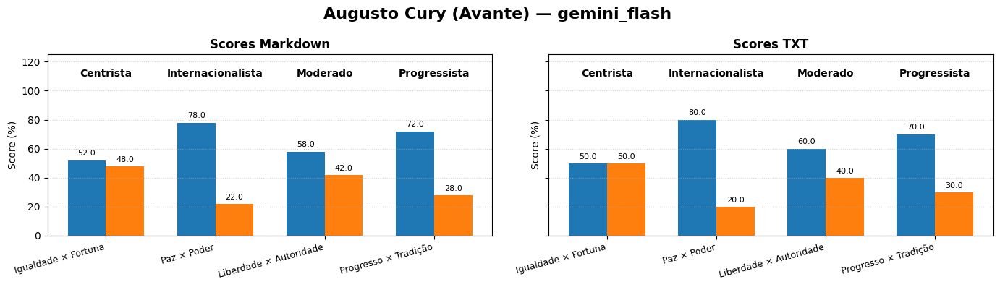

In [ ]:
for r in resultados_planos:
  nome = r["name"]

  values_md = Quiz8Values.calculate_8values(r["estimado_md"], IDEOLOGIES)
  values_txt = Quiz8Values.calculate_8values(r["estimado_txt"], IDEOLOGIES)

  fig1, (ax1_md, ax1_txt) = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

  grafico_scores(values_md.scores.model_dump(), values_md.labels.to_list(), f"Scores Markdown", ax1_md)
  grafico_scores(values_txt.scores.model_dump(), values_txt.labels.to_list(), f"Scores TXT", ax1_txt)

  fig1.suptitle(
      f"{nome} — {modelo}",
      fontsize=16,
      fontweight="bold"
  )

  plt.tight_layout()
  plt.show()

###### Teste Perguntas Total

In [ ]:
resultados_planos = []

In [ ]:
for plano in planos_governo:
  name = plano["candidato"]
  md = plano["md"]
  txt = plano["txt"]

  if name in [r["name"] for r in resultados_planos]:
    continue

  quiz_md = await all_questions(md,llm=MODELS[modelo])
  await asyncio.sleep(60)
  quiz_txt = await all_questions(txt,llm=MODELS[modelo])
  await asyncio.sleep(60)

  resultado = {
    "name":name,
    "estimado_md": quiz_md.get_results(),
    "estimado_txt": quiz_txt.get_results()
  }

  resultados_planos.append(resultado)

In [ ]:
for r in resultados_planos:
  nome = r["name"]

  values_md = Quiz8Values.calculate_8values(r["estimado_md"], IDEOLOGIES)
  values_txt = Quiz8Values.calculate_8values(r["estimado_txt"], IDEOLOGIES)

  fig1, (ax1_md, ax1_txt) = plt.subplots(1, 2, figsize=(14, 4), sharey=True)

  grafico_scores(values_md.scores.model_dump(), values_md.labels.to_list(), f"Scores Markdown", ax1_md)
  grafico_scores(values_txt.scores.model_dump(), values_txt.labels.to_list(), f"Scores TXT", ax1_txt)

  fig1.suptitle(
      f"{nome} — {modelo}",
      fontsize=16,
      fontweight="bold"
  )

  plt.tight_layout()
  plt.show()

### Teste Similaridade

#### Variáveis


In [ ]:
plano = planos_governo[0]

In [ ]:
texto = plano["txt"]
md = plano["md"]

In [ ]:
TEXTOS_EIXOS_1 = {
  "economic": {
      "equality": "Aqueles com pontuações mais altas de Igualdade acreditam que grandes diferenças econômicas e sociais devem ser reduzidas e que a organização da economia deve favorecer uma distribuição mais equilibrada de riqueza, recursos e oportunidades entre os membros da sociedade. Eles tendem a considerar legítima a utilização de políticas públicas para corrigir desigualdades existentes, apoiando medidas redistributivas, tributação progressiva e maior proteção aos grupos economicamente menos favorecidos. Para essas pessoas, tratar todos de maneira exatamente idêntica nem sempre produz maior igualdade, pois diferenças econômicas anteriores podem exigir tratamentos distintos para que as disparidades sejam efetivamente reduzidas. Em pontuações mais altas, podem defender formas mais amplas de nivelamento econômico, maior propriedade pública ou socialização dos meios de produção, entendendo que determinadas formas de propriedade privada podem produzir ou perpetuar relações de desigualdade. De maneira geral, valorizam uma sociedade em que diferenças de riqueza e poder econômico sejam limitadas e não determinem excessivamente as condições de vida dos indivíduos.",
      "wealth": "Aqueles com pontuações mais altas de Mercados acreditam que indivíduos e empresas devem possuir ampla autonomia para realizar atividades econômicas, celebrar contratos, possuir propriedades e competir entre si. Eles tendem a considerar a iniciativa privada e a concorrência mecanismos importantes para organizar a economia e preferem que grande parte das decisões sobre produção, investimento e consumo seja tomada de maneira descentralizada, em vez de determinada diretamente pelo Estado. Essas pessoas geralmente valorizam a propriedade privada, a liberdade econômica e a possibilidade de cada indivíduo buscar seus próprios interesses dentro de regras jurídicas comuns. Tendem também a desconfiar de formas excessivas de planejamento e controle estatal da economia. Em pontuações mais altas, aproximam-se das concepções de laissez-faire, defendendo intervenção governamental bastante limitada e maior liberdade para o funcionamento do mercado. Isso não significa necessariamente rejeitar toda ação estatal: mesmo dentro da tradição liberal, podem ser aceitas intervenções destinadas a garantir contratos, impedir monopólios, arbitrar conflitos e proteger direitos."
  },
  "diplomatic": {
      "might": "Aqueles com pontuações mais altas de Nação acreditam que a comunidade nacional constitui uma referência política fundamental e que a soberania, a independência e a capacidade de autodeterminação de um povo devem ser preservadas. Eles tendem a possuir forte identificação com o próprio país e a valorizar elementos compartilhados de pertencimento, como história, cultura, língua, costumes, símbolos e instituições nacionais. Essas pessoas costumam considerar importante que as decisões fundamentais de um Estado sejam tomadas por sua própria população, com pouca interferência de outros Estados ou instituições externas. Também tendem a dar maior peso aos interesses nacionais quando estes entram em conflito com objetivos internacionais mais amplos. Em pontuações elevadas, a lealdade à nação pode adquirir prioridade sobre vínculos políticos, ideológicos ou supranacionais, e a unidade e a independência nacionais podem ser vistas como objetivos políticos especialmente importantes. Essa orientação pode favorecer políticas mais centradas na soberania nacional, mas não implica necessariamente militarismo, expansionismo ou hostilidade a outros povos.",
      "peace": "Aqueles com pontuações mais altas de Globo acreditam que os indivíduos fazem parte de uma comunidade humana mais ampla e que as fronteiras nacionais não devem ser o limite principal da cooperação política. Eles tendem a enfatizar os valores, interesses e problemas compartilhados entre diferentes povos e a considerar que diversas questões econômicas, sociais e políticas exigem soluções que ultrapassem a atuação isolada dos Estados. Essas pessoas normalmente apoiam cooperação internacional, integração entre países, instituições multilaterais e formas de direito supranacional. Também tendem a aceitar que determinados aspectos da soberania nacional sejam compartilhados quando isso permite solucionar problemas comuns ou estabelecer instituições políticas mais amplas. Em pontuações mais altas, podem favorecer estruturas federativas ou supranacionais capazes de exercer autoridade acima dos Estados em determinadas áreas. De maneira geral, dão maior importância à solidariedade internacional, à interdependência entre sociedades e à ideia de que a pertença à humanidade pode ter importância política comparável ou superior à pertença exclusiva a uma nação."
  },
  "state": {
      "liberty": "Aqueles com pontuações mais altas de Liberdade acreditam que os indivíduos e grupos devem possuir ampla autonomia para escolher seus próprios valores, opiniões e formas de vida, sem interferência desnecessária do poder político. Eles tendem a apoiar fortes garantias às liberdades civis, incluindo liberdade de expressão, imprensa, reunião, associação e participação política, além da existência de pluralismo social e político. Essas pessoas consideram importante que diferentes ideias, organizações e projetos de vida possam coexistir e competir dentro da sociedade, e normalmente defendem limites jurídicos claros ao poder do Estado. Também tendem a valorizar instituições representativas, opinião pública livre e mecanismos que permitam aos cidadãos questionar e controlar os governantes. Em pontuações mais altas, mostram maior resistência à censura, à vigilância excessiva e às tentativas do Estado de impor aos indivíduos determinada visão moral, política ou social. Para elas, o poder político deve principalmente garantir um espaço no qual cada pessoa possa exercer sua autonomia, desde que respeite os direitos dos demais.",
      "authority": "Aqueles com pontuações mais altas de Autoridade acreditam que a estabilidade da sociedade depende da existência de instituições fortes, hierarquia, disciplina e capacidade efetiva de comando por parte do poder político. Eles tendem a considerar a manutenção da ordem e da coesão social mais importante do que uma ampla autonomia individual em determinadas circunstâncias e aceitam com maior facilidade restrições impostas pelo Estado quando estas são apresentadas como necessárias à segurança ou à estabilidade. Essas pessoas podem favorecer governos com maior concentração de poder, instituições executivas fortes e menor influência de grupos ou organizações capazes de dificultar a execução das decisões governamentais. Em pontuações mais altas, podem considerar legítima uma redução da participação política, da autonomia das instituições representativas e da oposição em benefício de uma direção política mais centralizada. Também apresentam maior aceitação do uso de mecanismos coercitivos para assegurar o cumprimento das decisões. Nos extremos, essa orientação aproxima-se do autoritarismo, caracterizado pela primazia do comando, da hierarquia e da obediência sobre o consenso e a participação."
  },
  "society": {
      "progress": "Aqueles com pontuações mais altas de Progresso acreditam que a sociedade não precisa permanecer limitada pelas instituições e costumes herdados do passado e que os seres humanos são capazes de transformar conscientemente suas condições de vida. Eles tendem a confiar na razão, no conhecimento, na investigação científica e na crítica como instrumentos para avaliar e aperfeiçoar instituições sociais e políticas. Essas pessoas geralmente possuem maior disposição para questionar tradições quando estas são consideradas incompatíveis com novos conhecimentos, valores ou necessidades sociais e costumam enxergar a mudança como uma oportunidade de aperfeiçoamento, e não apenas como uma ameaça à estabilidade. Também atribuem importância à autonomia dos indivíduos para participar do desenvolvimento histórico e influenciar o rumo da sociedade. Em pontuações mais altas, demonstram maior confiança na capacidade humana de reformar profundamente instituições e superar estruturas consideradas injustas, irracionais ou ultrapassadas. Entretanto, progresso não significa simplesmente qualquer mudança ou avanço tecnológico: uma transformação só pode ser considerada progresso quando é avaliada em relação a algum objetivo ou condição considerada melhor do que a anterior.",
      "tradition": "Aqueles com pontuações mais altas de Tradição acreditam que instituições, costumes e valores desenvolvidos historicamente possuem importância própria e não devem ser abandonados simplesmente em favor de novas ideias ou projetos de transformação social. Eles tendem a valorizar continuidade, estabilidade, experiência acumulada e mudanças graduais, demonstrando maior cautela diante de reformas profundas que pretendam reorganizar rapidamente a sociedade a partir de princípios abstratos. Essas pessoas costumam considerar que a ordem social contém práticas e instituições que foram construídas ao longo do tempo e cuja função nem sempre pode ser substituída por planejamento racional. Podem também atribuir maior importância à religião, à moral tradicional, à família, à autoridade e às formas históricas de organização social, embora nenhuma dessas características seja obrigatória isoladamente. Em pontuações mais altas, mostram maior preferência pela preservação das estruturas existentes e maior resistência a transformações sociais radicais. Isso não significa necessariamente rejeitar toda mudança, mas favorecê-la quando ocorre de maneira gradual e preserva elementos considerados fundamentais da ordem social."
  }
}

In [ ]:
TEXTOS_EIXOS_2 = {
    "economic": {
        "equality": """
        Redução das desigualdades econômicas e sociais.
        Distribuição mais equilibrada de renda, riqueza, recursos e oportunidades.
        Tributação progressiva e políticas de redistribuição de renda.
        Ação do Estado para reduzir desigualdades econômicas e remover obstáculos sociais.
        Proteção econômica aos grupos socialmente e economicamente menos favorecidos.
        Limitação da concentração de riqueza e de poder econômico.
        Maior participação pública, coletiva ou social na propriedade e na organização da economia.
        Priorização da igualdade econômica mesmo quando isso exige maior intervenção estatal.
        """,

        "wealth": """
        Livre iniciativa econômica e propriedade privada.
        Autonomia dos indivíduos e das empresas para tomar decisões econômicas.
        Concorrência como mecanismo de organização da economia.
        Liberdade de produção, investimento, contratação e consumo.
        Organização descentralizada da atividade econômica por mecanismos de mercado.
        Redução da intervenção direta e do planejamento estatal da economia.
        Defesa da propriedade particular e da iniciativa econômica individual.
        Privatização, desregulamentação e maior liberdade para o funcionamento dos mercados.
        Intervenção estatal limitada à garantia de direitos, contratos e regras de concorrência.
        """
    },

    "diplomatic": {
        "might": """
        Soberania e independência do Estado nacional.
        Autodeterminação política dos povos.
        Prioridade das decisões tomadas pela própria comunidade nacional.
        Valorização da identidade, história, cultura e instituições nacionais.
        Preservação da autonomia nacional diante de interferências externas.
        Prioridade dos interesses nacionais quando entram em conflito com interesses internacionais.
        Manutenção da soberania estatal sobre decisões políticas fundamentais.
        Valorização da coesão e da unidade nacional.
        """,

        "peace": """
        Cooperação política entre diferentes povos e Estados.
        Solidariedade e interdependência internacional.
        Soluções multilaterais para problemas que ultrapassam as fronteiras nacionais.
        Integração econômica, jurídica e política entre países.
        Fortalecimento de instituições internacionais e supranacionais.
        Compartilhamento de parcelas da soberania para solucionar problemas comuns.
        Construção de estruturas federativas ou supranacionais acima dos Estados.
        Valorização de interesses e direitos universais para além da pertença nacional.
        Maior integração política da humanidade.
        """
    },

    "state": {
        "liberty": """
        Proteção da autonomia individual diante do poder político.
        Garantia das liberdades civis e políticas.
        Liberdade de expressão, imprensa, reunião, associação e participação política.
        Pluralismo político, social e ideológico.
        Limitação jurídica do poder do Estado.
        Existência de diferentes grupos, organizações e centros de poder autônomos.
        Proteção dos direitos individuais contra interferências e restrições estatais.
        Controle dos governantes por instituições representativas e pela participação dos cidadãos.
        Resistência à censura, vigilância excessiva e concentração do poder político.
        """,

        "authority": """
        Concentração e centralização do poder político.
        Hierarquia, disciplina e obediência como princípios de organização social.
        Prioridade da ordem e da estabilidade sobre a autonomia individual.
        Fortalecimento da autoridade do Estado e do poder executivo.
        Redução da autonomia de grupos e instituições diante do governo.
        Restrição do pluralismo e da oposição política.
        Limitação da participação política quando considerada incompatível com a ordem.
        Uso de mecanismos coercitivos para assegurar o cumprimento das decisões políticas.
        Subordinação dos indivíduos e grupos à autoridade política central.
        """
    },

    "society": {
        "progress": """
        Transformação consciente das instituições sociais e políticas.
        Confiança na capacidade humana de melhorar a sociedade.
        Uso da razão, da ciência, do conhecimento e da crítica para avaliar instituições existentes.
        Questionamento de tradições consideradas injustas, irracionais ou ultrapassadas.
        Mudança social como possibilidade de aperfeiçoamento das condições humanas.
        Reforma de instituições diante de novos conhecimentos e necessidades sociais.
        Participação ativa dos indivíduos na transformação histórica da sociedade.
        Superação de estruturas sociais consideradas inadequadas.
        Valorização do aperfeiçoamento futuro em relação às condições existentes.
        """,

        "tradition": """
        Preservação de instituições, costumes e valores desenvolvidos historicamente.
        Valorização da continuidade e da estabilidade social.
        Preferência por mudanças graduais em vez de transformações profundas ou abruptas.
        Confiança na experiência histórica acumulada pelas instituições sociais.
        Cautela diante de projetos de reorganização racional e radical da sociedade.
        Preservação de estruturas sociais consideradas fundamentais para a ordem.
        Valorização da tradição, da família, da religião, da autoridade e da moral histórica.
        Resistência à ruptura com práticas e instituições consolidadas.
        Mudança social condicionada à preservação de elementos essenciais da ordem existente.
        """
    }
}

In [ ]:
RELEVANCE_ANCHORS = {

    "economic": [
        "tributação e impostos",
        "redistribuição de renda",
        "mercado e iniciativa privada",
        "privatização e empresas estatais",
        "regulação econômica",
        "atuação do Estado na economia",
    ],

    "diplomatic": [
        "política externa",
        "relações internacionais",
        "soberania nacional",
        "cooperação internacional",
        "multilateralismo",
        "integração entre países",
    ],

    "state": [
        "liberdades civis",
        "liberdade de expressão",
        "poder do Estado",
        "pluralismo político",
        "vigilância estatal",
        "concentração de poder",
    ],

    "society": [
        "tradições e costumes",
        "mudança social",
        "família e religião",
        "valores sociais",
        "reformas sociais",
        "transformações culturais",
    ],
}

#### Classe

In [ ]:
AXES = {
    "economic": ("equality", "wealth"),
    "diplomatic": ("peace", "might"),
    "state": ("liberty", "authority"),
    "society": ("progress", "tradition"),
}


class Semantic8Values:

    def __init__(
        self,
        textos_eixos: dict,
        model_name: str = "intfloat/multilingual-e5-base",
        temperature: float = 0.05,
    ):
        self.textos_eixos = textos_eixos
        self.temperature = temperature

        self.model = SentenceTransformer(
            model_name
        )

        self.axes = AXES

        self.axis_embeddings = self._create_axis_embeddings()


    def _create_axis_embeddings(self):

        embeddings = {}

        for axis, (positive, negative) in self.axes.items():

            positive_text = (
                self.textos_eixos[axis][positive]
            )

            negative_text = (
                self.textos_eixos[axis][negative]
            )

            positive_embedding = self.model.encode(
                f"passage: {positive_text}",
                normalize_embeddings=True,
            )

            negative_embedding = self.model.encode(
                f"passage: {negative_text}",
                normalize_embeddings=True,
            )

            direction = positive_embedding - negative_embedding
            direction =  direction / np.linalg.norm(direction)


            embeddings[axis] = {
                positive: positive_embedding,
                negative: negative_embedding,
                "direction": direction,
            }

        return embeddings


    def _calculate_axis(
        self,
        text_embedding,
        axis,
    ):
        positive, negative = self.axes[axis]

        positive_embedding = (
            self.axis_embeddings[axis][positive]
        )

        negative_embedding = (
            self.axis_embeddings[axis][negative]
        )

        direction = (
            self.axis_embeddings[axis]["direction"]
        )

        positive_similarity = float(
            np.dot(
                text_embedding,
                positive_embedding,
            )
        )

        negative_similarity = float(
            np.dot(
                text_embedding,
                negative_embedding,
            )
        )

        margin = (
            positive_similarity
            - negative_similarity
        )

        projection = float(
            np.dot(
                text_embedding,
                direction,
            )
        )

        return {
            "positive": positive,
            "negative": negative,
            "positive_similarity": positive_similarity,
            "negative_similarity": negative_similarity,
            "margin": margin,
            "projection": projection,
        }

    def _aggregate_axis(
        self,
        chunk_results: list[dict],
        axis: str,
    ):

        projections = [
            chunk["results"][axis]["projection"]
            for chunk in chunk_results
        ]

        margins = [
            chunk["results"][axis]["margin"]
            for chunk in chunk_results
        ]

        token_counts = [
            chunk["token_count"]
            for chunk in chunk_results
        ]

        projection = float(
            np.average(
                projections,
                weights=token_counts,
            )
        )

        margin = float(
            np.average(
                margins,
                weights=token_counts,
            )
        )

        score_margin = self._value_to_score(
            margin
        )

        score_projection = self._value_to_score(
            projection
        )

        return {
            "projection": projection,
            "margin" : margin,
            "score_margin": score_margin,
            "score_projection":score_projection
        }

    def _value_to_score(
        self,
        margin: float,
    ) -> float:

        return 100.0 / (
            1.0
            + math.exp(
                -margin / self.temperature
            )
        )

    def predict(
            self,
            text: str,
    ):
      chunks = self.chunk_text(text)

      chunk_results = []

      for chunk in chunks:

          text_embedding = self.model.encode(
              f"query: {chunk['text']}",
              normalize_embeddings=True,
          )

          results = {}

          for axis in self.axes:

              results[axis] = self._calculate_axis(
                  text_embedding,
                  axis,
              )

          chunk_results.append({
              "text": chunk["text"],
              "token_count": chunk["token_count"],
              "results": results,
          })

      results = {}

      for axis in self.axes:

          results[axis] = self._aggregate_axis(
              chunk_results,
              axis,
          )

      return results

    def chunk_text(
        self,
        text: str,
        chunk_size: int = 450,
        overlap: int = 50,
    ) -> list[dict]:

        tokens = self.model.tokenizer.encode(
            text,
            add_special_tokens=False,
        )

        chunks = []

        step = chunk_size - overlap

        for start in range(0, len(tokens), step):
            end = start + chunk_size

            chunk_tokens = tokens[start:end]

            chunk_text = self.model.tokenizer.decode(
                chunk_tokens,
                skip_special_tokens=True,
            )

            chunks.append({
                "text": chunk_text,
                "token_count": len(chunk_tokens),
            })

            if end >= len(tokens):
                break

        return chunks

    def plot_embeddings(
        self,
        text: str,
        annotate_chunks: bool = True,
    ):
        chunks = self.chunk_text(text)

        embeddings = []
        labels = []
        types = []

        # Embeddings dos polos
        for axis, (positive, negative) in self.axes.items():
            embeddings.append(
                self.axis_embeddings[axis][positive]
            )
            labels.append(f"{axis}: {positive}")
            types.append("positive")

            embeddings.append(
                self.axis_embeddings[axis][negative]
            )
            labels.append(f"{axis}: {negative}")
            types.append("negative")

        # Embeddings dos chunks do documento
        for index, chunk in enumerate(chunks):
            chunk_embedding = self.model.encode(
                f"query: {chunk['text']}",
                normalize_embeddings=True,
            )

            embeddings.append(chunk_embedding)
            labels.append(f"Chunk {index + 1}")
            types.append("chunk")

        embeddings = np.asarray(embeddings)

        # Redução de dimensionalidade
        pca = PCA(n_components=2)
        embeddings_2d = pca.fit_transform(embeddings)

        colors = {
            "positive": "#2ca02c",
            "negative": "#d62728",
            "chunk": "#1f77b4",
        }

        markers = {
            "positive": "o",
            "negative": "s",
            "chunk": "x",
        }

        fig, ax = plt.subplots(figsize=(12, 8))

        for point_type in ["positive", "negative", "chunk"]:
            indices = [
                index
                for index, value in enumerate(types)
                if value == point_type
            ]

            ax.scatter(
                embeddings_2d[indices, 0],
                embeddings_2d[indices, 1],
                c=colors[point_type],
                marker=markers[point_type],
                s=100 if point_type != "chunk" else 60,
                label=point_type.capitalize(),
                alpha=0.8,
            )

        for index, label in enumerate(labels):
            if types[index] != "chunk" or annotate_chunks:
                ax.annotate(
                    label,
                    (
                        embeddings_2d[index, 0],
                        embeddings_2d[index, 1],
                    ),
                    xytext=(5, 5),
                    textcoords="offset points",
                    fontsize=8,
                )

        explained_variance = pca.explained_variance_ratio_.sum() * 100

        ax.set_title(
            "Visualização 2D dos embeddings\n"
            f"Variância explicada pelo PCA: {explained_variance:.2f}%"
        )
        ax.set_xlabel("Componente principal 1")
        ax.set_ylabel("Componente principal 2")
        ax.axhline(0, color="gray", linewidth=0.5)
        ax.axvline(0, color="gray", linewidth=0.5)
        ax.legend()
        ax.grid(alpha=0.2)

        plt.tight_layout()
        plt.show()

        return embeddings_2d, labels

    def plot_axis_positions(
          self,
          text: str,
    ):
        chunks = self.chunk_text(text)

        fig, axes = plt.subplots(
            2,
            2,
            figsize=(14, 8),
        )

        axes = axes.flatten()

        for ax, axis in zip(axes, self.axes):
            positive, negative = self.axes[axis]

            positions = []
            token_counts = []

            for chunk in chunks:
                text_embedding = self.model.encode(
                    f"query: {chunk['text']}",
                    normalize_embeddings=True,
                )

                result = self._calculate_axis(
                    text_embedding,
                    axis,
                )

                positions.append(result["projection"])
                token_counts.append(chunk["token_count"])

            aggregate_position = np.average(
                positions,
                weights=token_counts,
            )

            ax.scatter(
                positions,
                np.zeros(len(positions)),
                color="#1f77b4",
                alpha=0.65,
                s=60,
                label="Chunks",
            )

            for index, position in enumerate(positions):
                ax.annotate(
                    str(index + 1),
                    (position, 0),
                    xytext=(0, 8),
                    textcoords="offset points",
                    ha="center",
                    fontsize=8,
                )

            ax.scatter(
                aggregate_position,
                0,
                color="#ff7f0e",
                marker="D",
                s=140,
                label="Documento agregado",
                zorder=5,
            )

            max_abs = max(
                max(np.abs(positions), default=0),
                abs(aggregate_position),
                0.05,
            )

            limit = max_abs * 1.25

            ax.set_xlim(-limit, limit)
            ax.set_ylim(-0.2, 0.2)

            ax.axvline(
                0,
                color="black",
                linestyle="--",
                linewidth=1,
            )

            ax.set_title(axis.capitalize())
            ax.set_xlabel(
                f"{negative}  ←  posição no eixo  →  {positive}"
            )
            ax.set_yticks([])
            ax.grid(axis="x", alpha=0.25)
            ax.legend(fontsize=8)

        plt.suptitle(
            "Posição semântica dos chunks nos eixos do 8values",
            fontsize=14,
            fontweight="bold",
        )

        plt.tight_layout()
        plt.show()

    def plot_embeddings_3d_interactive(
        self,
        text: str,
    ):
        chunks = self.chunk_text(text)

        embeddings = []
        labels = []
        point_types = []

        for axis, (positive, negative) in self.axes.items():
            embeddings.extend([
                self.axis_embeddings[axis][positive],
                self.axis_embeddings[axis][negative],
            ])

            labels.extend([
                f"{axis}: {positive}",
                f"{axis}: {negative}",
            ])

            point_types.extend([
                "Positive",
                "Negative",
            ])

        for index, chunk in enumerate(chunks):
            embedding = self.model.encode(
                f"query: {chunk['text']}",
                normalize_embeddings=True,
            )

            embeddings.append(embedding)
            labels.append(f"Chunk {index + 1}")
            point_types.append("Chunk")

        pca = PCA(n_components=3)

        coordinates = pca.fit_transform(
            np.asarray(embeddings)
        )

        dataframe = pd.DataFrame({
            "PC1": coordinates[:, 0],
            "PC2": coordinates[:, 1],
            "PC3": coordinates[:, 2],
            "label": labels,
            "type": point_types,
        })

        figure = px.scatter_3d(
            dataframe,
            x="PC1",
            y="PC2",
            z="PC3",
            color="type",
            symbol="type",
            hover_name="label",
            color_discrete_map={
                "Positive": "#2ca02c",
                "Negative": "#d62728",
                "Chunk": "#1f77b4",
            },
            title=(
                "Embeddings reduzidos para 3D — "
                f"variância explicada: "
                f"{pca.explained_variance_ratio_.sum() * 100:.2f}%"
            ),
        )

        figure.update_traces(
            marker={"size": 7}
        )

        figure.show()

        return dataframe

#### Métodos

In [ ]:
# Campo do 8values -> nome do eixo no Semantic8Values
EFFECT_TO_AXIS = {
    "econ": "economic",
    "dipl": "diplomatic",
    "govt": "state",
    "scty": "society",
}

def test_semantic8values(semantic: Semantic8Values):

  resultados_questions = []

  for question in QUESTIONS:

      question_id = question.id
      texto = question.question
      effects = question.effect.model_dump()

      # Executa o embedding apenas UMA vez para a pergunta
      resultado_semantico = semantic.predict(texto)

      # Uma mesma pergunta pode afetar vários eixos
      for effect_name, effect_value in effects.items():

          # effect = 0 significa que essa pergunta
          # não deveria afetar esse eixo
          # if effect_value == 0:
          #     continue

          if abs(effect_value) != 10:
            continue

          axis = EFFECT_TO_AXIS[effect_name]

          positive, negative = AXES[axis]

          resultado_axis = resultado_semantico[axis]

          margin = resultado_axis["margin"]
          projection = resultado_axis["projection"]

          # -----------------------------------------
          # Qual lado o 8values espera?
          # -----------------------------------------

          if effect_value > 0:
              expected = positive
          else:
              expected = negative

          # -----------------------------------------
          # Qual lado o embedding encontrou?
          # -----------------------------------------

          predicted_margin = (
              positive
              if margin > 0
              else negative
          )

          predicted_projection = (
              positive
              if projection > 0
              else negative
          )

          resultados_questions.append({
              "id": question_id,
              "axis": axis,
              "effect": effect_value,
              "expected": expected,

              "question": texto,

              "margin": margin,
              "projection": projection,

              "score_margin": resultado_axis["score_margin"],
              "score_projection": resultado_axis["score_projection"],

              "predicted_margin": predicted_margin,
              "predicted_projection": predicted_projection,

              "correct_margin": (
                  predicted_margin == expected
              ),

              "correct_projection": (
                  predicted_projection == expected
              ),
          })


  df_questions = pd.DataFrame(
      resultados_questions
  )

  return df_questions

def resumo_testes(df_questions):
  resumo = (
    df_questions
    .groupby("axis")
    .agg(
        quantidade=("id", "count"),

        acertos_margin=(
            "correct_margin",
            "sum"
        ),

        acertos_projection=(
            "correct_projection",
            "sum"
        ),
    )
)

  resumo["accuracy_margin"] = (
      resumo["acertos_margin"]
      / resumo["quantidade"]
  )

  resumo["accuracy_projection"] = (
      resumo["acertos_projection"]
      / resumo["quantidade"]
  )

  return resumo

In [ ]:
def details_to_result(details, campo):
    result = Result(
        equality=details["economic"][campo],
        peace=details["diplomatic"][campo],
        liberty=details["state"][campo],
        progress=details["society"][campo],
    )

    return result

#### Teste


In [ ]:
semantic_1 = Semantic8Values(TEXTOS_EIXOS_1)
semantic_2 = Semantic8Values(TEXTOS_EIXOS_2)

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] Token indices sequence length is longer than the specified maximum sequence length for this model (3311 > 512). Running this sequence through the model will result in indexing errors


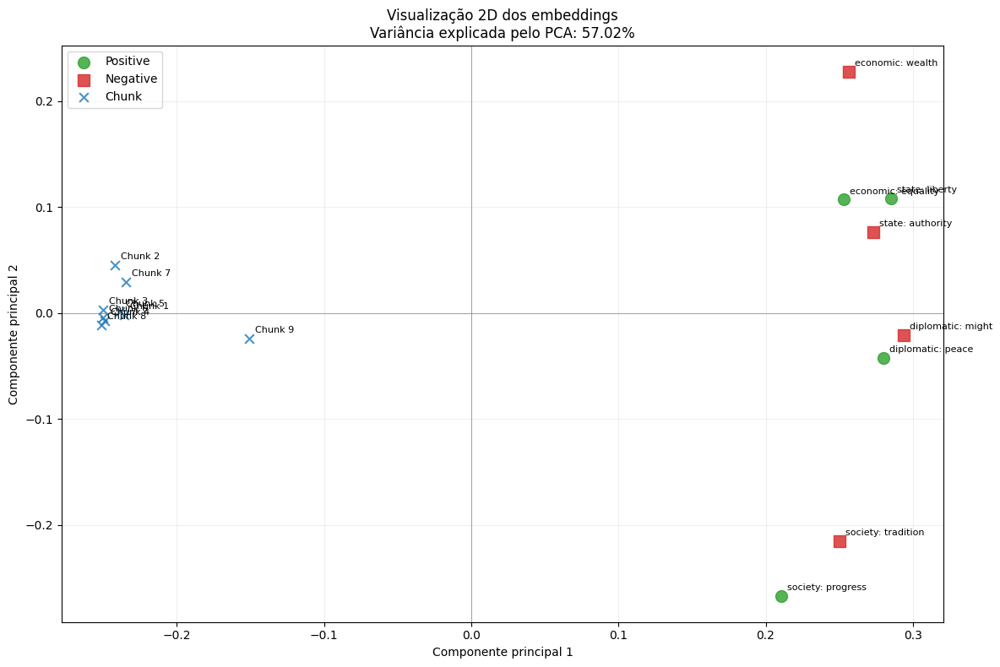

(array([[ 0.25311315,  0.10691066],
        [ 0.2565164 ,  0.22783983],
        [ 0.27989516, -0.04271213],
        [ 0.29356462, -0.02109734],
        [ 0.28498778,  0.10781898],
        [ 0.27316022,  0.07603465],
        [ 0.21042548, -0.26704744],
        [ 0.25029555, -0.2157992 ],
        [-0.23576924, -0.00222195],
        [-0.24210818,  0.04503695],
        [-0.25018778,  0.00314298],
        [-0.24893442, -0.00747898],
        [-0.2386247 ,  0.00094345],
        [-0.24992402, -0.0044073 ],
        [-0.2344562 ,  0.02903358],
        [-0.25109896, -0.01155794],
        [-0.15085478, -0.0244387 ]], dtype=float32),
 ['economic: equality',
  'economic: wealth',
  'diplomatic: peace',
  'diplomatic: might',
  'state: liberty',
  'state: authority',
  'society: progress',
  'society: tradition',
  'Chunk 1',
  'Chunk 2',
  'Chunk 3',
  'Chunk 4',
  'Chunk 5',
  'Chunk 6',
  'Chunk 7',
  'Chunk 8',
  'Chunk 9'])

In [ ]:
semantic_2.plot_embeddings(
    texto,
    annotate_chunks=True,
)

In [ ]:
semantic_2.plot_embeddings_3d_interactive(texto)

[transformers] Token indices sequence length is longer than the specified maximum sequence length for this model (3311 > 512). Running this sequence through the model will result in indexing errors


,PC1,PC2,PC3,label,type
0,0.253113,0.106910,-0.123218,economic: equality,Positive
1,0.256517,0.227838,-0.132783,economic: wealth,Negative
2,0.279895,-0.042712,0.122298,diplomatic: peace,Positive
3,0.293565,-0.021098,0.164587,diplomatic: might,Negative
4,0.284988,0.107821,0.075531,state: liberty,Positive
5,0.273160,0.076034,0.024107,state: authority,Negative
6,0.210425,-0.267047,-0.143944,society: progress,Positive
7,0.250295,-0.215799,-0.057814,society: tradition,Negative
8,-0.235769,-0.002220,0.002135,Chunk 1,Chunk
9,-0.242108,0.045042,-0.060624,Chunk 2,Chunk


[transformers] Token indices sequence length is longer than the specified maximum sequence length for this model (3311 > 512). Running this sequence through the model will result in indexing errors


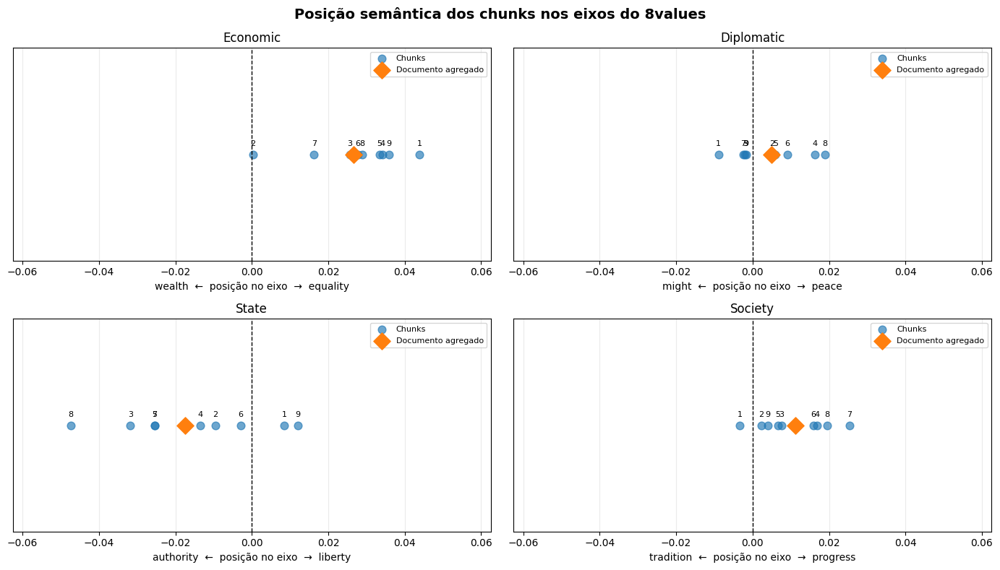

In [ ]:
semantic_2.plot_axis_positions(texto)

##### Teste Perguntas 8values

In [ ]:
df = test_semantic8values(semantic_1)

display(df)
display(resumo_testes(df))

,id,axis,effect,expected,question,margin,projection,score_margin,score_projection,predicted_margin,predicted_projection,correct_margin,correct_projection
0,1,economic,10,equality,A opressão por corporações é uma preocupação m...,-0.006156,-0.014538,46.925928,42.781990,wealth,wealth,False,False
1,2,economic,10,equality,É necessário que o governo intervenha na econo...,-0.012148,-0.028689,43.955457,36.036482,wealth,wealth,False,False
2,3,economic,-10,wealth,"Quanto mais livres os mercados, mais livres as...",-0.012442,-0.029383,43.810790,35.717371,wealth,wealth,True,True
3,4,economic,-10,wealth,É melhor manter um orçamento equilibrado do qu...,0.016082,0.037978,57.972266,68.125665,equality,equality,False,False
4,5,economic,10,equality,A pesquisa financiada publicamente é mais bené...,-0.001066,-0.002517,49.467155,48.741855,wealth,wealth,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,69,society,10,progress,Todas as pessoas - independentemente de fatore...,-0.002901,-0.008308,48.549898,45.855446,tradition,tradition,False,False
87,70,economic,-10,wealth,É importante que avancemos os objetivos do meu...,0.008397,0.019829,54.188504,59.786632,equality,equality,False,False
88,70,diplomatic,-10,might,É importante que avancemos os objetivos do meu...,-0.006379,-0.017166,46.814637,41.500325,might,might,True,True
89,70,state,-10,authority,É importante que avancemos os objetivos do meu...,0.012271,0.032665,56.105029,65.775573,liberty,liberty,False,False


,quantidade,acertos_margin,acertos_projection,accuracy_margin,accuracy_projection
axis,,,,,
diplomatic,21,13,13,0.619048,0.619048
economic,17,7,7,0.411765,0.411765
society,26,14,14,0.538462,0.538462
state,27,14,14,0.518519,0.518519


In [ ]:
df = test_semantic8values(semantic_2)

display(df)
display(resumo_testes(df))

,id,axis,effect,expected,question,margin,projection,score_margin,score_projection,predicted_margin,predicted_projection,correct_margin,correct_projection
0,1,economic,10,equality,A opressão por corporações é uma preocupação m...,-0.000337,-0.000781,49.831409,49.609452,wealth,wealth,False,False
1,2,economic,10,equality,É necessário que o governo intervenha na econo...,-0.006250,-0.014480,46.879199,42.810083,wealth,wealth,False,False
2,3,economic,-10,wealth,"Quanto mais livres os mercados, mais livres as...",-0.014545,-0.033700,42.778197,33.760017,wealth,wealth,True,True
3,4,economic,-10,wealth,É melhor manter um orçamento equilibrado do qu...,0.019873,0.046043,59.807535,71.521811,equality,equality,False,False
4,5,economic,10,equality,A pesquisa financiada publicamente é mais bené...,-0.001695,-0.003928,49.152503,48.037186,wealth,wealth,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,69,society,10,progress,Todas as pessoas - independentemente de fatore...,-0.003545,-0.009213,48.228398,45.406671,tradition,tradition,False,False
87,70,economic,-10,wealth,É importante que avancemos os objetivos do meu...,0.012686,0.029393,56.309344,64.287403,equality,equality,False,False
88,70,diplomatic,-10,might,É importante que avancemos os objetivos do meu...,-0.003124,-0.008093,48.438449,45.962401,might,might,True,True
89,70,state,-10,authority,É importante que avancemos os objetivos do meu...,-0.006477,-0.017667,46.766111,41.257230,authority,authority,True,True


,quantidade,acertos_margin,acertos_projection,accuracy_margin,accuracy_projection
axis,,,,,
diplomatic,21,14,14,0.666667,0.666667
economic,17,7,7,0.411765,0.411765
society,26,15,15,0.576923,0.576923
state,27,14,14,0.518519,0.518519


##### Teste Planos Governo

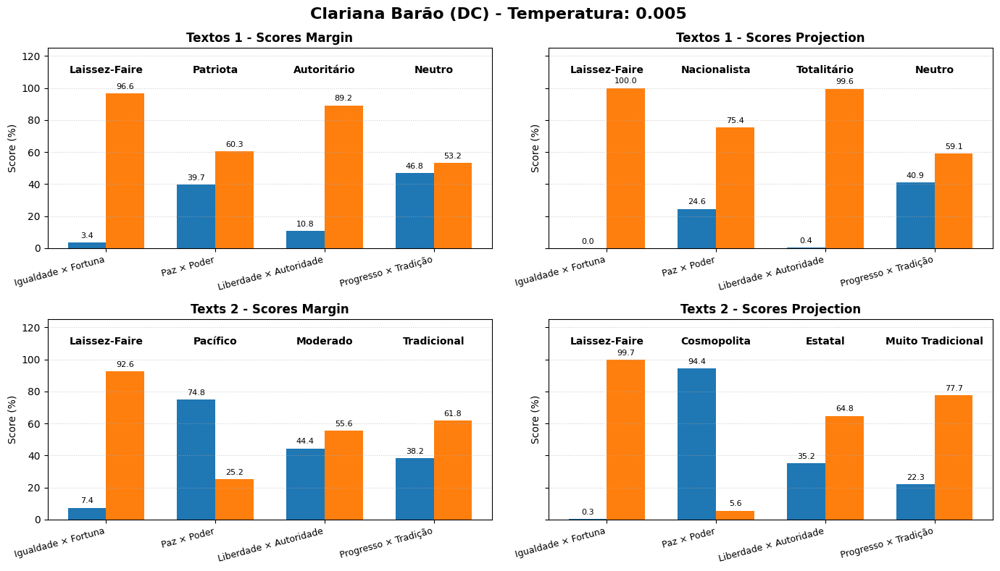

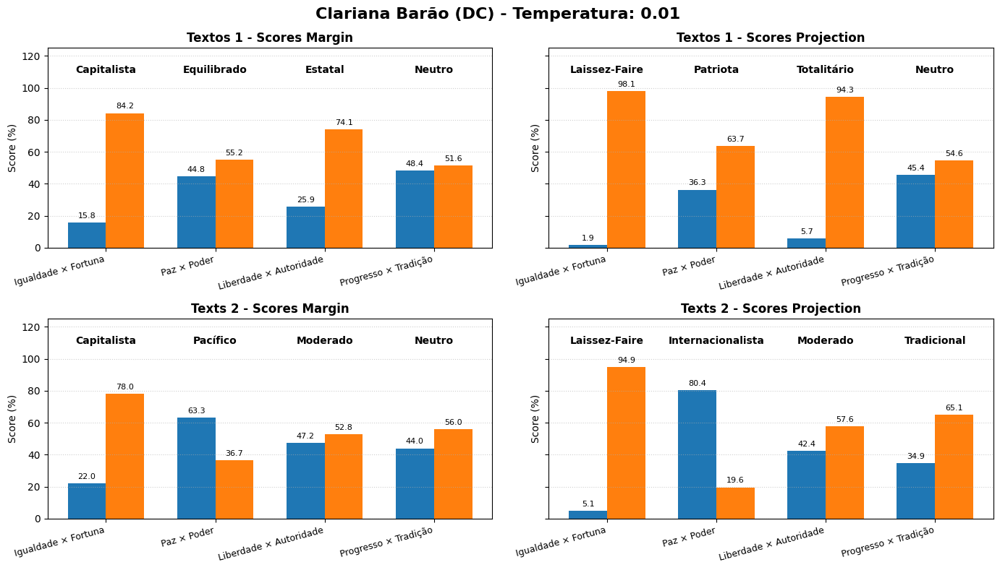

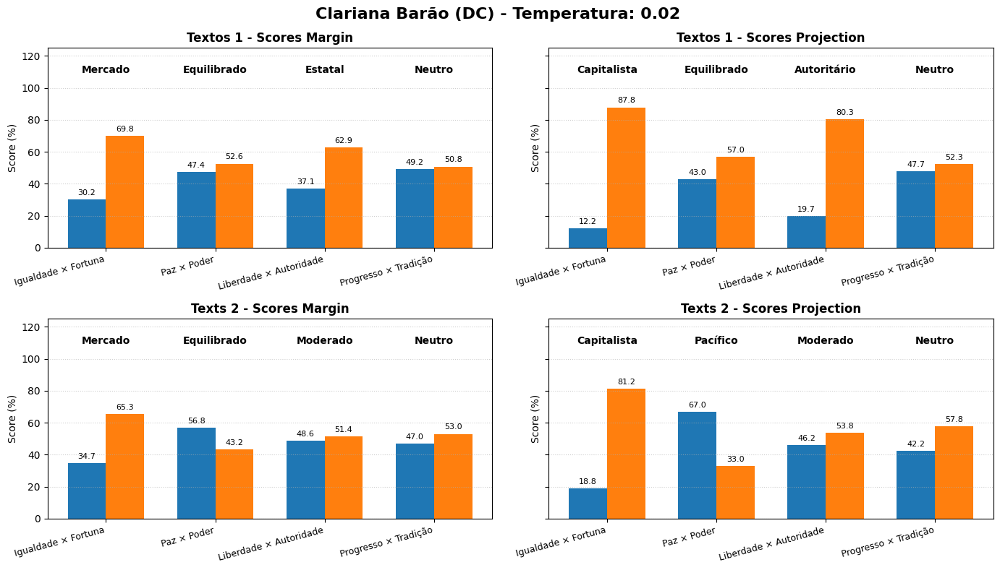

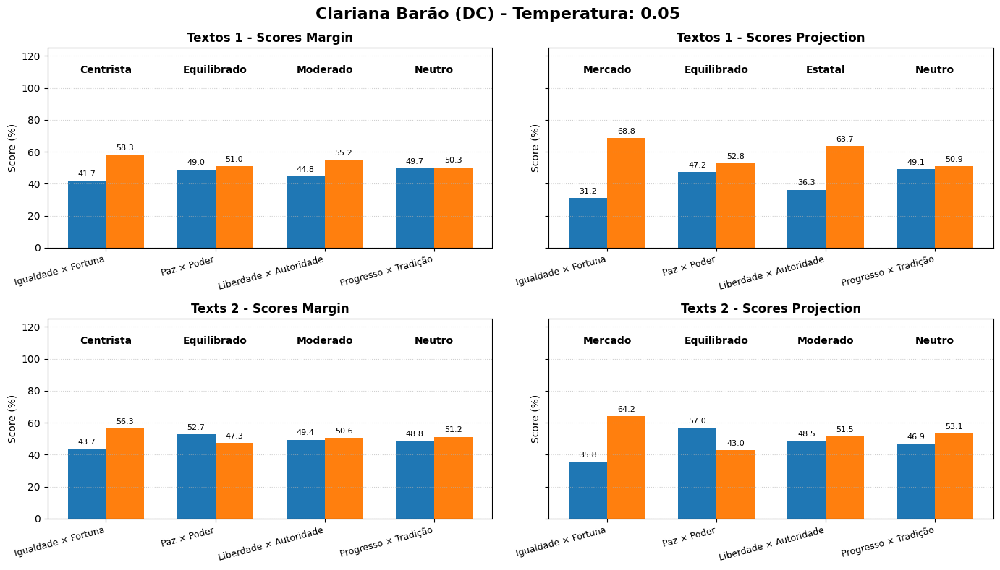

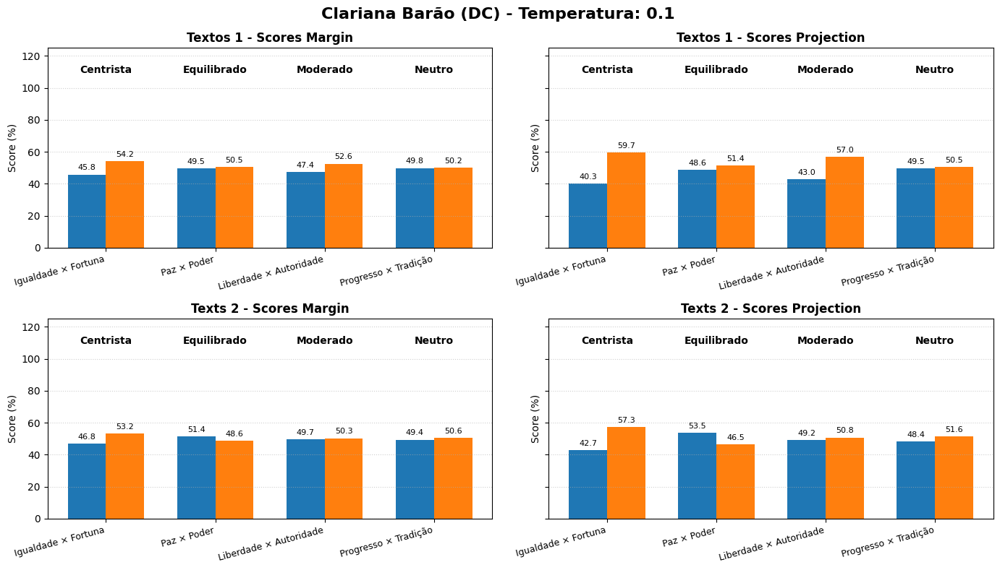

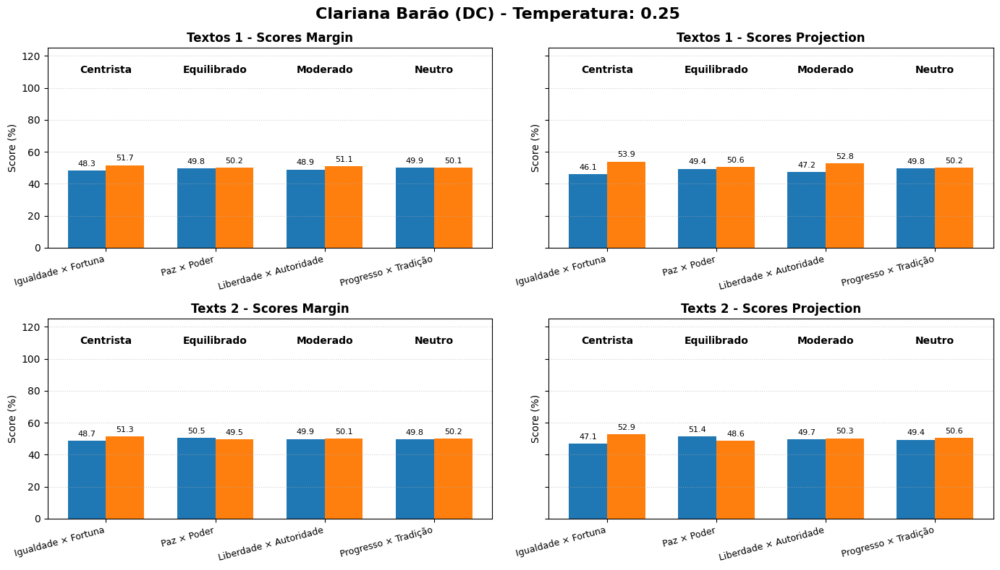

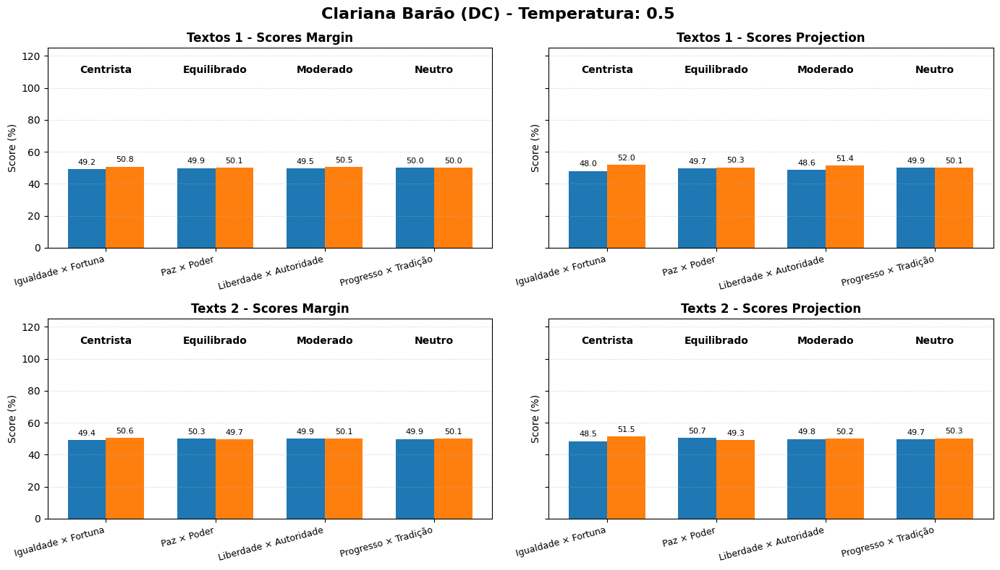

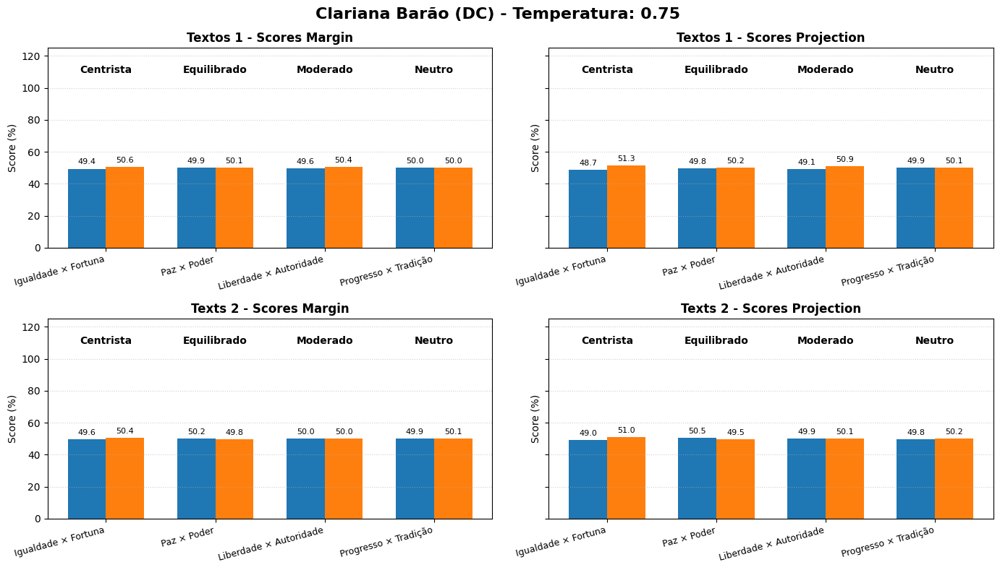

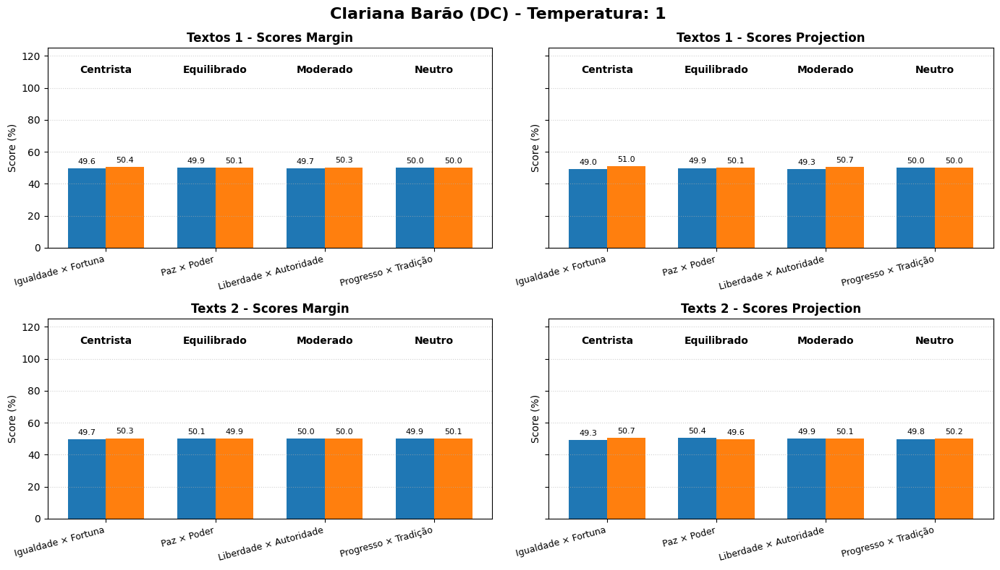

In [ ]:
for temperature in [0.005, 0.01, 0.02, 0.05, 0.1 , 0.25 , 0.5, 0.75, 1]:
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharey=True)

    models = [
        (semantic_1, axes[0, 0], axes[0, 1], "Textos 1"),
        (semantic_2, axes[1, 0], axes[1, 1], "Texts 2"),
    ]

    for semantic, ax_margin, ax_proj, model_name in models:
        semantic.temperature = temperature
        details = semantic.predict(texto)

        result_m = details_to_result(details, "score_margin")
        result_p = details_to_result(details, "score_projection")

        values_m = Quiz8Values.calculate_8values(result_m, IDEOLOGIES)
        values_p = Quiz8Values.calculate_8values(result_p, IDEOLOGIES)

        grafico_scores(
            values_m.scores.model_dump(),
            values_m.labels.to_list(),
            f"{model_name} - Scores Margin",
            ax_margin,
        )
        grafico_scores(
            values_p.scores.model_dump(),
            values_p.labels.to_list(),
            f"{model_name} - Scores Projection",
            ax_proj,
        )

    fig.suptitle(
        f"{plano['candidato']} - Temperatura: {temperature}",
        fontsize=16,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()
